In [0]:
import pandas as pd
import datetime
import json
import pandas_datareader as pdr
import numpy as np
import matplotlib.pyplot as plt
from keras import models
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from keras import layers
from matplotlib.image import imread
from keras.preprocessing import image
from sklearn.metrics import r2_score
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical




### Pulling stock list from Virtus LifeSci Biotech ETF

In [0]:
stocks = ['ITCI', 'AXSM', 'CVM', 'KRTX', 'APLS', 'PRVB', 'CRTX', 'EPZM',
       'CRBP', 'CCXI', 'TGTX', 'IMGN', 'FATE', 'AKBA', 'DNLI', 'RIGL', 
       'PRNB', 'ARVN', 'ZYME', 'MRNA', 'CYTK', 'FTSV', 'ASND',
       'XBIT', 'ALEC', 'ORTX', 'ADVM', 'MGNX', 'AKRO', 'ESPR', 'BHVN',
       'YMAB', 'RGNX', 'MYOK', 'TPTX', 'ATNX', 'BLUE', 'AGEN', 'AVRO',
       'DCPH', 'CTMX', 'SRNE', 'ARDX', 'BCRX', 'RETA', 'KOD', 'DTIL',
       'RARX', 'AUTL', 'GTHX', 'CARA', 'KDMN', 'XNCR', 'ACHN', 'ARNA',
       'RCKT', 'TBIO', 'VYGR', 'SGMO', 'ODT', 'ANAB', 'ATRA', 'CNST',
       'GERN', 'BPMC', 'ALLO', 'BBIO', 'FGEN', 'PGNX', 'MGTX', 'NXTC',
       'IMMU', 'ZIOP', 'CRSP', 'IOVA', 'VKTX', 'EIDX', 'MYOV', 'AMRS',
       'KRYS', 'KURA', 'MDGL', 'UBX', 'TCDA', 'QURE', 'MRTX', 'ASMB',
       'GLYC', 'RYTM', 'FIXX', 'DRNA', 'ARWR', 'ALLK', 'GOSS', 'WVE']

In [23]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### Creating dictionary and JSON

In [0]:
with open('/content/drive/My Drive/capstone_stock/1_31_2020_pull.json', 'r') as file:
    data = json.load(file)

### Creating the Target

In [0]:
#Next Day Max/Min Value (% Difference from Closing Price)¶
start = datetime.datetime.now()
period = [1, 2]
for stock in stocks:
    
    stock_dict_list = data[stock]
    num_days = len(stock_dict_list)
    for index, dict_ in enumerate(stock_dict_list):
        _open = dict_['Open']
        if index+period[1] >= num_days:
            _low = None
            _max = None
        else:
            _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
            _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
        stock_dict_list[index]['Low_1'] = _low
        stock_dict_list[index]['Max_1'] = _max
    data[stock] = stock_dict_list

# # 3 Day Max/Min Value (% Difference from Closing Price)
# # The range is from the 2nd day to the 3rd after the input day
# start = datetime.datetime.now()
# period = [2, 4]
# for stock in stocks:
    
#     stock_dict_list = data[stock]
#     num_days = len(stock_dict_list)
#     for index, dict_ in enumerate(stock_dict_list):
#         _open = dict_['Open']
#         if index+period[1] >= num_days:
#             _low = None
#             _max = None
#         else:
#             _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#             _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#         stock_dict_list[index]['Low_3'] = _low
#         stock_dict_list[index]['Max_3'] = _max
#     data[stock] = stock_dict_list

# # 10 Day Max/Min Value (% Difference from Closing Price)
# # The range is from the 4th day to the 10th after the input day

# start = datetime.datetime.now()
# period = [4, 11]
# for stock in stocks:
    
#     stock_dict_list = data[stock]
#     num_days = len(stock_dict_list)
#     for index, dict_ in enumerate(stock_dict_list):
#         _open = dict_['Open']
#         if index+period[1] >= num_days:
#             _low = None
#             _max = None
#         else:
#             _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#             _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#         stock_dict_list[index]['Low_10'] = _low
#         stock_dict_list[index]['Max_10'] = _max
#     data[stock] = stock_dict_list

# # 30 Day Max/Min Value (% Difference from Closing Price)
# # The range is from the 11th day to the 30th after the input day
# start = datetime.datetime.now()
# period = [11, 31]
# for stock in stocks:
    
#     stock_dict_list = data[stock]
#     num_days = len(stock_dict_list)
#     for index, dict_ in enumerate(stock_dict_list):
#         _open = dict_['Open']
#         if index+period[1] >= num_days:
#             _low = None
#             _max = None
#         else:
#             _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#             _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#         stock_dict_list[index]['Low_30'] = _low
#         stock_dict_list[index]['Max_30'] = _max
#     data[stock] = stock_dict_list

#### Scaling Input

In [0]:
for stock in stocks:
  df = pd.DataFrame(data[stock])
  max_value = df[['High', 'Low', 'Open', 'Close', 'Adj Close']].max()
  df[['High', 'Low', 'Open', 'Close', 'Adj Close']] = df[['High', 'Low', 'Open', 'Close', 'Adj Close']]/max_value
  df['Volume'] = df['Volume']/ df['Volume'].max()
  df= df.dropna()
  data[stock] = df.to_dict('records')

In [0]:
period = 60 # days of trading
for stock in stocks:
    
    stock_dict_list = data[stock]
    for index, dict_ in enumerate(stock_dict_list): 
        if index-period < 0:
            empty_array = None
            
        else:
            high = [dict_['High'] for dict_ in stock_dict_list[index-period:index]]
            low = [dict_['Low'] for dict_ in stock_dict_list[index-period:index]]
            volume = [dict_['Volume'] for dict_ in stock_dict_list[index-period:index]]
            open_ = [dict_['Open'] for dict_ in stock_dict_list[index-period:index]]
            ad_close = [dict_['Adj Close'] for dict_ in stock_dict_list[index-period:index]]
            close = [dict_['Close'] for dict_ in stock_dict_list[index-period:index]]
            high_change = [dict_['Max_1'] for dict_ in stock_dict_list[index-period:index]]
            low_change = [dict_['Low_1'] for dict_ in stock_dict_list[index-period:index]]
            empty_array = [high, low, open_, close, ad_close, volume, high_change, low_change]
            empty_array = np.array(empty_array).reshape(60,8)
        stock_dict_list[index]['Target'] = empty_array
    
    data[stock] = stock_dict_list
        
for stock in stocks:
    df = pd.DataFrame(data[stock])
    df= df.dropna()
    data[stock] = df.to_dict('records')  

In [0]:
data_list = []

for stock in stocks:
    stock_dict_list = data[stock]
    for index, dict_ in enumerate(stock_dict_list):
        list_ = [0, 0, 0, 0, 0, 0, 0]
        if dict_['Low_1'] <= -0.10:
            list_[0] = 1      
        else:
            if dict_['Low_1'] <= -0.075:
                list_[1] = 1
            else:
                if dict_['Low_1'] <= -0.05:
                    list_[2] = 1
                else:
                    if dict_['Low_1'] <= -0.025:
                        list_[3] = 1
                    else:
                        if dict_['Low_1'] <= -0.01:
                            list_[4] = 1
                        else:
                            if dict_['Low_1'] < 0:
                                list_[5] = 1
                            else:
                                list_[6] = 1
        stock_dict_list[index]['Low_1'] = list_  
        dict_['Low_1'] =list_
    data[stock] = stock_dict_list
    data_list.append(dict_)

In [35]:
seq_length = 60

model = models.Sequential()
model.add(layers.Conv1D(128, 3, activation='relu',  input_shape=(60, 8)))
model.add(layers.AveragePooling1D(3))
model.add(layers.Dropout(0.5))
model.add(layers.Conv1D(128, 3, activation='relu'))
model.add(layers.AveragePooling1D(3))
model.add(layers.Dropout(0.2))
model.add(layers.GRU(50, return_sequences=True))
model.add(layers.Dropout(0.5))
model.add(layers.GRU(100, return_sequences=False))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(7, activation = "softmax"))

model.compile(loss='categorical_crossentropy',
              optimizer='adam', metrics=['accuracy'])

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_5 (Conv1D)            (None, 58, 128)           3200      
_________________________________________________________________
average_pooling1d_5 (Average (None, 19, 128)           0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 19, 128)           0         
_________________________________________________________________
conv1d_6 (Conv1D)            (None, 17, 128)           49280     
_________________________________________________________________
average_pooling1d_6 (Average (None, 5, 128)            0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 5, 128)            0         
_________________________________________________________________
gru_5 (GRU)                  (None, 5, 50)            

Train on 1415 samples, validate on 50 samples
Epoch 1/100
1415/1415 [==============================] - 2s 1ms/step - loss: 1.8841 - acc: 0.2353 - val_loss: 1.9301 - val_acc: 0.1600
Epoch 2/100
1415/1415 [==============================] - 0s 214us/step - loss: 1.8575 - acc: 0.2481 - val_loss: 1.9026 - val_acc: 0.1800
Epoch 3/100
1415/1415 [==============================] - 0s 225us/step - loss: 1.8420 - acc: 0.2360 - val_loss: 1.9027 - val_acc: 0.1800
Epoch 4/100
1415/1415 [==============================] - 0s 231us/step - loss: 1.8450 - acc: 0.2459 - val_loss: 1.9104 - val_acc: 0.2000
Epoch 5/100
1415/1415 [==============================] - 0s 223us/step - loss: 1.8348 - acc: 0.2516 - val_loss: 1.9022 - val_acc: 0.1600
Epoch 6/100
1415/1415 [==============================] - 0s 229us/step - loss: 1.8366 - acc: 0.2445 - val_loss: 1.9149 - val_acc: 0.1800
Epoch 7/100
1415/1415 [==============================] - 0s 222us/step - loss: 1.8352 - acc: 0.2382 - val_loss: 1.9010 - val_acc: 0.18

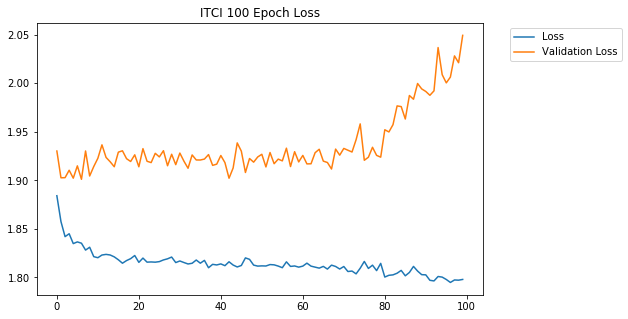

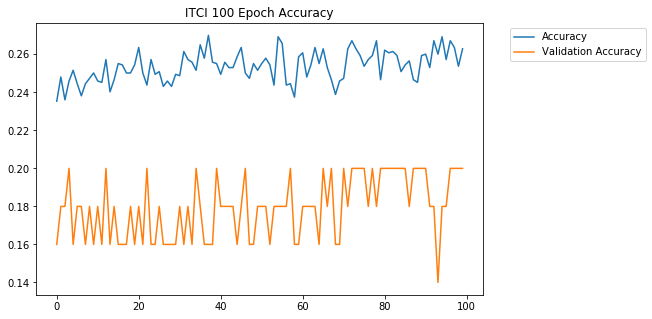

Train on 943 samples, validate on 50 samples
Epoch 1/100
943/943 [==============================] - 0s 309us/step - loss: 1.8752 - acc: 0.2683 - val_loss: 1.7797 - val_acc: 0.3800
Epoch 2/100
943/943 [==============================] - 0s 231us/step - loss: 1.8543 - acc: 0.2598 - val_loss: 1.7757 - val_acc: 0.3800
Epoch 3/100
943/943 [==============================] - 0s 226us/step - loss: 1.8434 - acc: 0.2566 - val_loss: 1.7733 - val_acc: 0.3800
Epoch 4/100
943/943 [==============================] - 0s 211us/step - loss: 1.8312 - acc: 0.2598 - val_loss: 1.7796 - val_acc: 0.3800
Epoch 5/100
943/943 [==============================] - 0s 218us/step - loss: 1.8305 - acc: 0.2577 - val_loss: 1.7974 - val_acc: 0.3800
Epoch 6/100
943/943 [==============================] - 0s 212us/step - loss: 1.8295 - acc: 0.2566 - val_loss: 1.7871 - val_acc: 0.3800
Epoch 7/100
943/943 [==============================] - 0s 237us/step - loss: 1.8337 - acc: 0.2534 - val_loss: 1.7812 - val_acc: 0.3800
Epoch 8/10

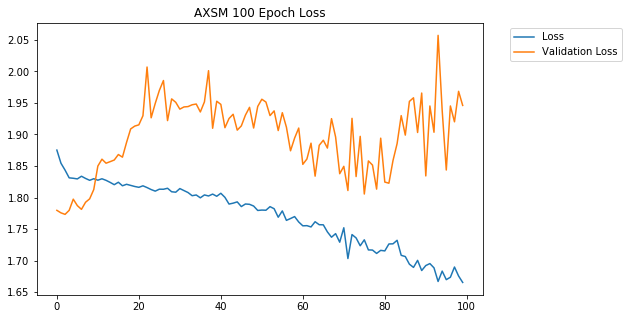

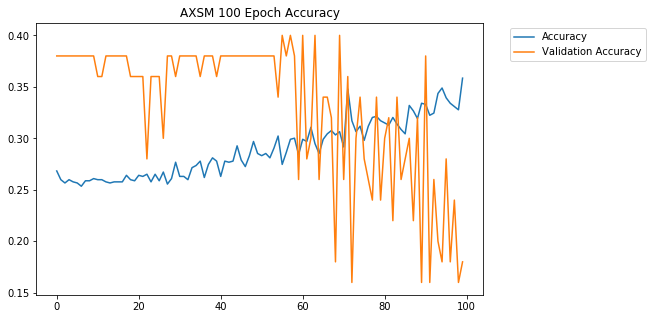

Train on 4939 samples, validate on 50 samples
Epoch 1/100
4939/4939 [==============================] - 1s 220us/step - loss: 1.8356 - acc: 0.2436 - val_loss: 1.8846 - val_acc: 0.4400
Epoch 2/100
4939/4939 [==============================] - 1s 211us/step - loss: 1.7773 - acc: 0.2567 - val_loss: 1.9425 - val_acc: 0.4200
Epoch 3/100
4939/4939 [==============================] - 1s 202us/step - loss: 1.7668 - acc: 0.2636 - val_loss: 1.9243 - val_acc: 0.4400
Epoch 4/100
4939/4939 [==============================] - 1s 207us/step - loss: 1.7644 - acc: 0.2636 - val_loss: 1.8995 - val_acc: 0.4400
Epoch 5/100
4939/4939 [==============================] - 1s 209us/step - loss: 1.7592 - acc: 0.2673 - val_loss: 1.9030 - val_acc: 0.4400
Epoch 6/100
4939/4939 [==============================] - 1s 205us/step - loss: 1.7559 - acc: 0.2727 - val_loss: 1.9026 - val_acc: 0.4600
Epoch 7/100
4939/4939 [==============================] - 1s 209us/step - loss: 1.7507 - acc: 0.2772 - val_loss: 1.8754 - val_acc: 0.

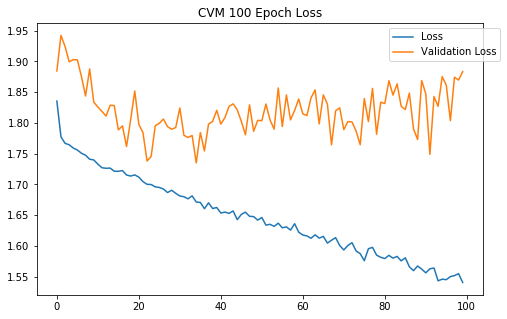

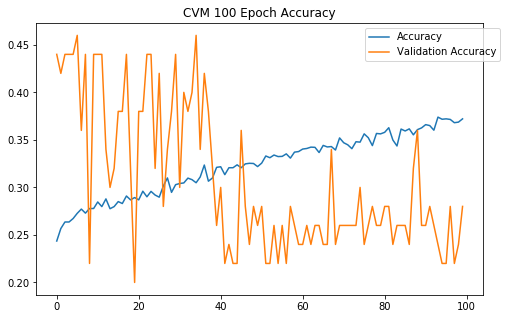

Train on 37 samples, validate on 50 samples
Epoch 1/100
37/37 [==============================] - 0s 3ms/step - loss: 1.9973 - acc: 0.2162 - val_loss: 2.3229 - val_acc: 0.1200
Epoch 2/100
37/37 [==============================] - 0s 723us/step - loss: 2.0105 - acc: 0.2162 - val_loss: 2.3164 - val_acc: 0.1200
Epoch 3/100
37/37 [==============================] - 0s 744us/step - loss: 1.9150 - acc: 0.2162 - val_loss: 2.3100 - val_acc: 0.1200
Epoch 4/100
37/37 [==============================] - 0s 809us/step - loss: 1.8864 - acc: 0.2703 - val_loss: 2.3045 - val_acc: 0.1200
Epoch 5/100
37/37 [==============================] - 0s 925us/step - loss: 1.9167 - acc: 0.2703 - val_loss: 2.3017 - val_acc: 0.1200
Epoch 6/100
37/37 [==============================] - 0s 996us/step - loss: 1.9623 - acc: 0.2703 - val_loss: 2.2988 - val_acc: 0.1200
Epoch 7/100
37/37 [==============================] - 0s 903us/step - loss: 1.8942 - acc: 0.3243 - val_loss: 2.2960 - val_acc: 0.1200
Epoch 8/100
37/37 [========

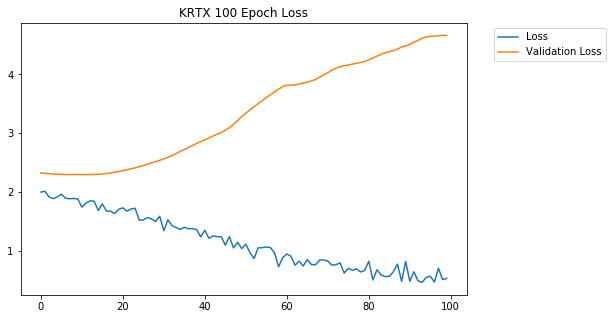

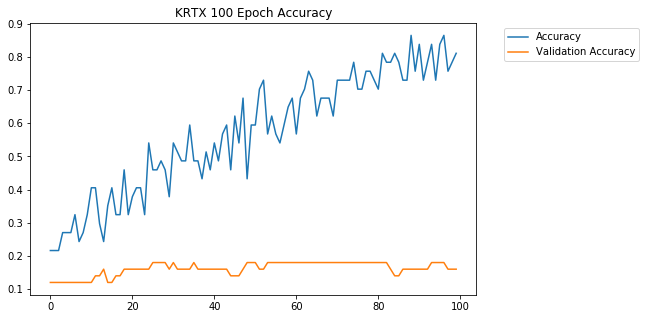

Train on 447 samples, validate on 50 samples
Epoch 1/100
447/447 [==============================] - 0s 445us/step - loss: 2.9346 - acc: 0.2461 - val_loss: 2.2308 - val_acc: 0.2200
Epoch 2/100
447/447 [==============================] - 0s 241us/step - loss: 2.1534 - acc: 0.2349 - val_loss: 1.7790 - val_acc: 0.3200
Epoch 3/100
447/447 [==============================] - 0s 245us/step - loss: 1.9108 - acc: 0.2237 - val_loss: 1.8593 - val_acc: 0.2200
Epoch 4/100
447/447 [==============================] - 0s 263us/step - loss: 1.9145 - acc: 0.2148 - val_loss: 1.7801 - val_acc: 0.2800
Epoch 5/100
447/447 [==============================] - 0s 245us/step - loss: 1.8765 - acc: 0.2416 - val_loss: 1.7490 - val_acc: 0.3200
Epoch 6/100
447/447 [==============================] - 0s 231us/step - loss: 1.8611 - acc: 0.2349 - val_loss: 1.7764 - val_acc: 0.3200
Epoch 7/100
447/447 [==============================] - 0s 265us/step - loss: 1.8523 - acc: 0.2774 - val_loss: 1.7944 - val_acc: 0.2000
Epoch 8/10

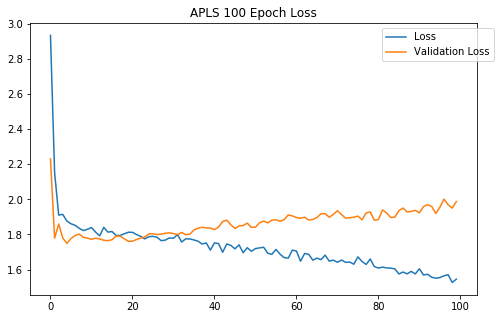

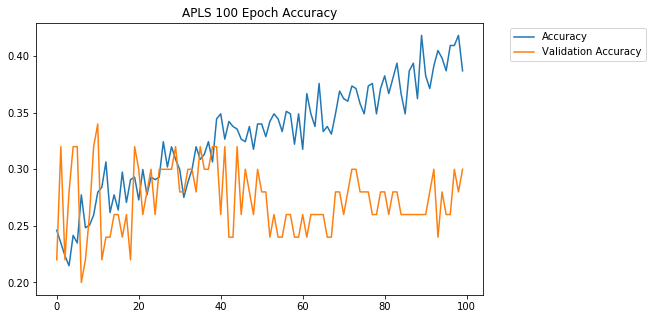

Train on 271 samples, validate on 50 samples
Epoch 1/100
271/271 [==============================] - 0s 635us/step - loss: 2.2079 - acc: 0.1919 - val_loss: 2.0601 - val_acc: 0.2000
Epoch 2/100
271/271 [==============================] - 0s 256us/step - loss: 2.0907 - acc: 0.2214 - val_loss: 2.0123 - val_acc: 0.2400
Epoch 3/100
271/271 [==============================] - 0s 319us/step - loss: 2.0063 - acc: 0.2989 - val_loss: 1.9762 - val_acc: 0.2400
Epoch 4/100
271/271 [==============================] - 0s 240us/step - loss: 1.9495 - acc: 0.2362 - val_loss: 1.9508 - val_acc: 0.2400
Epoch 5/100
271/271 [==============================] - 0s 254us/step - loss: 1.8436 - acc: 0.3100 - val_loss: 1.9445 - val_acc: 0.2400
Epoch 6/100
271/271 [==============================] - 0s 250us/step - loss: 1.8642 - acc: 0.2620 - val_loss: 1.9483 - val_acc: 0.2800
Epoch 7/100
271/271 [==============================] - 0s 284us/step - loss: 1.8143 - acc: 0.2804 - val_loss: 1.9358 - val_acc: 0.2600
Epoch 8/10

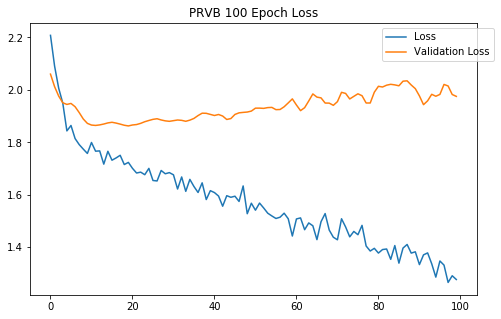

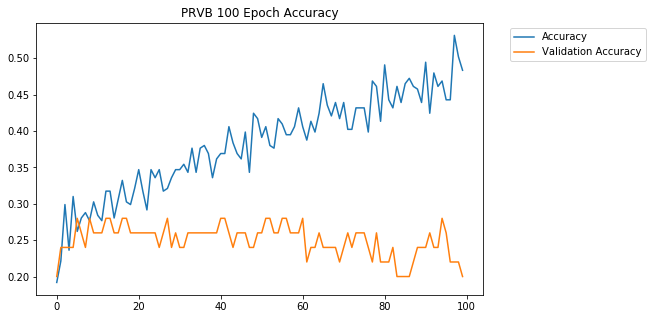

Train on 72 samples, validate on 50 samples
Epoch 1/100
72/72 [==============================] - 0s 2ms/step - loss: 2.7438 - acc: 0.2222 - val_loss: 2.0532 - val_acc: 0.3200
Epoch 2/100
72/72 [==============================] - 0s 460us/step - loss: 3.0777 - acc: 0.1528 - val_loss: 2.0449 - val_acc: 0.3400
Epoch 3/100
72/72 [==============================] - 0s 380us/step - loss: 2.6041 - acc: 0.1944 - val_loss: 2.0652 - val_acc: 0.3600
Epoch 4/100
72/72 [==============================] - 0s 392us/step - loss: 2.5332 - acc: 0.1250 - val_loss: 2.1184 - val_acc: 0.3600
Epoch 5/100
72/72 [==============================] - 0s 404us/step - loss: 2.2049 - acc: 0.1667 - val_loss: 2.1958 - val_acc: 0.3600
Epoch 6/100
72/72 [==============================] - 0s 358us/step - loss: 2.1407 - acc: 0.1944 - val_loss: 2.2773 - val_acc: 0.3800
Epoch 7/100
72/72 [==============================] - 0s 373us/step - loss: 1.9537 - acc: 0.2361 - val_loss: 2.3405 - val_acc: 0.3600
Epoch 8/100
72/72 [========

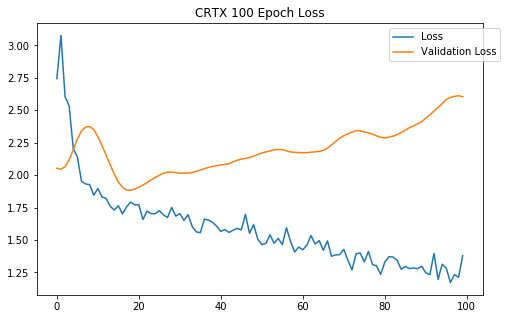

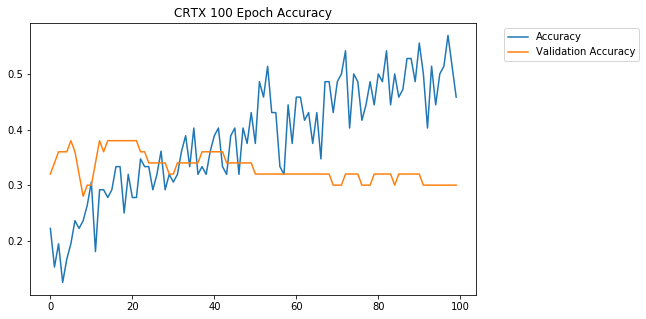

Train on 1567 samples, validate on 50 samples
Epoch 1/100
1567/1567 [==============================] - 0s 276us/step - loss: 2.1211 - acc: 0.2329 - val_loss: 1.7935 - val_acc: 0.2400
Epoch 2/100
1567/1567 [==============================] - 0s 210us/step - loss: 1.9191 - acc: 0.2399 - val_loss: 1.7467 - val_acc: 0.3600
Epoch 3/100
1567/1567 [==============================] - 0s 203us/step - loss: 1.8583 - acc: 0.2559 - val_loss: 1.7430 - val_acc: 0.3400
Epoch 4/100
1567/1567 [==============================] - 0s 223us/step - loss: 1.8592 - acc: 0.2521 - val_loss: 1.7505 - val_acc: 0.3400
Epoch 5/100
1567/1567 [==============================] - 0s 209us/step - loss: 1.8556 - acc: 0.2610 - val_loss: 1.7641 - val_acc: 0.2600
Epoch 6/100
1567/1567 [==============================] - 0s 217us/step - loss: 1.8450 - acc: 0.2534 - val_loss: 1.7436 - val_acc: 0.2800
Epoch 7/100
1567/1567 [==============================] - 0s 224us/step - loss: 1.8368 - acc: 0.2616 - val_loss: 1.7505 - val_acc: 0.

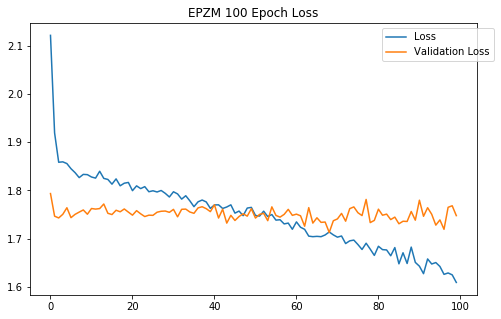

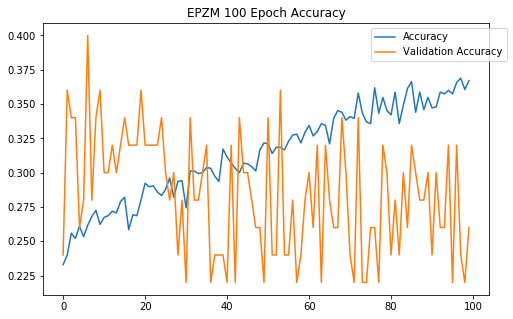

Train on 1212 samples, validate on 50 samples
Epoch 1/100
1212/1212 [==============================] - 0s 275us/step - loss: 2.1273 - acc: 0.2335 - val_loss: 1.7759 - val_acc: 0.2400
Epoch 2/100
1212/1212 [==============================] - 0s 222us/step - loss: 1.9058 - acc: 0.2500 - val_loss: 1.7867 - val_acc: 0.2600
Epoch 3/100
1212/1212 [==============================] - 0s 241us/step - loss: 1.8383 - acc: 0.2500 - val_loss: 1.8029 - val_acc: 0.2000
Epoch 4/100
1212/1212 [==============================] - 0s 217us/step - loss: 1.8375 - acc: 0.2583 - val_loss: 1.7789 - val_acc: 0.3000
Epoch 5/100
1212/1212 [==============================] - 0s 219us/step - loss: 1.8190 - acc: 0.2607 - val_loss: 1.7584 - val_acc: 0.2600
Epoch 6/100
1212/1212 [==============================] - 0s 216us/step - loss: 1.8187 - acc: 0.2805 - val_loss: 1.7995 - val_acc: 0.2200
Epoch 7/100
1212/1212 [==============================] - 0s 231us/step - loss: 1.8121 - acc: 0.2789 - val_loss: 1.7655 - val_acc: 0.

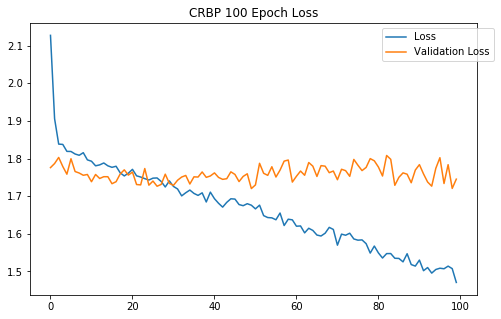

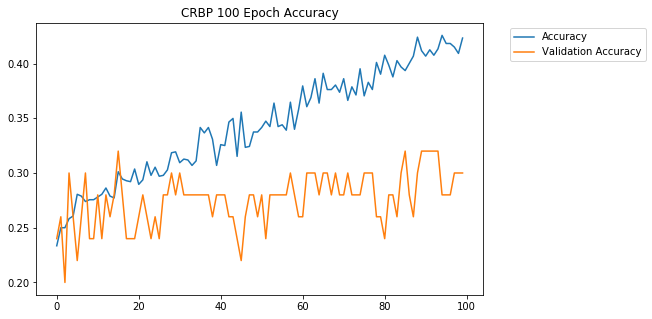

Train on 1895 samples, validate on 50 samples
Epoch 1/100
1895/1895 [==============================] - 0s 253us/step - loss: 1.9283 - acc: 0.2549 - val_loss: 2.1772 - val_acc: 0.3000
Epoch 2/100
1895/1895 [==============================] - 0s 202us/step - loss: 1.8605 - acc: 0.2369 - val_loss: 2.0625 - val_acc: 0.3200
Epoch 3/100
1895/1895 [==============================] - 0s 191us/step - loss: 1.8385 - acc: 0.2533 - val_loss: 2.0582 - val_acc: 0.3200
Epoch 4/100
1895/1895 [==============================] - 0s 212us/step - loss: 1.8228 - acc: 0.2649 - val_loss: 2.0183 - val_acc: 0.3200
Epoch 5/100
1895/1895 [==============================] - 0s 205us/step - loss: 1.8164 - acc: 0.2781 - val_loss: 1.9779 - val_acc: 0.3400
Epoch 6/100
1895/1895 [==============================] - 0s 207us/step - loss: 1.8094 - acc: 0.2675 - val_loss: 1.9504 - val_acc: 0.3400
Epoch 7/100
1895/1895 [==============================] - 0s 219us/step - loss: 1.8091 - acc: 0.2786 - val_loss: 1.9207 - val_acc: 0.

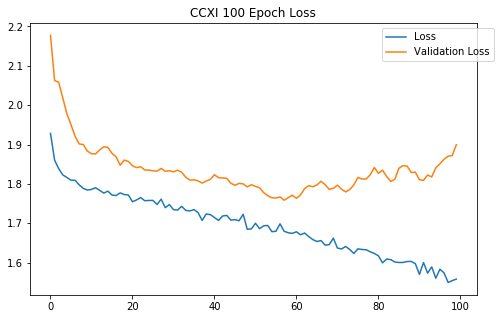

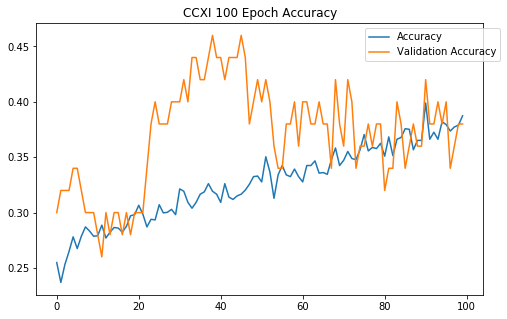

Train on 2342 samples, validate on 50 samples
Epoch 1/100
2342/2342 [==============================] - 1s 242us/step - loss: 1.9650 - acc: 0.2835 - val_loss: 1.6788 - val_acc: 0.3200
Epoch 2/100
2342/2342 [==============================] - 0s 209us/step - loss: 1.7495 - acc: 0.3501 - val_loss: 1.7448 - val_acc: 0.2400
Epoch 3/100
2342/2342 [==============================] - 0s 203us/step - loss: 1.7253 - acc: 0.3416 - val_loss: 1.7613 - val_acc: 0.2800
Epoch 4/100
2342/2342 [==============================] - 1s 236us/step - loss: 1.6993 - acc: 0.3523 - val_loss: 1.7128 - val_acc: 0.2600
Epoch 5/100
2342/2342 [==============================] - 1s 237us/step - loss: 1.6810 - acc: 0.3531 - val_loss: 1.7192 - val_acc: 0.2800
Epoch 6/100
2342/2342 [==============================] - 0s 207us/step - loss: 1.6786 - acc: 0.3471 - val_loss: 1.7024 - val_acc: 0.2400
Epoch 7/100
2342/2342 [==============================] - 0s 201us/step - loss: 1.6728 - acc: 0.3561 - val_loss: 1.6941 - val_acc: 0.

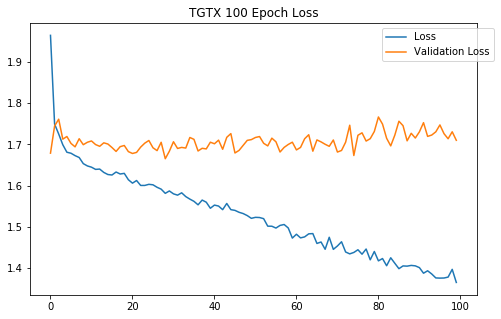

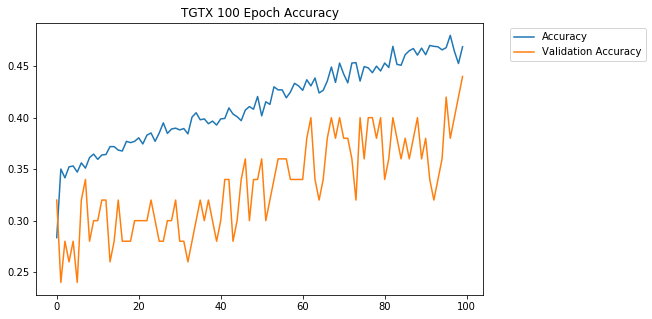

Train on 4939 samples, validate on 50 samples
Epoch 1/100
4939/4939 [==============================] - 1s 213us/step - loss: 1.9713 - acc: 0.2476 - val_loss: 1.9092 - val_acc: 0.2000
Epoch 2/100
4939/4939 [==============================] - 1s 207us/step - loss: 1.8348 - acc: 0.2610 - val_loss: 1.9082 - val_acc: 0.2200
Epoch 3/100
4939/4939 [==============================] - 1s 202us/step - loss: 1.8256 - acc: 0.2577 - val_loss: 1.8844 - val_acc: 0.2200
Epoch 4/100
4939/4939 [==============================] - 1s 206us/step - loss: 1.8197 - acc: 0.2600 - val_loss: 1.8897 - val_acc: 0.2200
Epoch 5/100
4939/4939 [==============================] - 1s 201us/step - loss: 1.8158 - acc: 0.2646 - val_loss: 1.8872 - val_acc: 0.2000
Epoch 6/100
4939/4939 [==============================] - 1s 212us/step - loss: 1.8107 - acc: 0.2679 - val_loss: 1.9104 - val_acc: 0.2000
Epoch 7/100
4939/4939 [==============================] - 1s 208us/step - loss: 1.8077 - acc: 0.2695 - val_loss: 1.8865 - val_acc: 0.

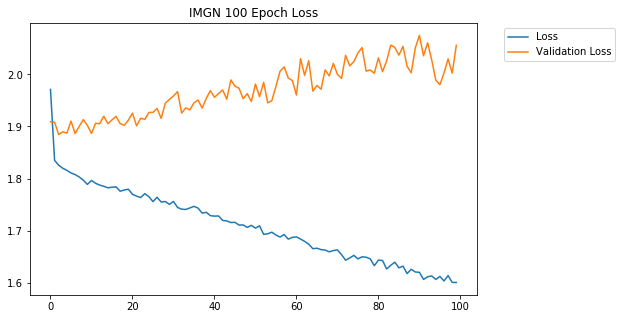

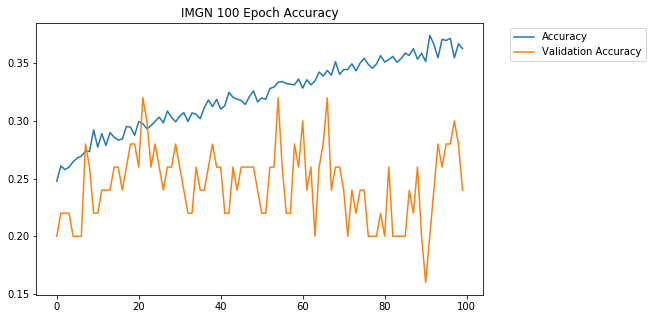

Train on 1482 samples, validate on 50 samples
Epoch 1/100
1482/1482 [==============================] - 0s 292us/step - loss: 2.0663 - acc: 0.2287 - val_loss: 1.7260 - val_acc: 0.3000
Epoch 2/100
1482/1482 [==============================] - 0s 205us/step - loss: 1.9408 - acc: 0.2186 - val_loss: 1.7081 - val_acc: 0.3600
Epoch 3/100
1482/1482 [==============================] - 0s 217us/step - loss: 1.8716 - acc: 0.2537 - val_loss: 1.7279 - val_acc: 0.3600
Epoch 4/100
1482/1482 [==============================] - 0s 218us/step - loss: 1.8573 - acc: 0.2409 - val_loss: 1.7432 - val_acc: 0.3400
Epoch 5/100
1482/1482 [==============================] - 0s 207us/step - loss: 1.8668 - acc: 0.2524 - val_loss: 1.7522 - val_acc: 0.3800
Epoch 6/100
1482/1482 [==============================] - 0s 202us/step - loss: 1.8591 - acc: 0.2483 - val_loss: 1.7377 - val_acc: 0.3600
Epoch 7/100
1482/1482 [==============================] - 0s 207us/step - loss: 1.8540 - acc: 0.2524 - val_loss: 1.7356 - val_acc: 0.

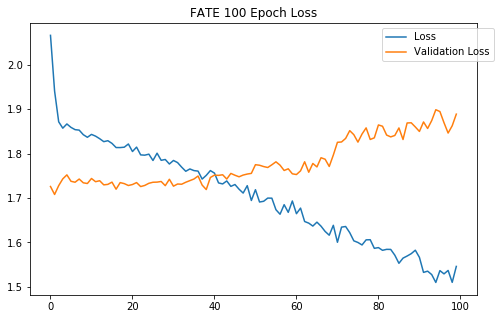

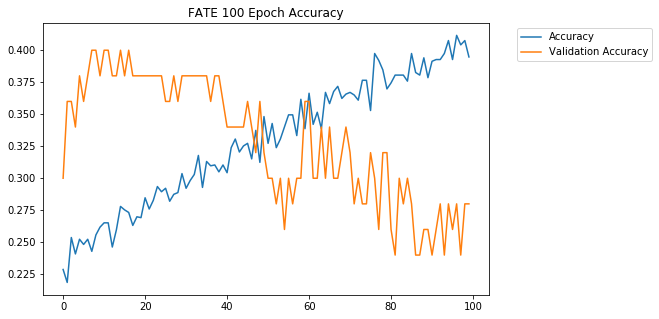

Train on 1365 samples, validate on 50 samples
Epoch 1/100
1365/1365 [==============================] - 0s 259us/step - loss: 2.0134 - acc: 0.2366 - val_loss: 1.7946 - val_acc: 0.3600
Epoch 2/100
1365/1365 [==============================] - 0s 215us/step - loss: 1.8758 - acc: 0.2344 - val_loss: 1.7566 - val_acc: 0.3800
Epoch 3/100
1365/1365 [==============================] - 0s 209us/step - loss: 1.8546 - acc: 0.2308 - val_loss: 1.7443 - val_acc: 0.3800
Epoch 4/100
1365/1365 [==============================] - 0s 205us/step - loss: 1.8175 - acc: 0.2520 - val_loss: 1.7462 - val_acc: 0.3800
Epoch 5/100
1365/1365 [==============================] - 0s 217us/step - loss: 1.8084 - acc: 0.2498 - val_loss: 1.7474 - val_acc: 0.3800
Epoch 6/100
1365/1365 [==============================] - 0s 220us/step - loss: 1.8131 - acc: 0.2527 - val_loss: 1.7493 - val_acc: 0.3600
Epoch 7/100
1365/1365 [==============================] - 0s 203us/step - loss: 1.8009 - acc: 0.2505 - val_loss: 1.7418 - val_acc: 0.

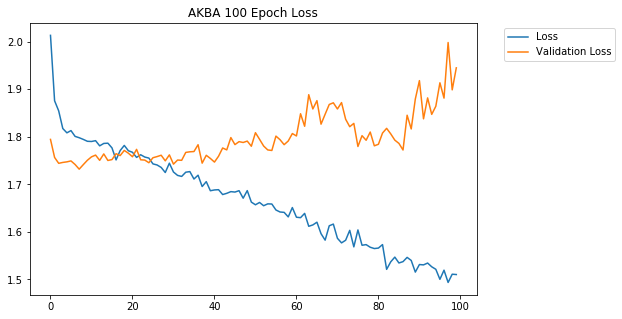

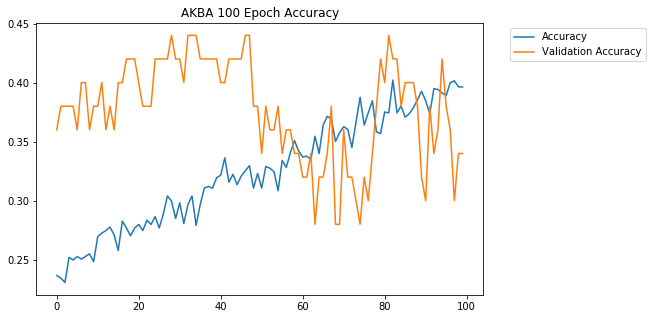

Train on 426 samples, validate on 50 samples
Epoch 1/100
426/426 [==============================] - 0s 471us/step - loss: 1.9305 - acc: 0.2817 - val_loss: 1.7423 - val_acc: 0.3000
Epoch 2/100
426/426 [==============================] - 0s 261us/step - loss: 1.9062 - acc: 0.2746 - val_loss: 1.7269 - val_acc: 0.3000
Epoch 3/100
426/426 [==============================] - 0s 289us/step - loss: 1.8669 - acc: 0.2840 - val_loss: 1.7377 - val_acc: 0.2800
Epoch 4/100
426/426 [==============================] - 0s 256us/step - loss: 1.8095 - acc: 0.2934 - val_loss: 1.7400 - val_acc: 0.2200
Epoch 5/100
426/426 [==============================] - 0s 241us/step - loss: 1.8040 - acc: 0.2746 - val_loss: 1.7513 - val_acc: 0.2600
Epoch 6/100
426/426 [==============================] - 0s 238us/step - loss: 1.8375 - acc: 0.2817 - val_loss: 1.7432 - val_acc: 0.2200
Epoch 7/100
426/426 [==============================] - 0s 279us/step - loss: 1.7741 - acc: 0.2934 - val_loss: 1.7374 - val_acc: 0.2400
Epoch 8/10

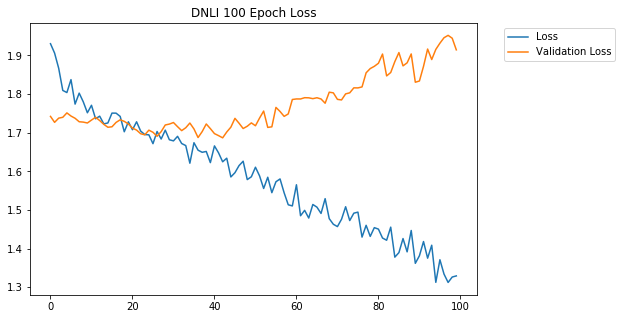

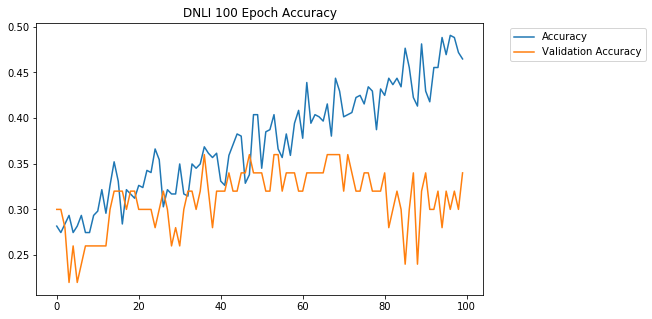

Train on 4709 samples, validate on 50 samples
Epoch 1/100
4709/4709 [==============================] - 1s 217us/step - loss: 1.9741 - acc: 0.2387 - val_loss: 1.8535 - val_acc: 0.2600
Epoch 2/100
4709/4709 [==============================] - 1s 207us/step - loss: 1.8249 - acc: 0.2514 - val_loss: 1.8237 - val_acc: 0.2400
Epoch 3/100
4709/4709 [==============================] - 1s 210us/step - loss: 1.8106 - acc: 0.2612 - val_loss: 1.8175 - val_acc: 0.3800
Epoch 4/100
4709/4709 [==============================] - 1s 206us/step - loss: 1.8027 - acc: 0.2614 - val_loss: 1.8053 - val_acc: 0.4000
Epoch 5/100
4709/4709 [==============================] - 1s 209us/step - loss: 1.7960 - acc: 0.2642 - val_loss: 1.8055 - val_acc: 0.3000
Epoch 6/100
4709/4709 [==============================] - 1s 208us/step - loss: 1.7905 - acc: 0.2718 - val_loss: 1.8014 - val_acc: 0.3200
Epoch 7/100
4709/4709 [==============================] - 1s 206us/step - loss: 1.7819 - acc: 0.2727 - val_loss: 1.7889 - val_acc: 0.

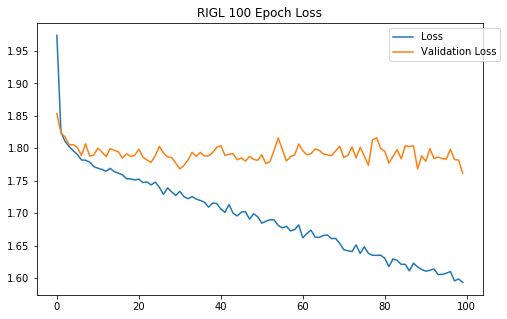

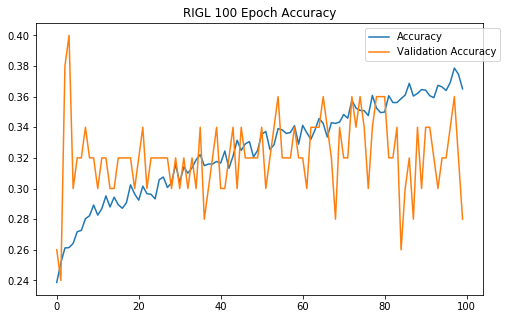

Train on 234 samples, validate on 50 samples
Epoch 1/100
234/234 [==============================] - 0s 596us/step - loss: 1.9777 - acc: 0.2564 - val_loss: 1.8761 - val_acc: 0.3000
Epoch 2/100
234/234 [==============================] - 0s 322us/step - loss: 1.9681 - acc: 0.2393 - val_loss: 1.8418 - val_acc: 0.3000
Epoch 3/100
234/234 [==============================] - 0s 286us/step - loss: 1.8661 - acc: 0.2521 - val_loss: 1.8124 - val_acc: 0.2800
Epoch 4/100
234/234 [==============================] - 0s 294us/step - loss: 1.8585 - acc: 0.3120 - val_loss: 1.7897 - val_acc: 0.3000
Epoch 5/100
234/234 [==============================] - 0s 275us/step - loss: 1.8703 - acc: 0.2607 - val_loss: 1.7808 - val_acc: 0.3000
Epoch 6/100
234/234 [==============================] - 0s 287us/step - loss: 1.8416 - acc: 0.2607 - val_loss: 1.7751 - val_acc: 0.3000
Epoch 7/100
234/234 [==============================] - 0s 320us/step - loss: 1.8182 - acc: 0.2778 - val_loss: 1.7788 - val_acc: 0.2800
Epoch 8/10

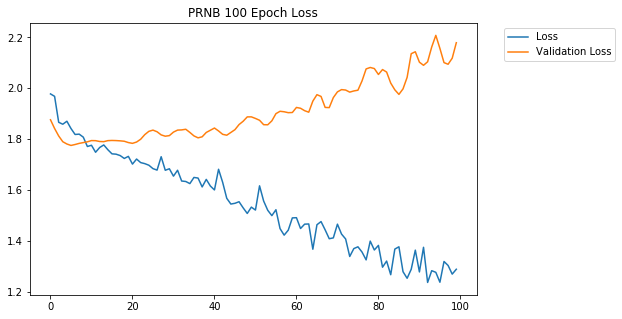

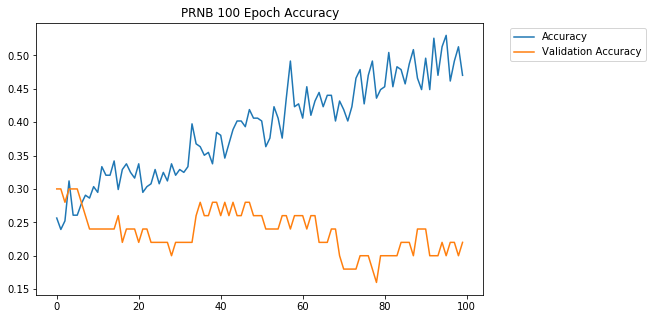

Train on 225 samples, validate on 50 samples
Epoch 1/100
225/225 [==============================] - 0s 595us/step - loss: 2.2915 - acc: 0.2533 - val_loss: 1.4733 - val_acc: 0.4000
Epoch 2/100
225/225 [==============================] - 0s 323us/step - loss: 2.2821 - acc: 0.2311 - val_loss: 1.4749 - val_acc: 0.4200
Epoch 3/100
225/225 [==============================] - 0s 322us/step - loss: 1.9713 - acc: 0.2756 - val_loss: 1.4909 - val_acc: 0.4400
Epoch 4/100
225/225 [==============================] - 0s 319us/step - loss: 1.9433 - acc: 0.2444 - val_loss: 1.5145 - val_acc: 0.4200
Epoch 5/100
225/225 [==============================] - 0s 305us/step - loss: 1.8668 - acc: 0.2978 - val_loss: 1.5400 - val_acc: 0.4000
Epoch 6/100
225/225 [==============================] - 0s 289us/step - loss: 1.8184 - acc: 0.3067 - val_loss: 1.5552 - val_acc: 0.4000
Epoch 7/100
225/225 [==============================] - 0s 316us/step - loss: 1.7741 - acc: 0.3022 - val_loss: 1.5628 - val_acc: 0.4000
Epoch 8/10

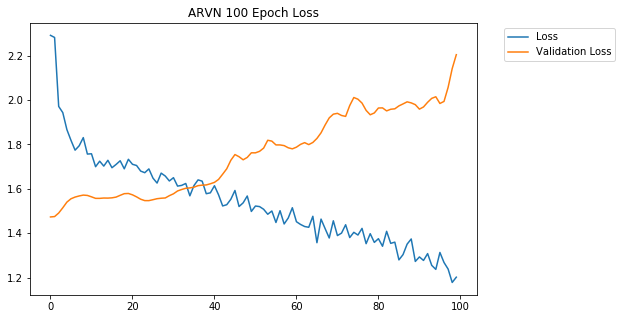

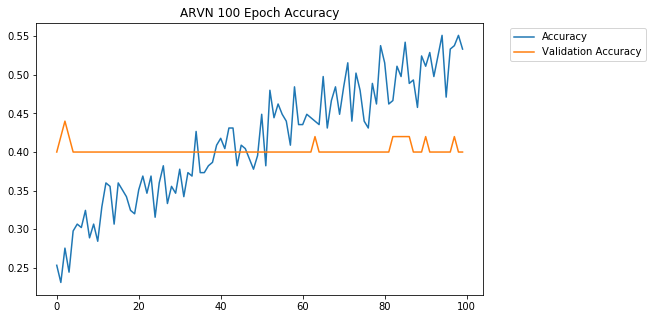

Train on 582 samples, validate on 50 samples
Epoch 1/100
582/582 [==============================] - 0s 216us/step - loss: 2.2219 - acc: 0.2749 - val_loss: 2.5561 - val_acc: 0.3000
Epoch 2/100
582/582 [==============================] - 0s 228us/step - loss: 1.9917 - acc: 0.2749 - val_loss: 2.1142 - val_acc: 0.3200
Epoch 3/100
582/582 [==============================] - 0s 212us/step - loss: 1.9408 - acc: 0.2526 - val_loss: 1.9707 - val_acc: 0.3200
Epoch 4/100
582/582 [==============================] - 0s 228us/step - loss: 1.8119 - acc: 0.2784 - val_loss: 1.9151 - val_acc: 0.3200
Epoch 5/100
582/582 [==============================] - 0s 216us/step - loss: 1.7882 - acc: 0.2801 - val_loss: 1.8893 - val_acc: 0.3000
Epoch 6/100
582/582 [==============================] - 0s 217us/step - loss: 1.7721 - acc: 0.2801 - val_loss: 1.8727 - val_acc: 0.3000
Epoch 7/100
582/582 [==============================] - 0s 210us/step - loss: 1.7575 - acc: 0.3093 - val_loss: 1.8635 - val_acc: 0.3000
Epoch 8/10

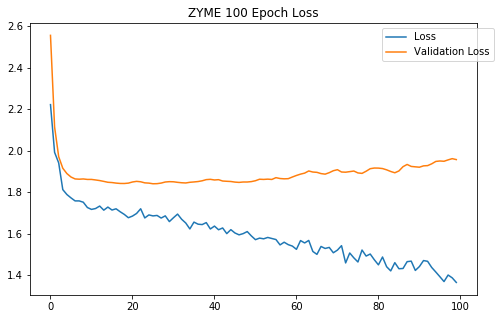

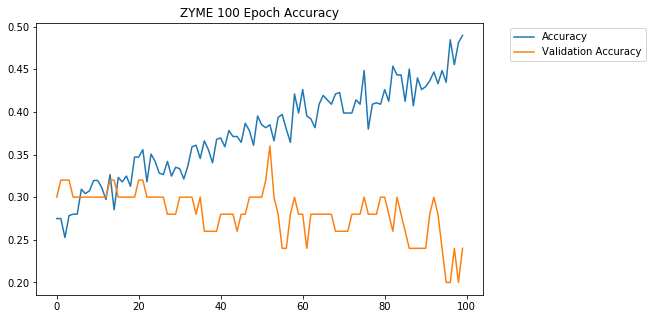

Train on 176 samples, validate on 50 samples
Epoch 1/100
176/176 [==============================] - 0s 842us/step - loss: 2.2826 - acc: 0.1705 - val_loss: 2.1914 - val_acc: 0.1400
Epoch 2/100
176/176 [==============================] - 0s 282us/step - loss: 2.2506 - acc: 0.2159 - val_loss: 2.1774 - val_acc: 0.1600
Epoch 3/100
176/176 [==============================] - 0s 299us/step - loss: 2.0777 - acc: 0.2898 - val_loss: 2.1569 - val_acc: 0.1200
Epoch 4/100
176/176 [==============================] - 0s 280us/step - loss: 2.0408 - acc: 0.2727 - val_loss: 2.1360 - val_acc: 0.1000
Epoch 5/100
176/176 [==============================] - 0s 257us/step - loss: 1.9539 - acc: 0.2727 - val_loss: 2.1123 - val_acc: 0.1600
Epoch 6/100
176/176 [==============================] - 0s 274us/step - loss: 1.9153 - acc: 0.2557 - val_loss: 2.0930 - val_acc: 0.1800
Epoch 7/100
176/176 [==============================] - 0s 342us/step - loss: 1.9687 - acc: 0.2557 - val_loss: 2.0762 - val_acc: 0.1600
Epoch 8/10

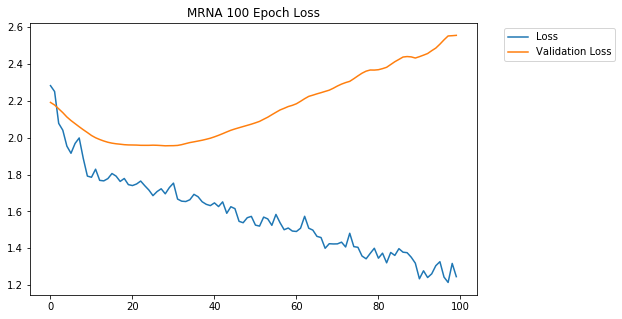

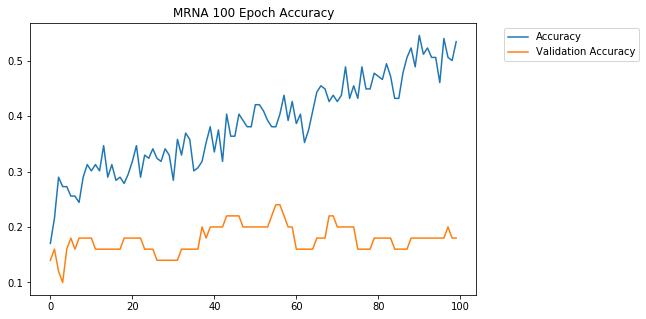

Train on 3853 samples, validate on 50 samples
Epoch 1/100
3853/3853 [==============================] - 1s 230us/step - loss: 2.0072 - acc: 0.2453 - val_loss: 1.8801 - val_acc: 0.1400
Epoch 2/100
3853/3853 [==============================] - 1s 205us/step - loss: 1.8445 - acc: 0.2424 - val_loss: 1.8505 - val_acc: 0.1800
Epoch 3/100
3853/3853 [==============================] - 1s 215us/step - loss: 1.8230 - acc: 0.2606 - val_loss: 1.8590 - val_acc: 0.1800
Epoch 4/100
3853/3853 [==============================] - 1s 208us/step - loss: 1.8148 - acc: 0.2645 - val_loss: 1.8519 - val_acc: 0.1600
Epoch 5/100
3853/3853 [==============================] - 1s 223us/step - loss: 1.8033 - acc: 0.2684 - val_loss: 1.8635 - val_acc: 0.1600
Epoch 6/100
3853/3853 [==============================] - 1s 205us/step - loss: 1.8110 - acc: 0.2684 - val_loss: 1.8585 - val_acc: 0.1400
Epoch 7/100
3853/3853 [==============================] - 1s 213us/step - loss: 1.8001 - acc: 0.2671 - val_loss: 1.8766 - val_acc: 0.

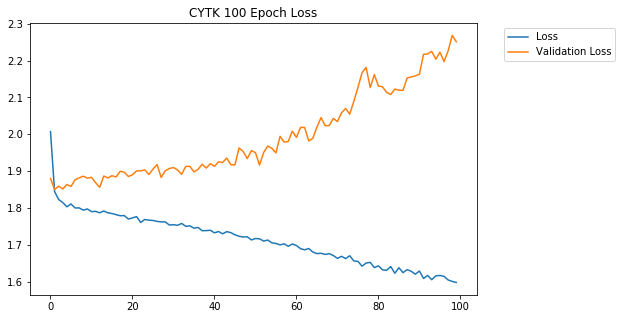

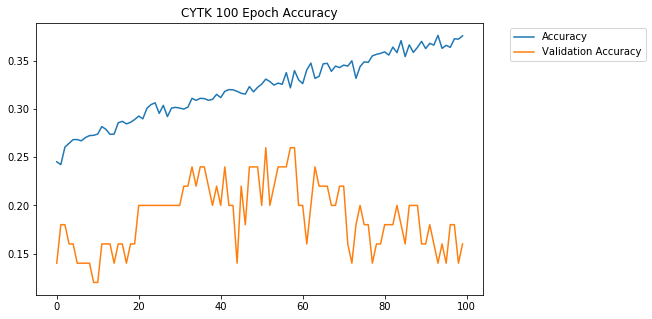

Train on 288 samples, validate on 50 samples
Epoch 1/100
288/288 [==============================] - 0s 667us/step - loss: 2.1193 - acc: 0.2153 - val_loss: 1.8409 - val_acc: 0.2800
Epoch 2/100
288/288 [==============================] - 0s 300us/step - loss: 2.1111 - acc: 0.2292 - val_loss: 1.8479 - val_acc: 0.2800
Epoch 3/100
288/288 [==============================] - 0s 286us/step - loss: 2.0419 - acc: 0.2118 - val_loss: 1.8443 - val_acc: 0.3000
Epoch 4/100
288/288 [==============================] - 0s 293us/step - loss: 2.0230 - acc: 0.2396 - val_loss: 1.8415 - val_acc: 0.3000
Epoch 5/100
288/288 [==============================] - 0s 242us/step - loss: 1.9822 - acc: 0.2257 - val_loss: 1.8338 - val_acc: 0.3200
Epoch 6/100
288/288 [==============================] - 0s 232us/step - loss: 1.9667 - acc: 0.2153 - val_loss: 1.8287 - val_acc: 0.3000
Epoch 7/100
288/288 [==============================] - 0s 231us/step - loss: 1.9441 - acc: 0.2326 - val_loss: 1.8247 - val_acc: 0.3000
Epoch 8/10

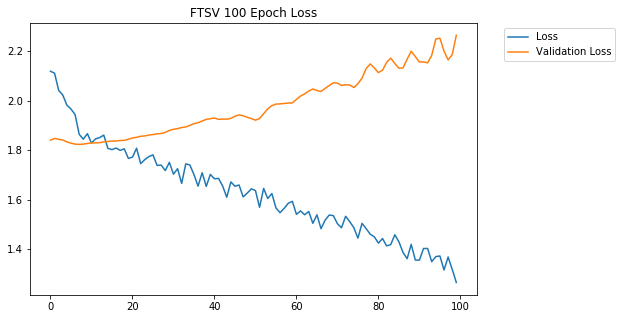

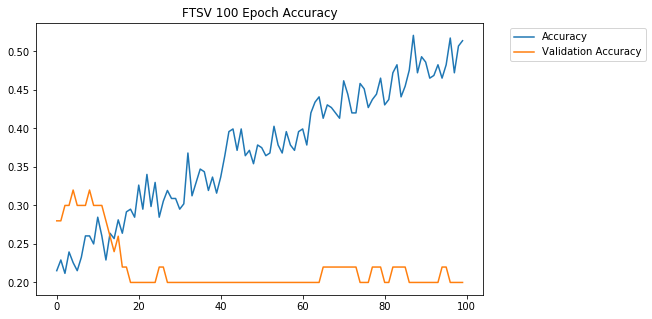

Train on 1149 samples, validate on 50 samples
Epoch 1/100
1149/1149 [==============================] - 0s 291us/step - loss: 1.9352 - acc: 0.2515 - val_loss: 1.7460 - val_acc: 0.2000
Epoch 2/100
1149/1149 [==============================] - 0s 222us/step - loss: 1.7906 - acc: 0.2646 - val_loss: 1.7276 - val_acc: 0.2800
Epoch 3/100
1149/1149 [==============================] - 0s 209us/step - loss: 1.7586 - acc: 0.2594 - val_loss: 1.7056 - val_acc: 0.2800
Epoch 4/100
1149/1149 [==============================] - 0s 219us/step - loss: 1.7158 - acc: 0.2742 - val_loss: 1.7184 - val_acc: 0.3400
Epoch 5/100
1149/1149 [==============================] - 0s 206us/step - loss: 1.7137 - acc: 0.2759 - val_loss: 1.7200 - val_acc: 0.3200
Epoch 6/100
1149/1149 [==============================] - 0s 217us/step - loss: 1.6954 - acc: 0.2968 - val_loss: 1.7234 - val_acc: 0.3200
Epoch 7/100
1149/1149 [==============================] - 0s 209us/step - loss: 1.6964 - acc: 0.2889 - val_loss: 1.7225 - val_acc: 0.

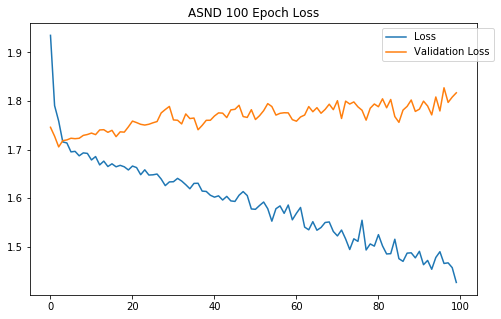

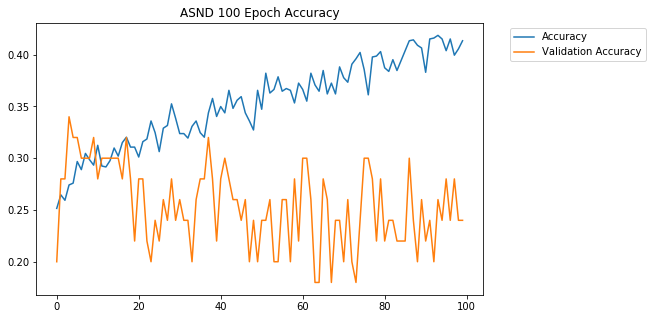

Train on 1096 samples, validate on 50 samples
Epoch 1/100
1096/1096 [==============================] - 0s 294us/step - loss: 2.2455 - acc: 0.2308 - val_loss: 2.0592 - val_acc: 0.1200
Epoch 2/100
1096/1096 [==============================] - 0s 208us/step - loss: 2.0007 - acc: 0.2445 - val_loss: 2.0011 - val_acc: 0.1400
Epoch 3/100
1096/1096 [==============================] - 0s 200us/step - loss: 1.8995 - acc: 0.2500 - val_loss: 1.9761 - val_acc: 0.1800
Epoch 4/100
1096/1096 [==============================] - 0s 204us/step - loss: 1.8614 - acc: 0.2637 - val_loss: 1.9617 - val_acc: 0.2200
Epoch 5/100
1096/1096 [==============================] - 0s 212us/step - loss: 1.8374 - acc: 0.2546 - val_loss: 1.9765 - val_acc: 0.1800
Epoch 6/100
1096/1096 [==============================] - 0s 198us/step - loss: 1.8474 - acc: 0.2491 - val_loss: 1.9809 - val_acc: 0.1800
Epoch 7/100
1096/1096 [==============================] - 0s 213us/step - loss: 1.8364 - acc: 0.2637 - val_loss: 1.9757 - val_acc: 0.

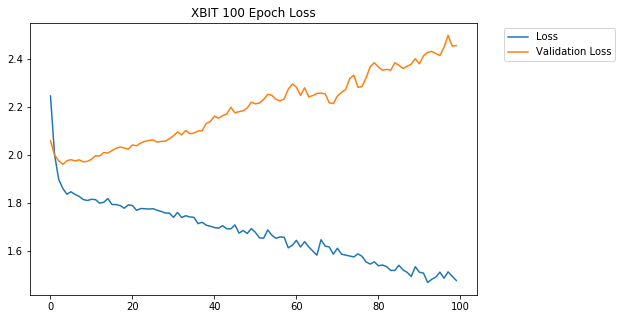

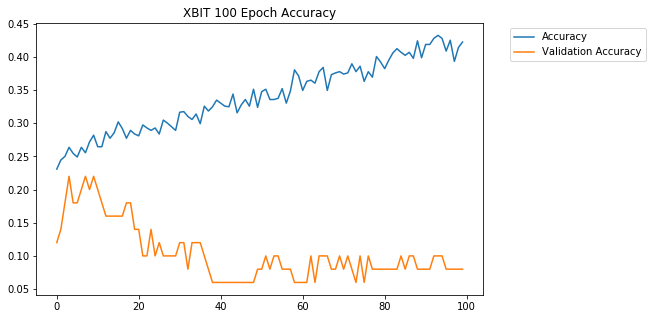

Train on 135 samples, validate on 50 samples
Epoch 1/100
135/135 [==============================] - 0s 948us/step - loss: 2.0574 - acc: 0.2074 - val_loss: 2.0332 - val_acc: 0.2600
Epoch 2/100
135/135 [==============================] - 0s 360us/step - loss: 2.1122 - acc: 0.2444 - val_loss: 1.9811 - val_acc: 0.2400
Epoch 3/100
135/135 [==============================] - 0s 404us/step - loss: 2.0360 - acc: 0.2370 - val_loss: 1.9371 - val_acc: 0.2600
Epoch 4/100
135/135 [==============================] - 0s 362us/step - loss: 2.0018 - acc: 0.2074 - val_loss: 1.8983 - val_acc: 0.2800
Epoch 5/100
135/135 [==============================] - 0s 334us/step - loss: 2.0108 - acc: 0.2519 - val_loss: 1.8667 - val_acc: 0.2400
Epoch 6/100
135/135 [==============================] - 0s 326us/step - loss: 1.9775 - acc: 0.1926 - val_loss: 1.8473 - val_acc: 0.2400
Epoch 7/100
135/135 [==============================] - 0s 366us/step - loss: 1.9472 - acc: 0.2370 - val_loss: 1.8320 - val_acc: 0.2600
Epoch 8/10

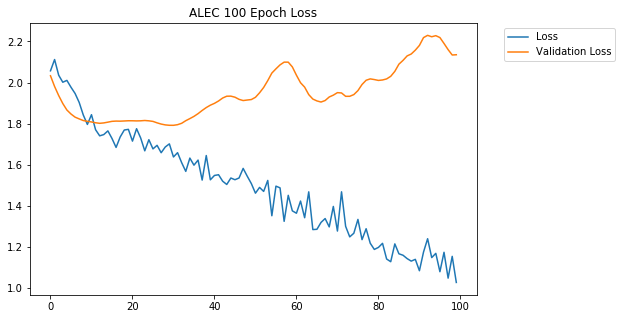

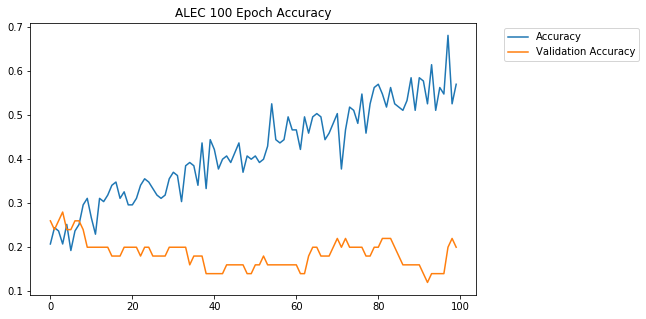

Train on 201 samples, validate on 50 samples
Epoch 1/100
201/201 [==============================] - 0s 647us/step - loss: 2.6750 - acc: 0.2040 - val_loss: 2.0017 - val_acc: 0.2600
Epoch 2/100
201/201 [==============================] - 0s 359us/step - loss: 2.5367 - acc: 0.2438 - val_loss: 1.9828 - val_acc: 0.2600
Epoch 3/100
201/201 [==============================] - 0s 381us/step - loss: 2.3712 - acc: 0.2289 - val_loss: 1.9416 - val_acc: 0.2600
Epoch 4/100
201/201 [==============================] - 0s 361us/step - loss: 2.2536 - acc: 0.2388 - val_loss: 1.9033 - val_acc: 0.3000
Epoch 5/100
201/201 [==============================] - 0s 339us/step - loss: 2.2209 - acc: 0.2388 - val_loss: 1.8686 - val_acc: 0.3000
Epoch 6/100
201/201 [==============================] - 0s 326us/step - loss: 2.0443 - acc: 0.2736 - val_loss: 1.8659 - val_acc: 0.2800
Epoch 7/100
201/201 [==============================] - 0s 341us/step - loss: 1.9557 - acc: 0.2488 - val_loss: 1.8783 - val_acc: 0.2600
Epoch 8/10

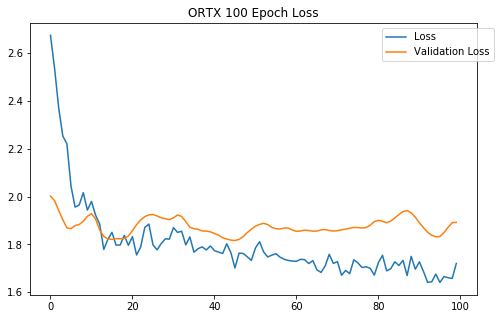

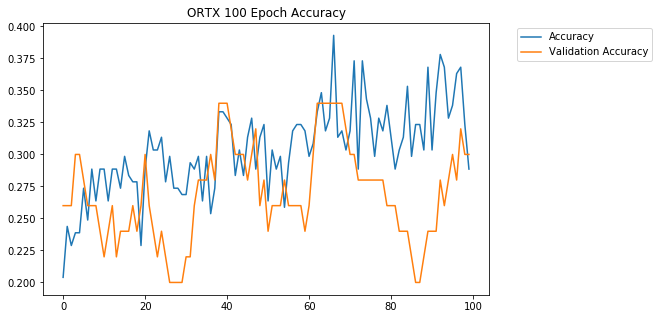

Train on 1273 samples, validate on 50 samples
Epoch 1/100
1273/1273 [==============================] - 0s 283us/step - loss: 1.9342 - acc: 0.2616 - val_loss: 1.8369 - val_acc: 0.2400
Epoch 2/100
1273/1273 [==============================] - 0s 207us/step - loss: 1.8966 - acc: 0.2482 - val_loss: 1.7996 - val_acc: 0.2400
Epoch 3/100
1273/1273 [==============================] - 0s 214us/step - loss: 1.8736 - acc: 0.2412 - val_loss: 1.7725 - val_acc: 0.2400
Epoch 4/100
1273/1273 [==============================] - 0s 221us/step - loss: 1.8392 - acc: 0.2734 - val_loss: 1.7696 - val_acc: 0.2200
Epoch 5/100
1273/1273 [==============================] - 0s 210us/step - loss: 1.8216 - acc: 0.2781 - val_loss: 1.7812 - val_acc: 0.2400
Epoch 6/100
1273/1273 [==============================] - 0s 215us/step - loss: 1.8311 - acc: 0.2757 - val_loss: 1.7910 - val_acc: 0.2400
Epoch 7/100
1273/1273 [==============================] - 0s 213us/step - loss: 1.8236 - acc: 0.2616 - val_loss: 1.7945 - val_acc: 0.

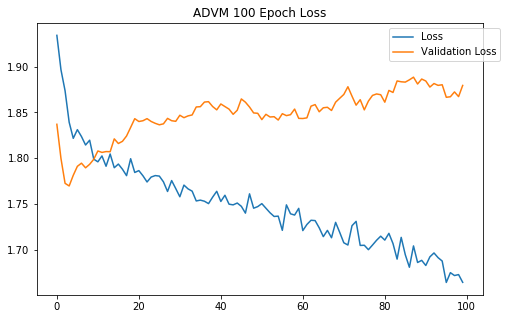

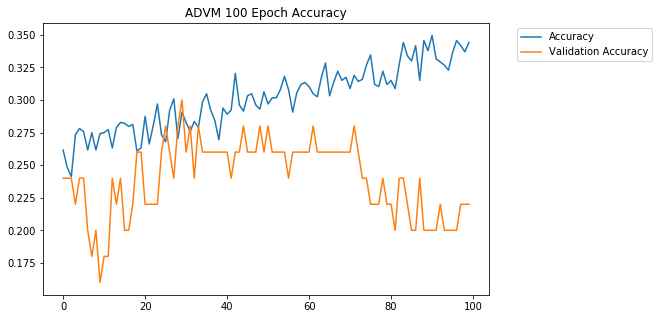

Train on 1475 samples, validate on 50 samples
Epoch 1/100
1475/1475 [==============================] - 0s 303us/step - loss: 1.8726 - acc: 0.2671 - val_loss: 1.8379 - val_acc: 0.2400
Epoch 2/100
1475/1475 [==============================] - 0s 209us/step - loss: 1.8305 - acc: 0.2786 - val_loss: 1.8036 - val_acc: 0.2800
Epoch 3/100
1475/1475 [==============================] - 0s 214us/step - loss: 1.8263 - acc: 0.2705 - val_loss: 1.7934 - val_acc: 0.2800
Epoch 4/100
1475/1475 [==============================] - 0s 208us/step - loss: 1.8163 - acc: 0.2793 - val_loss: 1.7930 - val_acc: 0.2800
Epoch 5/100
1475/1475 [==============================] - 0s 200us/step - loss: 1.8039 - acc: 0.2895 - val_loss: 1.7920 - val_acc: 0.2800
Epoch 6/100
1475/1475 [==============================] - 0s 205us/step - loss: 1.8064 - acc: 0.2881 - val_loss: 1.7878 - val_acc: 0.2800
Epoch 7/100
1475/1475 [==============================] - 0s 213us/step - loss: 1.8087 - acc: 0.2780 - val_loss: 1.7841 - val_acc: 0.

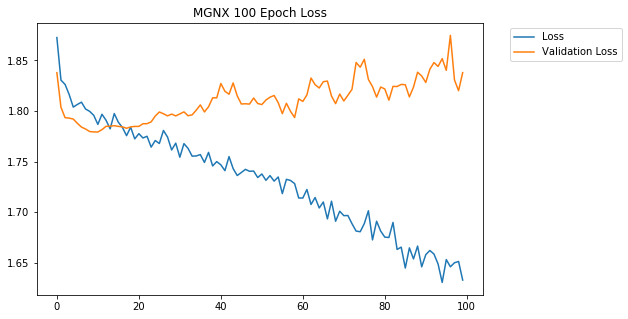

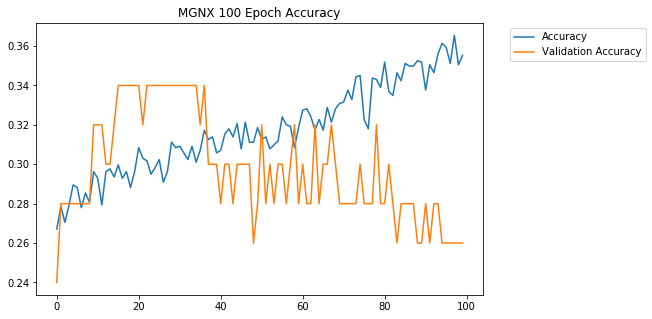

Train on 43 samples, validate on 50 samples
Epoch 1/100
43/43 [==============================] - 0s 618us/step - loss: 2.1346 - acc: 0.2326 - val_loss: 2.2311 - val_acc: 0.2200
Epoch 2/100
43/43 [==============================] - 0s 781us/step - loss: 2.3172 - acc: 0.1628 - val_loss: 2.1867 - val_acc: 0.2400
Epoch 3/100
43/43 [==============================] - 0s 620us/step - loss: 2.1677 - acc: 0.1860 - val_loss: 2.1360 - val_acc: 0.2000
Epoch 4/100
43/43 [==============================] - 0s 738us/step - loss: 2.3118 - acc: 0.1628 - val_loss: 2.0898 - val_acc: 0.1800
Epoch 5/100
43/43 [==============================] - 0s 665us/step - loss: 2.1246 - acc: 0.2791 - val_loss: 2.0524 - val_acc: 0.1800
Epoch 6/100
43/43 [==============================] - 0s 646us/step - loss: 2.0836 - acc: 0.2326 - val_loss: 2.0308 - val_acc: 0.2000
Epoch 7/100
43/43 [==============================] - 0s 609us/step - loss: 2.1205 - acc: 0.2093 - val_loss: 2.0184 - val_acc: 0.2000
Epoch 8/100
43/43 [======

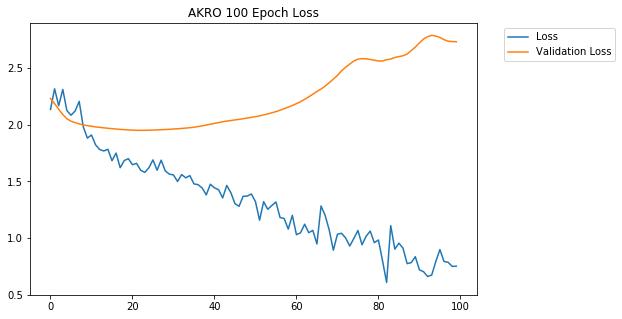

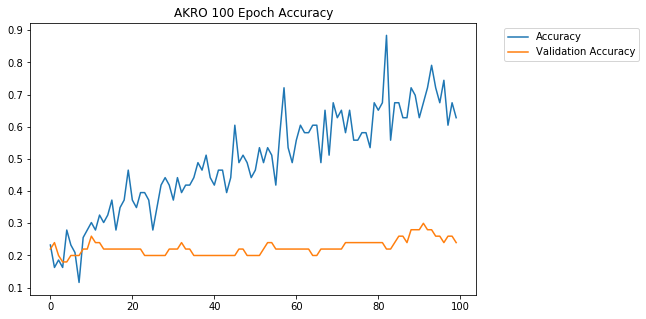

Train on 1549 samples, validate on 50 samples
Epoch 1/100
1549/1549 [==============================] - 0s 225us/step - loss: 2.1773 - acc: 0.2376 - val_loss: 1.7643 - val_acc: 0.2400
Epoch 2/100
1549/1549 [==============================] - 0s 219us/step - loss: 1.8505 - acc: 0.2628 - val_loss: 1.7881 - val_acc: 0.2200
Epoch 3/100
1549/1549 [==============================] - 0s 222us/step - loss: 1.8072 - acc: 0.2763 - val_loss: 1.7744 - val_acc: 0.2600
Epoch 4/100
1549/1549 [==============================] - 0s 210us/step - loss: 1.8033 - acc: 0.2731 - val_loss: 1.7632 - val_acc: 0.2400
Epoch 5/100
1549/1549 [==============================] - 0s 203us/step - loss: 1.7956 - acc: 0.2776 - val_loss: 1.7636 - val_acc: 0.2200
Epoch 6/100
1549/1549 [==============================] - 0s 214us/step - loss: 1.7934 - acc: 0.2750 - val_loss: 1.7597 - val_acc: 0.2600
Epoch 7/100
1549/1549 [==============================] - 0s 208us/step - loss: 1.7895 - acc: 0.2821 - val_loss: 1.7563 - val_acc: 0.

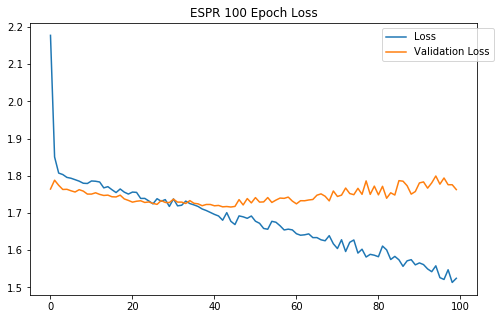

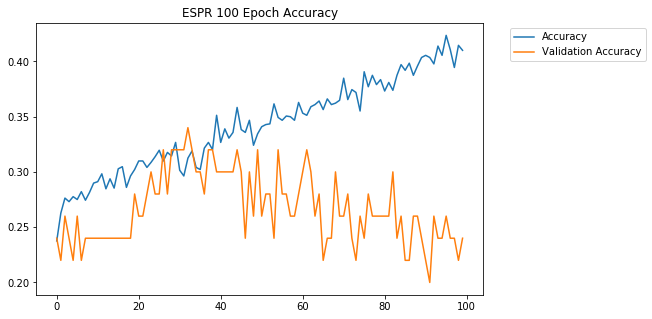

Train on 578 samples, validate on 50 samples
Epoch 1/100
578/578 [==============================] - 0s 401us/step - loss: 1.8780 - acc: 0.2699 - val_loss: 1.8648 - val_acc: 0.2600
Epoch 2/100
578/578 [==============================] - 0s 219us/step - loss: 1.8750 - acc: 0.2578 - val_loss: 1.8648 - val_acc: 0.2000
Epoch 3/100
578/578 [==============================] - 0s 253us/step - loss: 1.8324 - acc: 0.2491 - val_loss: 1.8615 - val_acc: 0.2400
Epoch 4/100
578/578 [==============================] - 0s 231us/step - loss: 1.7863 - acc: 0.2682 - val_loss: 1.8702 - val_acc: 0.2600
Epoch 5/100
578/578 [==============================] - 0s 246us/step - loss: 1.7872 - acc: 0.2526 - val_loss: 1.8728 - val_acc: 0.2600
Epoch 6/100
578/578 [==============================] - 0s 219us/step - loss: 1.7430 - acc: 0.2993 - val_loss: 1.8727 - val_acc: 0.2400
Epoch 7/100
578/578 [==============================] - 0s 221us/step - loss: 1.7534 - acc: 0.2993 - val_loss: 1.8714 - val_acc: 0.2400
Epoch 8/10

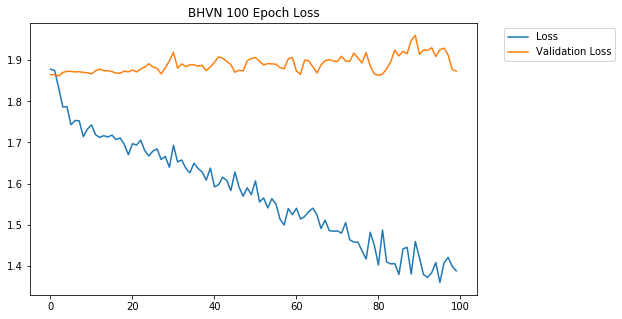

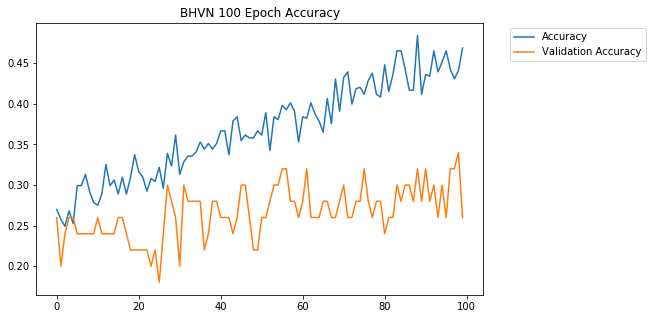

Train on 229 samples, validate on 50 samples
Epoch 1/100
229/229 [==============================] - 0s 604us/step - loss: 2.3295 - acc: 0.2183 - val_loss: 1.8931 - val_acc: 0.2200
Epoch 2/100
229/229 [==============================] - 0s 299us/step - loss: 2.1063 - acc: 0.2445 - val_loss: 1.8682 - val_acc: 0.1600
Epoch 3/100
229/229 [==============================] - 0s 305us/step - loss: 2.0979 - acc: 0.2533 - val_loss: 1.8643 - val_acc: 0.1200
Epoch 4/100
229/229 [==============================] - 0s 305us/step - loss: 2.0139 - acc: 0.2009 - val_loss: 1.8423 - val_acc: 0.1200
Epoch 5/100
229/229 [==============================] - 0s 308us/step - loss: 1.9661 - acc: 0.2183 - val_loss: 1.8205 - val_acc: 0.1200
Epoch 6/100
229/229 [==============================] - 0s 287us/step - loss: 1.8651 - acc: 0.2533 - val_loss: 1.8041 - val_acc: 0.1200
Epoch 7/100
229/229 [==============================] - 0s 306us/step - loss: 1.8583 - acc: 0.2620 - val_loss: 1.7925 - val_acc: 0.1200
Epoch 8/10

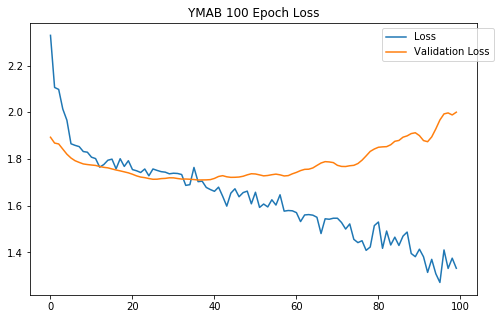

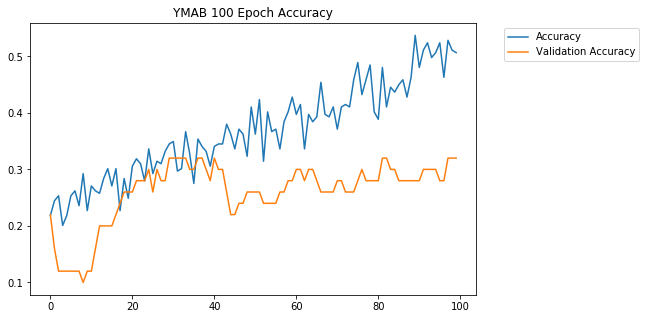

Train on 988 samples, validate on 50 samples
Epoch 1/100
988/988 [==============================] - 0s 218us/step - loss: 2.1736 - acc: 0.2358 - val_loss: 1.7476 - val_acc: 0.3200
Epoch 2/100
988/988 [==============================] - 0s 228us/step - loss: 1.9136 - acc: 0.2591 - val_loss: 1.7527 - val_acc: 0.3600
Epoch 3/100
988/988 [==============================] - 0s 217us/step - loss: 1.8788 - acc: 0.2480 - val_loss: 1.7723 - val_acc: 0.3600
Epoch 4/100
988/988 [==============================] - 0s 224us/step - loss: 1.8374 - acc: 0.2854 - val_loss: 1.7920 - val_acc: 0.2800
Epoch 5/100
988/988 [==============================] - 0s 205us/step - loss: 1.8335 - acc: 0.2895 - val_loss: 1.8062 - val_acc: 0.2800
Epoch 6/100
988/988 [==============================] - 0s 211us/step - loss: 1.8263 - acc: 0.2642 - val_loss: 1.8128 - val_acc: 0.2800
Epoch 7/100
988/988 [==============================] - 0s 211us/step - loss: 1.8103 - acc: 0.2652 - val_loss: 1.8095 - val_acc: 0.2800
Epoch 8/10

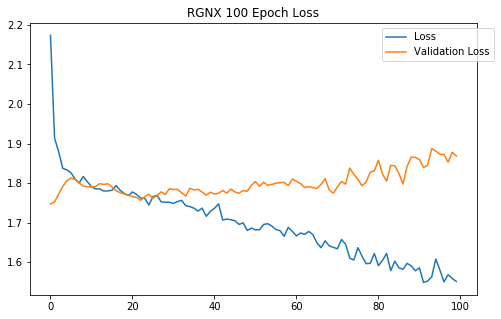

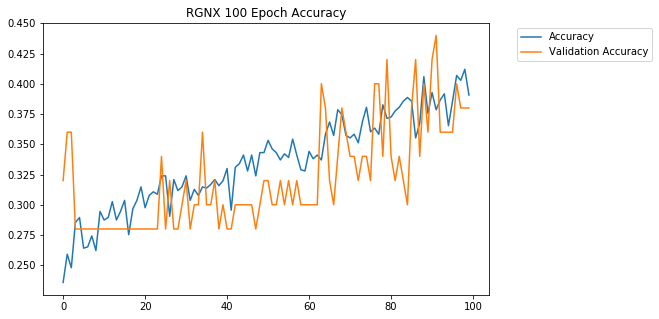

Train on 958 samples, validate on 50 samples
Epoch 1/100
958/958 [==============================] - 0s 326us/step - loss: 1.9705 - acc: 0.2296 - val_loss: 1.6268 - val_acc: 0.4800
Epoch 2/100
958/958 [==============================] - 0s 216us/step - loss: 1.8405 - acc: 0.2401 - val_loss: 1.6158 - val_acc: 0.4400
Epoch 3/100
958/958 [==============================] - 0s 214us/step - loss: 1.8159 - acc: 0.2651 - val_loss: 1.6159 - val_acc: 0.3600
Epoch 4/100
958/958 [==============================] - 0s 219us/step - loss: 1.7672 - acc: 0.2871 - val_loss: 1.5949 - val_acc: 0.4200
Epoch 5/100
958/958 [==============================] - 0s 260us/step - loss: 1.7723 - acc: 0.2787 - val_loss: 1.5810 - val_acc: 0.4200
Epoch 6/100
958/958 [==============================] - 0s 219us/step - loss: 1.7699 - acc: 0.2829 - val_loss: 1.5759 - val_acc: 0.4600
Epoch 7/100
958/958 [==============================] - 0s 208us/step - loss: 1.7574 - acc: 0.2902 - val_loss: 1.5889 - val_acc: 0.4200
Epoch 8/10

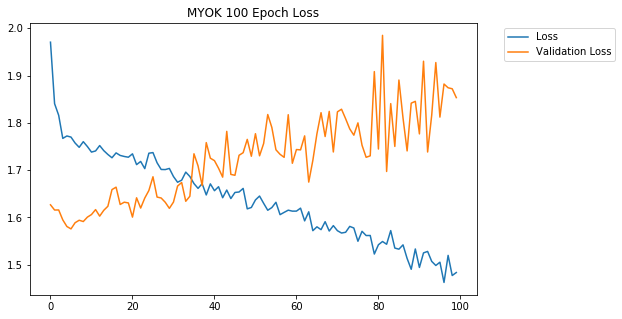

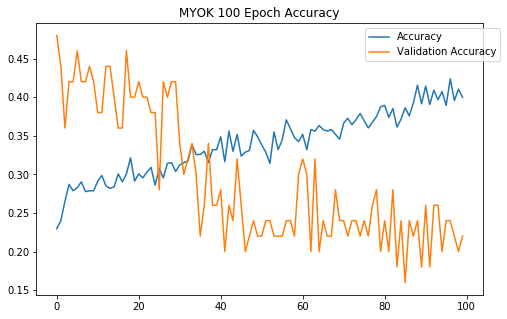

Train on 87 samples, validate on 50 samples
Epoch 1/100
87/87 [==============================] - 0s 2ms/step - loss: 2.2675 - acc: 0.1379 - val_loss: 1.7882 - val_acc: 0.3600
Epoch 2/100
87/87 [==============================] - 0s 350us/step - loss: 2.2424 - acc: 0.1379 - val_loss: 1.7842 - val_acc: 0.3600
Epoch 3/100
87/87 [==============================] - 0s 341us/step - loss: 2.2902 - acc: 0.1839 - val_loss: 1.7791 - val_acc: 0.3600
Epoch 4/100
87/87 [==============================] - 0s 399us/step - loss: 2.0560 - acc: 0.2184 - val_loss: 1.7741 - val_acc: 0.3600
Epoch 5/100
87/87 [==============================] - 0s 337us/step - loss: 2.1714 - acc: 0.2299 - val_loss: 1.7718 - val_acc: 0.3400
Epoch 6/100
87/87 [==============================] - 0s 351us/step - loss: 1.8577 - acc: 0.2299 - val_loss: 1.7729 - val_acc: 0.3400
Epoch 7/100
87/87 [==============================] - 0s 300us/step - loss: 1.9637 - acc: 0.2644 - val_loss: 1.7750 - val_acc: 0.3600
Epoch 8/100
87/87 [========

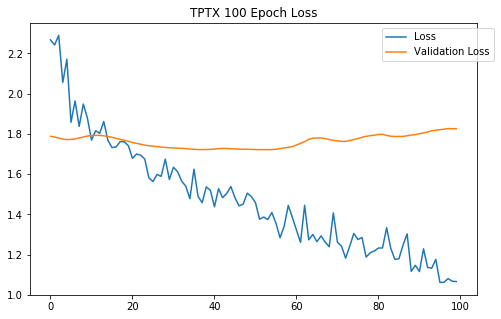

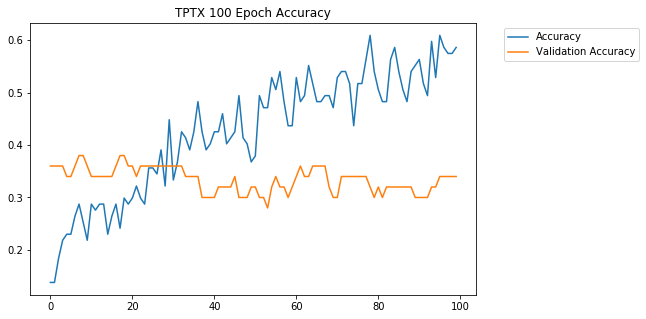

Train on 550 samples, validate on 50 samples
Epoch 1/100
550/550 [==============================] - 0s 329us/step - loss: 2.1849 - acc: 0.2073 - val_loss: 1.9522 - val_acc: 0.2600
Epoch 2/100
550/550 [==============================] - 0s 261us/step - loss: 2.0088 - acc: 0.2582 - val_loss: 1.9083 - val_acc: 0.2600
Epoch 3/100
550/550 [==============================] - 0s 230us/step - loss: 1.8637 - acc: 0.2473 - val_loss: 1.8911 - val_acc: 0.2600
Epoch 4/100
550/550 [==============================] - 0s 240us/step - loss: 1.8063 - acc: 0.2418 - val_loss: 1.8851 - val_acc: 0.2600
Epoch 5/100
550/550 [==============================] - 0s 225us/step - loss: 1.8038 - acc: 0.2582 - val_loss: 1.8835 - val_acc: 0.2600
Epoch 6/100
550/550 [==============================] - 0s 225us/step - loss: 1.7690 - acc: 0.2655 - val_loss: 1.8790 - val_acc: 0.2600
Epoch 7/100
550/550 [==============================] - 0s 244us/step - loss: 1.7474 - acc: 0.2618 - val_loss: 1.8757 - val_acc: 0.2600
Epoch 8/10

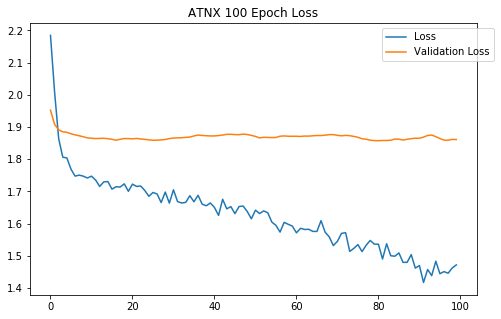

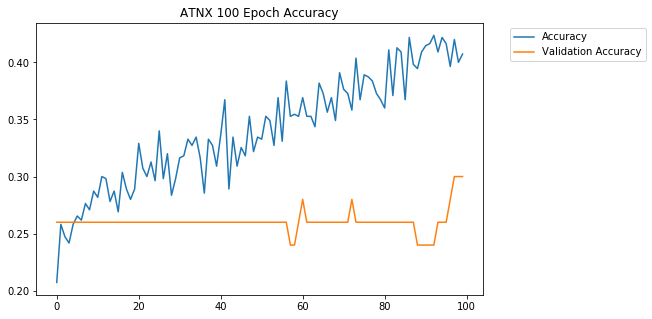

Train on 1554 samples, validate on 50 samples
Epoch 1/100
1554/1554 [==============================] - 0s 260us/step - loss: 2.0393 - acc: 0.2072 - val_loss: 1.7707 - val_acc: 0.2200
Epoch 2/100
1554/1554 [==============================] - 0s 223us/step - loss: 1.8918 - acc: 0.2426 - val_loss: 1.7714 - val_acc: 0.2600
Epoch 3/100
1554/1554 [==============================] - 0s 219us/step - loss: 1.8616 - acc: 0.2580 - val_loss: 1.7793 - val_acc: 0.2200
Epoch 4/100
1554/1554 [==============================] - 0s 212us/step - loss: 1.8539 - acc: 0.2593 - val_loss: 1.7862 - val_acc: 0.2400
Epoch 5/100
1554/1554 [==============================] - 0s 220us/step - loss: 1.8433 - acc: 0.2400 - val_loss: 1.7891 - val_acc: 0.2200
Epoch 6/100
1554/1554 [==============================] - 0s 209us/step - loss: 1.8288 - acc: 0.2728 - val_loss: 1.7910 - val_acc: 0.2200
Epoch 7/100
1554/1554 [==============================] - 0s 208us/step - loss: 1.8231 - acc: 0.2658 - val_loss: 1.7893 - val_acc: 0.

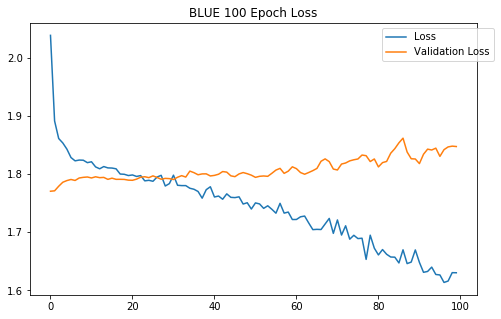

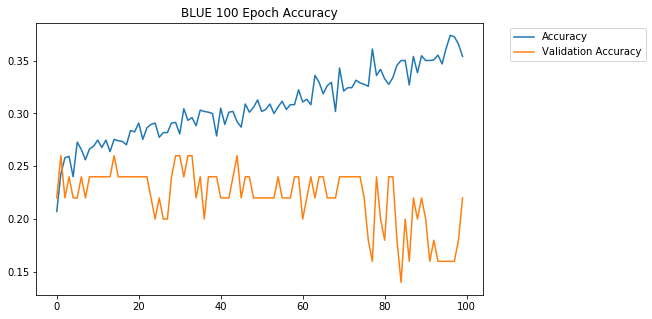

Train on 4914 samples, validate on 50 samples
Epoch 1/100
4914/4914 [==============================] - 1s 220us/step - loss: 1.9036 - acc: 0.2477 - val_loss: 1.8158 - val_acc: 0.2600
Epoch 2/100
4914/4914 [==============================] - 1s 197us/step - loss: 1.8272 - acc: 0.2680 - val_loss: 1.8189 - val_acc: 0.3200
Epoch 3/100
4914/4914 [==============================] - 1s 205us/step - loss: 1.8172 - acc: 0.2707 - val_loss: 1.8034 - val_acc: 0.3200
Epoch 4/100
4914/4914 [==============================] - 1s 202us/step - loss: 1.8074 - acc: 0.2731 - val_loss: 1.8331 - val_acc: 0.2800
Epoch 5/100
4914/4914 [==============================] - 1s 206us/step - loss: 1.8103 - acc: 0.2729 - val_loss: 1.8089 - val_acc: 0.3200
Epoch 6/100
4914/4914 [==============================] - 1s 205us/step - loss: 1.8005 - acc: 0.2825 - val_loss: 1.7950 - val_acc: 0.3200
Epoch 7/100
4914/4914 [==============================] - 1s 207us/step - loss: 1.8010 - acc: 0.2761 - val_loss: 1.8014 - val_acc: 0.

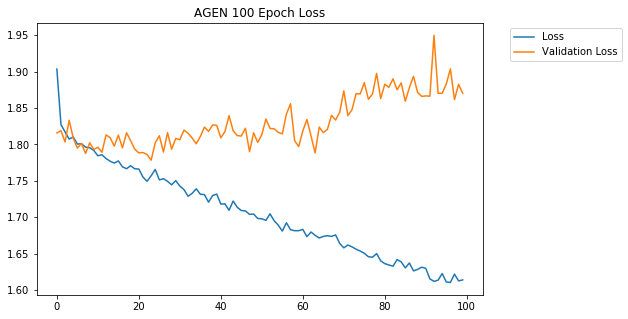

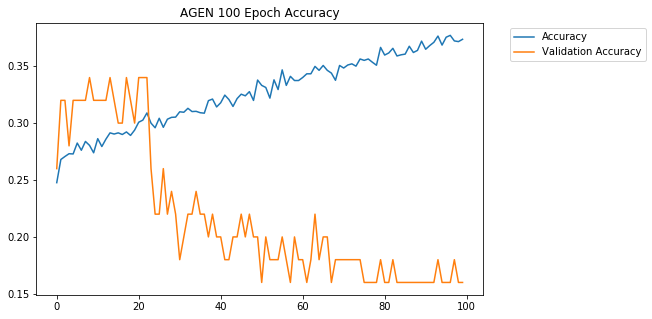

Train on 293 samples, validate on 50 samples
Epoch 1/100
293/293 [==============================] - 0s 532us/step - loss: 2.0158 - acc: 0.1945 - val_loss: 1.7167 - val_acc: 0.3400
Epoch 2/100
293/293 [==============================] - 0s 236us/step - loss: 1.9652 - acc: 0.2082 - val_loss: 1.7172 - val_acc: 0.3400
Epoch 3/100
293/293 [==============================] - 0s 218us/step - loss: 1.9251 - acc: 0.1945 - val_loss: 1.7135 - val_acc: 0.3600
Epoch 4/100
293/293 [==============================] - 0s 228us/step - loss: 1.9035 - acc: 0.2355 - val_loss: 1.7063 - val_acc: 0.3600
Epoch 5/100
293/293 [==============================] - 0s 223us/step - loss: 1.9144 - acc: 0.2218 - val_loss: 1.6970 - val_acc: 0.3800
Epoch 6/100
293/293 [==============================] - 0s 229us/step - loss: 1.8973 - acc: 0.2287 - val_loss: 1.6886 - val_acc: 0.3800
Epoch 7/100
293/293 [==============================] - 0s 238us/step - loss: 1.8605 - acc: 0.2355 - val_loss: 1.6845 - val_acc: 0.3800
Epoch 8/10

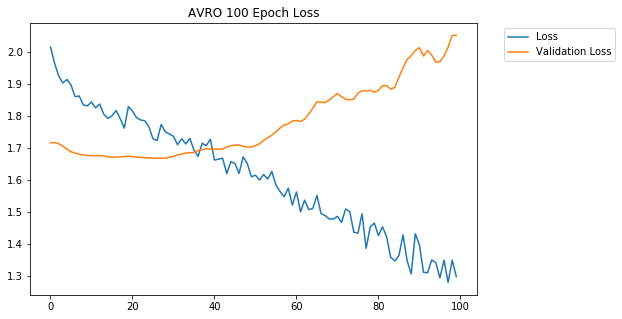

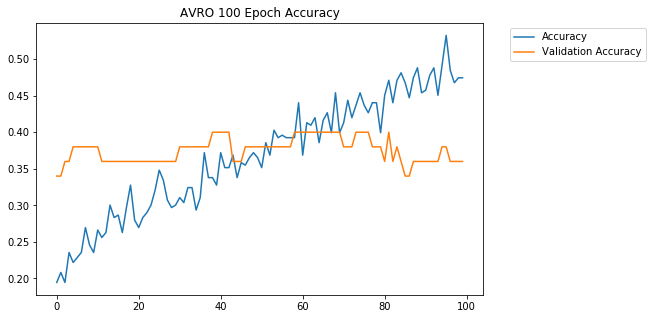

Train on 476 samples, validate on 50 samples
Epoch 1/100
476/476 [==============================] - 0s 238us/step - loss: 2.2485 - acc: 0.2164 - val_loss: 1.9360 - val_acc: 0.2200
Epoch 2/100
476/476 [==============================] - 0s 256us/step - loss: 2.0802 - acc: 0.2374 - val_loss: 1.9202 - val_acc: 0.2200
Epoch 3/100
476/476 [==============================] - 0s 230us/step - loss: 2.0218 - acc: 0.2143 - val_loss: 1.9188 - val_acc: 0.1800
Epoch 4/100
476/476 [==============================] - 0s 232us/step - loss: 1.9271 - acc: 0.2248 - val_loss: 1.9282 - val_acc: 0.1600
Epoch 5/100
476/476 [==============================] - 0s 263us/step - loss: 1.8460 - acc: 0.2416 - val_loss: 1.9419 - val_acc: 0.1600
Epoch 6/100
476/476 [==============================] - 0s 228us/step - loss: 1.8198 - acc: 0.2857 - val_loss: 1.9504 - val_acc: 0.1600
Epoch 7/100
476/476 [==============================] - 0s 222us/step - loss: 1.8180 - acc: 0.2542 - val_loss: 1.9569 - val_acc: 0.1600
Epoch 8/10

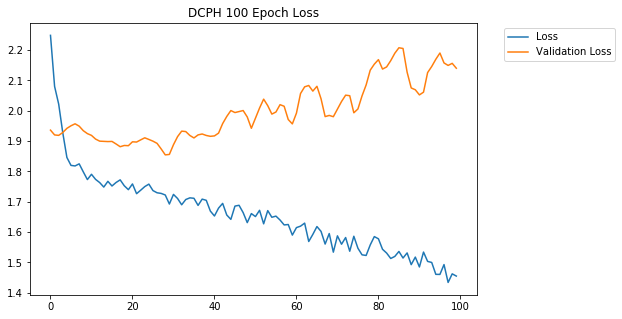

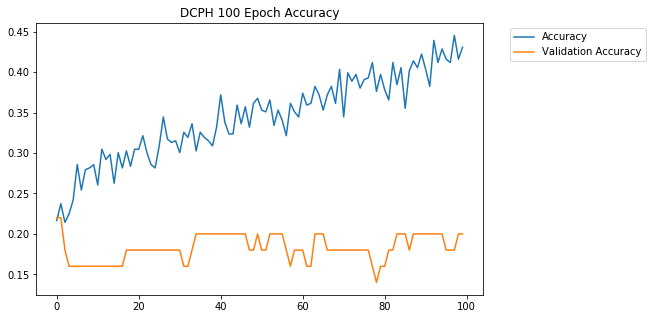

Train on 973 samples, validate on 50 samples
Epoch 1/100
973/973 [==============================] - 0s 210us/step - loss: 2.0186 - acc: 0.2405 - val_loss: 1.8227 - val_acc: 0.3400
Epoch 2/100
973/973 [==============================] - 0s 215us/step - loss: 1.8907 - acc: 0.2261 - val_loss: 1.7257 - val_acc: 0.3400
Epoch 3/100
973/973 [==============================] - 0s 225us/step - loss: 1.8383 - acc: 0.2528 - val_loss: 1.7196 - val_acc: 0.3400
Epoch 4/100
973/973 [==============================] - 0s 223us/step - loss: 1.8048 - acc: 0.2765 - val_loss: 1.7259 - val_acc: 0.3200
Epoch 5/100
973/973 [==============================] - 0s 207us/step - loss: 1.8095 - acc: 0.2693 - val_loss: 1.7222 - val_acc: 0.3200
Epoch 6/100
973/973 [==============================] - 0s 211us/step - loss: 1.8009 - acc: 0.2724 - val_loss: 1.7228 - val_acc: 0.2600
Epoch 7/100
973/973 [==============================] - 0s 215us/step - loss: 1.8083 - acc: 0.2662 - val_loss: 1.7285 - val_acc: 0.2800
Epoch 8/10

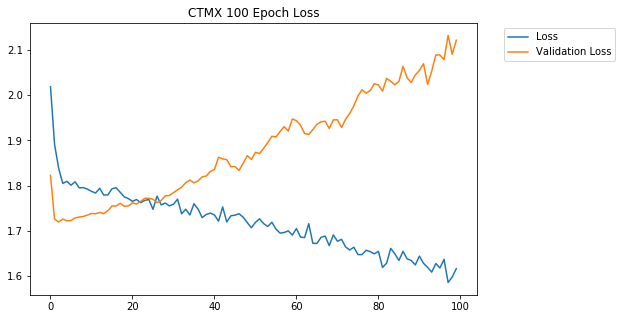

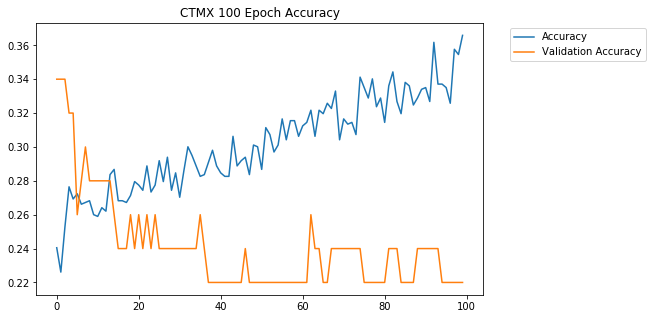

Train on 3129 samples, validate on 50 samples
Epoch 1/100
3129/3129 [==============================] - 1s 214us/step - loss: 1.5272 - acc: 0.4928 - val_loss: 1.9906 - val_acc: 0.3000
Epoch 2/100
3129/3129 [==============================] - 1s 207us/step - loss: 1.2914 - acc: 0.5500 - val_loss: 1.9591 - val_acc: 0.3200
Epoch 3/100
3129/3129 [==============================] - 1s 206us/step - loss: 1.2597 - acc: 0.5586 - val_loss: 1.9495 - val_acc: 0.3000
Epoch 4/100
3129/3129 [==============================] - 1s 217us/step - loss: 1.2405 - acc: 0.5551 - val_loss: 1.9100 - val_acc: 0.3200
Epoch 5/100
3129/3129 [==============================] - 1s 205us/step - loss: 1.2372 - acc: 0.5622 - val_loss: 1.9162 - val_acc: 0.3000
Epoch 6/100
3129/3129 [==============================] - 1s 218us/step - loss: 1.2199 - acc: 0.5609 - val_loss: 1.9230 - val_acc: 0.3000
Epoch 7/100
3129/3129 [==============================] - 1s 214us/step - loss: 1.2207 - acc: 0.5698 - val_loss: 1.9194 - val_acc: 0.

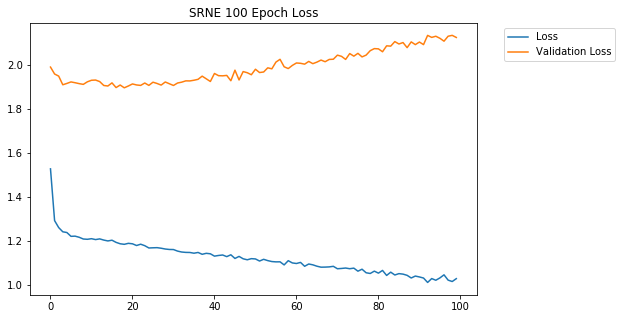

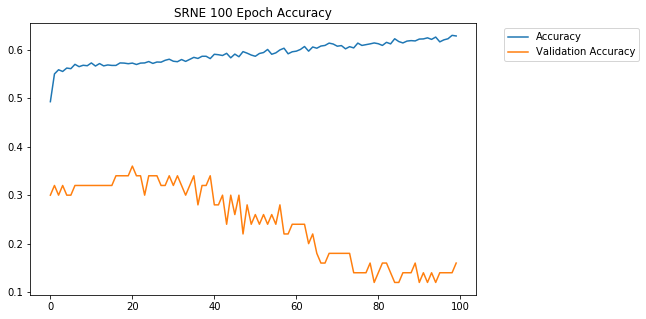

Train on 1302 samples, validate on 50 samples
Epoch 1/100
1302/1302 [==============================] - 0s 300us/step - loss: 2.7703 - acc: 0.2051 - val_loss: 2.0468 - val_acc: 0.2600
Epoch 2/100
1302/1302 [==============================] - 0s 232us/step - loss: 1.9158 - acc: 0.2312 - val_loss: 1.8588 - val_acc: 0.2200
Epoch 3/100
1302/1302 [==============================] - 0s 245us/step - loss: 1.8460 - acc: 0.2573 - val_loss: 1.8531 - val_acc: 0.2400
Epoch 4/100
1302/1302 [==============================] - 0s 254us/step - loss: 1.8437 - acc: 0.2704 - val_loss: 1.8604 - val_acc: 0.2400
Epoch 5/100
1302/1302 [==============================] - 0s 219us/step - loss: 1.8395 - acc: 0.2773 - val_loss: 1.8659 - val_acc: 0.1800
Epoch 6/100
1302/1302 [==============================] - 0s 225us/step - loss: 1.8201 - acc: 0.2550 - val_loss: 1.8564 - val_acc: 0.1800
Epoch 7/100
1302/1302 [==============================] - 0s 234us/step - loss: 1.8323 - acc: 0.2673 - val_loss: 1.8598 - val_acc: 0.

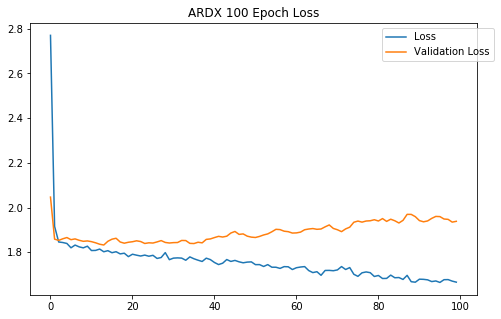

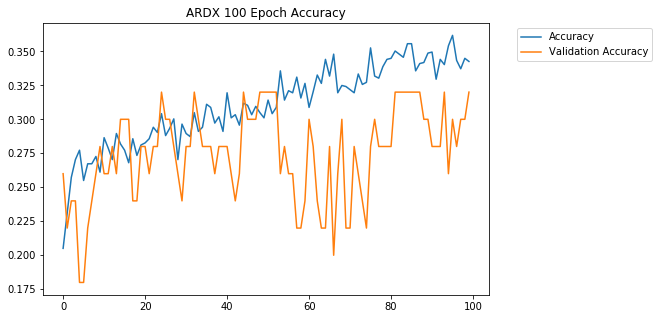

Train on 4939 samples, validate on 50 samples
Epoch 1/100
4939/4939 [==============================] - 1s 210us/step - loss: 1.8892 - acc: 0.2490 - val_loss: 1.7852 - val_acc: 0.3200
Epoch 2/100
4939/4939 [==============================] - 1s 212us/step - loss: 1.8432 - acc: 0.2618 - val_loss: 1.7733 - val_acc: 0.3000
Epoch 3/100
4939/4939 [==============================] - 1s 208us/step - loss: 1.8400 - acc: 0.2594 - val_loss: 1.7707 - val_acc: 0.3400
Epoch 4/100
4939/4939 [==============================] - 1s 207us/step - loss: 1.8313 - acc: 0.2573 - val_loss: 1.7724 - val_acc: 0.3400
Epoch 5/100
4939/4939 [==============================] - 1s 202us/step - loss: 1.8305 - acc: 0.2671 - val_loss: 1.7709 - val_acc: 0.3400
Epoch 6/100
4939/4939 [==============================] - 1s 204us/step - loss: 1.8222 - acc: 0.2658 - val_loss: 1.7718 - val_acc: 0.3000
Epoch 7/100
4939/4939 [==============================] - 1s 227us/step - loss: 1.8227 - acc: 0.2735 - val_loss: 1.7601 - val_acc: 0.

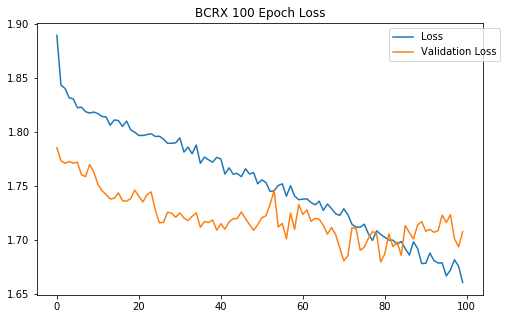

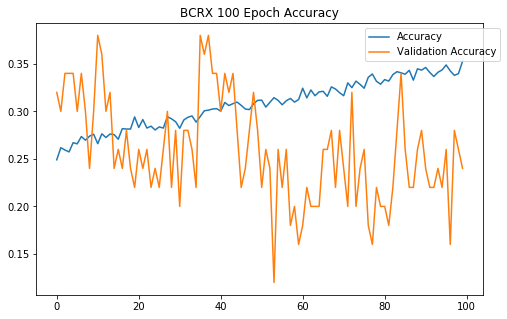

Train on 814 samples, validate on 50 samples
Epoch 1/100
814/814 [==============================] - 0s 232us/step - loss: 1.8830 - acc: 0.2666 - val_loss: 1.7828 - val_acc: 0.3200
Epoch 2/100
814/814 [==============================] - 0s 255us/step - loss: 1.8799 - acc: 0.2666 - val_loss: 1.7862 - val_acc: 0.2800
Epoch 3/100
814/814 [==============================] - 0s 233us/step - loss: 1.8389 - acc: 0.2629 - val_loss: 1.7907 - val_acc: 0.2800
Epoch 4/100
814/814 [==============================] - 0s 223us/step - loss: 1.8194 - acc: 0.2690 - val_loss: 1.7965 - val_acc: 0.3000
Epoch 5/100
814/814 [==============================] - 0s 232us/step - loss: 1.8234 - acc: 0.2764 - val_loss: 1.7966 - val_acc: 0.3000
Epoch 6/100
814/814 [==============================] - 0s 256us/step - loss: 1.8072 - acc: 0.2985 - val_loss: 1.7947 - val_acc: 0.3000
Epoch 7/100
814/814 [==============================] - 0s 243us/step - loss: 1.8030 - acc: 0.2838 - val_loss: 1.7933 - val_acc: 0.2800
Epoch 8/10

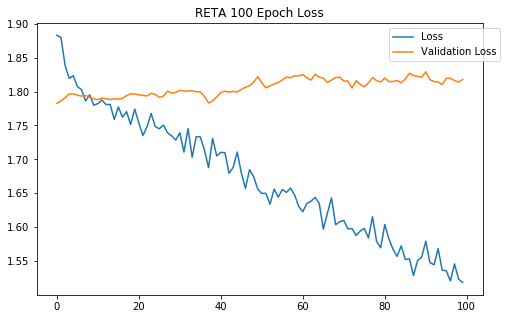

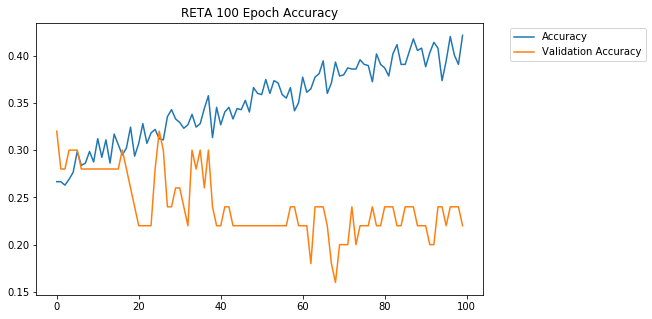

Train on 787 samples, validate on 50 samples
Epoch 1/100
787/787 [==============================] - 0s 229us/step - loss: 1.7824 - acc: 0.4053 - val_loss: 1.7536 - val_acc: 0.2600
Epoch 2/100
787/787 [==============================] - 0s 258us/step - loss: 1.5726 - acc: 0.4981 - val_loss: 1.7570 - val_acc: 0.2400
Epoch 3/100
787/787 [==============================] - 0s 226us/step - loss: 1.4564 - acc: 0.5044 - val_loss: 1.7660 - val_acc: 0.2400
Epoch 4/100
787/787 [==============================] - 0s 224us/step - loss: 1.4547 - acc: 0.5210 - val_loss: 1.7705 - val_acc: 0.2400
Epoch 5/100
787/787 [==============================] - 0s 207us/step - loss: 1.3986 - acc: 0.5070 - val_loss: 1.7733 - val_acc: 0.2400
Epoch 6/100
787/787 [==============================] - 0s 223us/step - loss: 1.3713 - acc: 0.5184 - val_loss: 1.7735 - val_acc: 0.2400
Epoch 7/100
787/787 [==============================] - 0s 210us/step - loss: 1.3765 - acc: 0.4994 - val_loss: 1.7767 - val_acc: 0.2400
Epoch 8/10

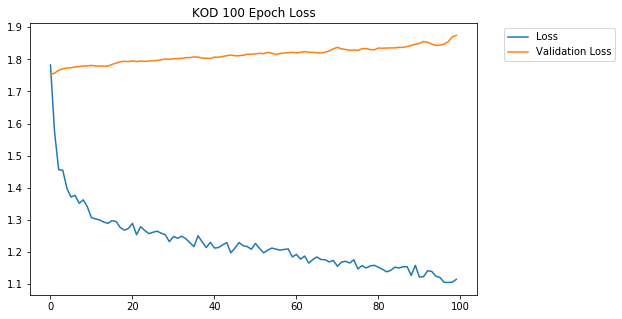

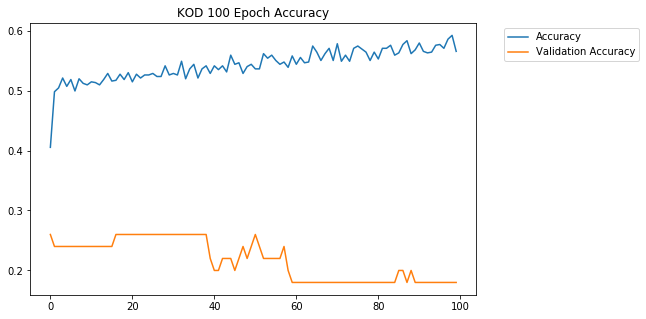

Train on 317 samples, validate on 50 samples
Epoch 1/100
317/317 [==============================] - 0s 490us/step - loss: 3.0483 - acc: 0.1893 - val_loss: 2.2906 - val_acc: 0.1800
Epoch 2/100
317/317 [==============================] - 0s 276us/step - loss: 2.1909 - acc: 0.2050 - val_loss: 2.3162 - val_acc: 0.1200
Epoch 3/100
317/317 [==============================] - 0s 321us/step - loss: 2.0372 - acc: 0.2555 - val_loss: 2.1900 - val_acc: 0.1200
Epoch 4/100
317/317 [==============================] - 0s 291us/step - loss: 1.9509 - acc: 0.2303 - val_loss: 2.0908 - val_acc: 0.1000
Epoch 5/100
317/317 [==============================] - 0s 290us/step - loss: 1.8811 - acc: 0.2839 - val_loss: 2.0464 - val_acc: 0.1000
Epoch 6/100
317/317 [==============================] - 0s 288us/step - loss: 1.8427 - acc: 0.2618 - val_loss: 2.0225 - val_acc: 0.1000
Epoch 7/100
317/317 [==============================] - 0s 266us/step - loss: 1.8483 - acc: 0.2744 - val_loss: 1.9939 - val_acc: 0.1000
Epoch 8/10

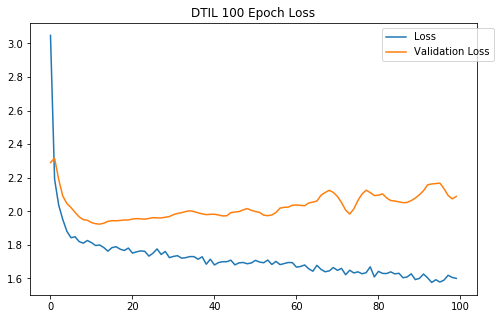

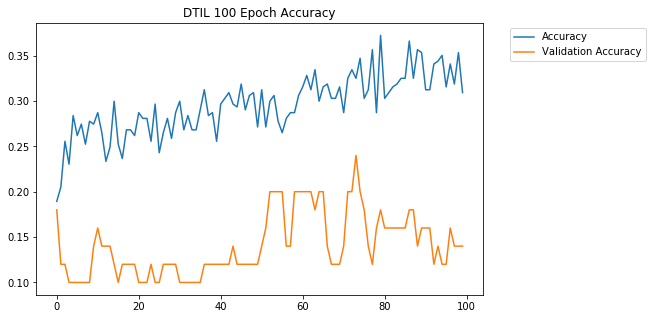

Train on 708 samples, validate on 50 samples
Epoch 1/100
708/708 [==============================] - 0s 325us/step - loss: 1.9992 - acc: 0.2288 - val_loss: 2.7213 - val_acc: 0.0400
Epoch 2/100
708/708 [==============================] - 0s 225us/step - loss: 1.9200 - acc: 0.2345 - val_loss: 2.7467 - val_acc: 0.0400
Epoch 3/100
708/708 [==============================] - 0s 233us/step - loss: 1.9163 - acc: 0.2316 - val_loss: 2.7117 - val_acc: 0.0400
Epoch 4/100
708/708 [==============================] - 0s 248us/step - loss: 1.8959 - acc: 0.2331 - val_loss: 2.6484 - val_acc: 0.0600
Epoch 5/100
708/708 [==============================] - 0s 243us/step - loss: 1.8685 - acc: 0.2599 - val_loss: 2.5652 - val_acc: 0.0600
Epoch 6/100
708/708 [==============================] - 0s 224us/step - loss: 1.8585 - acc: 0.2740 - val_loss: 2.4864 - val_acc: 0.0600
Epoch 7/100
708/708 [==============================] - 0s 244us/step - loss: 1.8579 - acc: 0.2500 - val_loss: 2.4215 - val_acc: 0.1000
Epoch 8/10

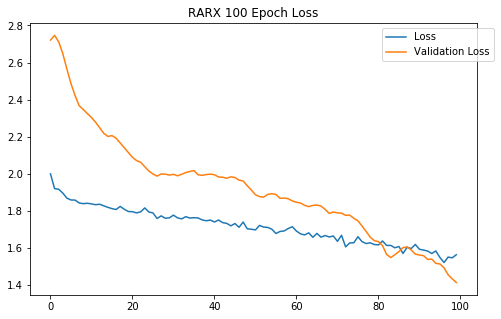

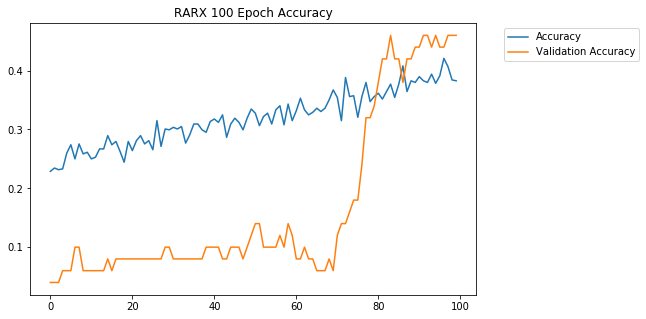

Train on 292 samples, validate on 50 samples
Epoch 1/100
292/292 [==============================] - 0s 599us/step - loss: 2.2343 - acc: 0.1815 - val_loss: 1.8767 - val_acc: 0.1200
Epoch 2/100
292/292 [==============================] - 0s 227us/step - loss: 2.2420 - acc: 0.1644 - val_loss: 1.8541 - val_acc: 0.1000
Epoch 3/100
292/292 [==============================] - 0s 224us/step - loss: 2.1982 - acc: 0.2089 - val_loss: 1.8382 - val_acc: 0.1200
Epoch 4/100
292/292 [==============================] - 0s 226us/step - loss: 2.0776 - acc: 0.2089 - val_loss: 1.8319 - val_acc: 0.1600
Epoch 5/100
292/292 [==============================] - 0s 248us/step - loss: 2.0168 - acc: 0.1747 - val_loss: 1.8354 - val_acc: 0.1200
Epoch 6/100
292/292 [==============================] - 0s 229us/step - loss: 2.0238 - acc: 0.2397 - val_loss: 1.8467 - val_acc: 0.1600
Epoch 7/100
292/292 [==============================] - 0s 215us/step - loss: 1.9706 - acc: 0.2260 - val_loss: 1.8573 - val_acc: 0.2000
Epoch 8/10

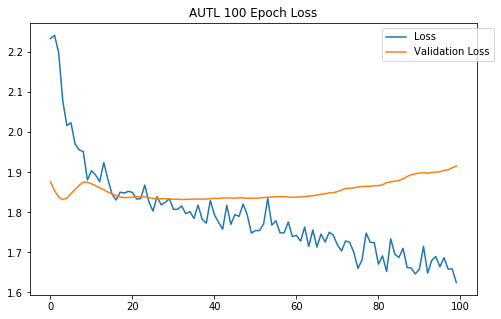

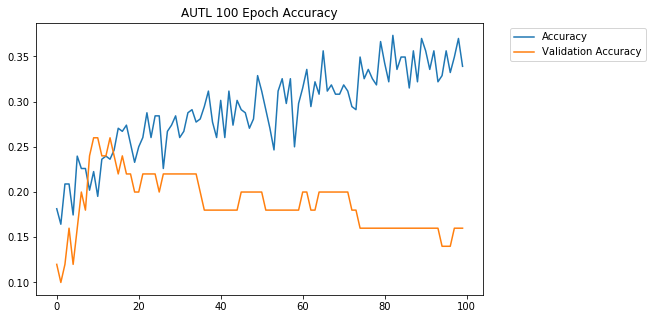

Train on 569 samples, validate on 50 samples
Epoch 1/100
569/569 [==============================] - 0s 404us/step - loss: 1.9454 - acc: 0.1986 - val_loss: 1.9040 - val_acc: 0.2000
Epoch 2/100
569/569 [==============================] - 0s 244us/step - loss: 1.9309 - acc: 0.2039 - val_loss: 1.8903 - val_acc: 0.2000
Epoch 3/100
569/569 [==============================] - 0s 220us/step - loss: 1.9027 - acc: 0.2250 - val_loss: 1.8813 - val_acc: 0.2000
Epoch 4/100
569/569 [==============================] - 0s 219us/step - loss: 1.8732 - acc: 0.2355 - val_loss: 1.8768 - val_acc: 0.2200
Epoch 5/100
569/569 [==============================] - 0s 219us/step - loss: 1.8763 - acc: 0.2390 - val_loss: 1.8741 - val_acc: 0.1800
Epoch 6/100
569/569 [==============================] - 0s 229us/step - loss: 1.8642 - acc: 0.2443 - val_loss: 1.8713 - val_acc: 0.2000
Epoch 7/100
569/569 [==============================] - 0s 222us/step - loss: 1.8448 - acc: 0.2812 - val_loss: 1.8688 - val_acc: 0.2000
Epoch 8/10

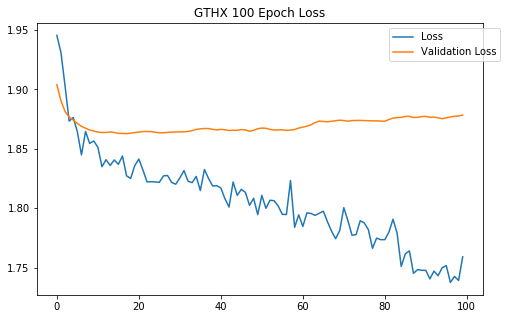

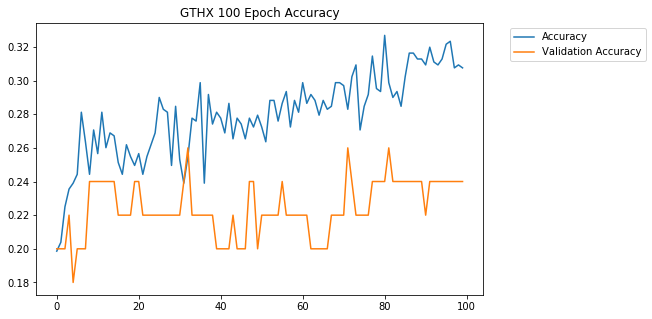

Train on 1398 samples, validate on 50 samples
Epoch 1/100
1398/1398 [==============================] - 0s 287us/step - loss: 1.9406 - acc: 0.2339 - val_loss: 1.7084 - val_acc: 0.3200
Epoch 2/100
1398/1398 [==============================] - 0s 207us/step - loss: 1.8642 - acc: 0.2432 - val_loss: 1.7003 - val_acc: 0.3200
Epoch 3/100
1398/1398 [==============================] - 0s 217us/step - loss: 1.8250 - acc: 0.2654 - val_loss: 1.7033 - val_acc: 0.3400
Epoch 4/100
1398/1398 [==============================] - 0s 209us/step - loss: 1.8126 - acc: 0.2632 - val_loss: 1.7062 - val_acc: 0.3400
Epoch 5/100
1398/1398 [==============================] - 0s 214us/step - loss: 1.8173 - acc: 0.2654 - val_loss: 1.7042 - val_acc: 0.3400
Epoch 6/100
1398/1398 [==============================] - 0s 207us/step - loss: 1.8094 - acc: 0.2818 - val_loss: 1.7089 - val_acc: 0.3000
Epoch 7/100
1398/1398 [==============================] - 0s 218us/step - loss: 1.8068 - acc: 0.2611 - val_loss: 1.7042 - val_acc: 0.

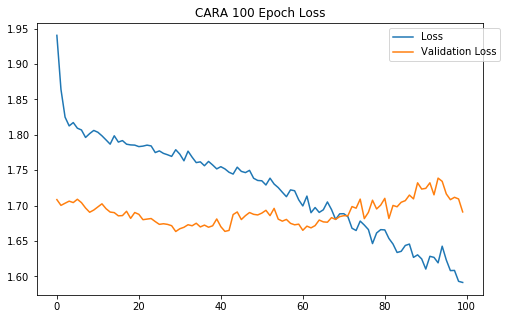

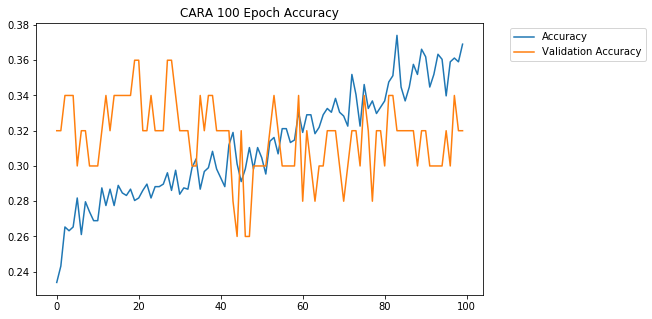

Train on 772 samples, validate on 50 samples
Epoch 1/100
772/772 [==============================] - 0s 234us/step - loss: 2.0219 - acc: 0.2448 - val_loss: 1.8216 - val_acc: 0.3600
Epoch 2/100
772/772 [==============================] - 0s 237us/step - loss: 1.9191 - acc: 0.2591 - val_loss: 1.8518 - val_acc: 0.3200
Epoch 3/100
772/772 [==============================] - 0s 214us/step - loss: 1.8741 - acc: 0.2526 - val_loss: 1.8605 - val_acc: 0.2600
Epoch 4/100
772/772 [==============================] - 0s 231us/step - loss: 1.8315 - acc: 0.2785 - val_loss: 1.8525 - val_acc: 0.2600
Epoch 5/100
772/772 [==============================] - 0s 215us/step - loss: 1.8331 - acc: 0.2772 - val_loss: 1.8337 - val_acc: 0.3400
Epoch 6/100
772/772 [==============================] - 0s 227us/step - loss: 1.8357 - acc: 0.2694 - val_loss: 1.8242 - val_acc: 0.3200
Epoch 7/100
772/772 [==============================] - 0s 221us/step - loss: 1.8229 - acc: 0.2837 - val_loss: 1.8199 - val_acc: 0.3200
Epoch 8/10

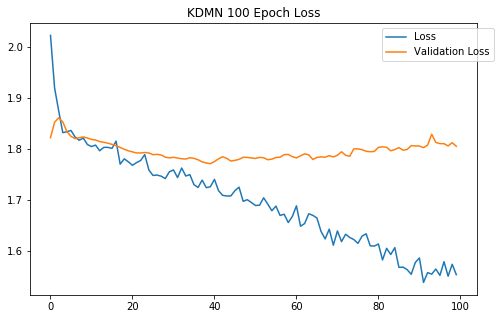

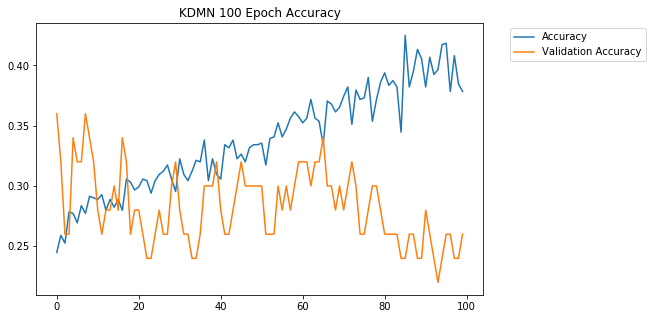

Train on 1438 samples, validate on 50 samples
Epoch 1/100
1438/1438 [==============================] - 0s 218us/step - loss: 1.9257 - acc: 0.2552 - val_loss: 1.7375 - val_acc: 0.2800
Epoch 2/100
1438/1438 [==============================] - 0s 223us/step - loss: 1.7866 - acc: 0.2705 - val_loss: 1.7705 - val_acc: 0.2000
Epoch 3/100
1438/1438 [==============================] - 0s 211us/step - loss: 1.7602 - acc: 0.2803 - val_loss: 1.7745 - val_acc: 0.2200
Epoch 4/100
1438/1438 [==============================] - 0s 223us/step - loss: 1.7659 - acc: 0.2851 - val_loss: 1.7590 - val_acc: 0.2200
Epoch 5/100
1438/1438 [==============================] - 0s 212us/step - loss: 1.7541 - acc: 0.2816 - val_loss: 1.7668 - val_acc: 0.2400
Epoch 6/100
1438/1438 [==============================] - 0s 212us/step - loss: 1.7387 - acc: 0.2962 - val_loss: 1.7716 - val_acc: 0.2400
Epoch 7/100
1438/1438 [==============================] - 0s 226us/step - loss: 1.7470 - acc: 0.2865 - val_loss: 1.7628 - val_acc: 0.

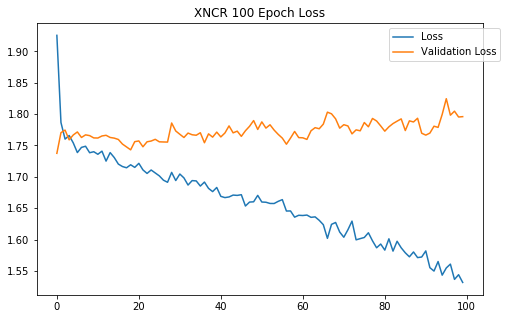

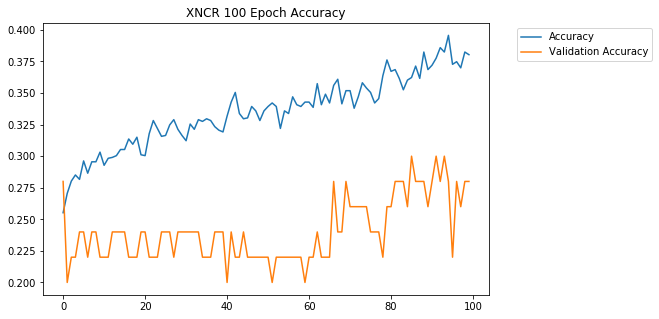

Train on 3213 samples, validate on 50 samples
Epoch 1/100
3213/3213 [==============================] - 1s 224us/step - loss: 1.9285 - acc: 0.2459 - val_loss: 1.7717 - val_acc: 0.1800
Epoch 2/100
3213/3213 [==============================] - 1s 210us/step - loss: 1.8359 - acc: 0.2655 - val_loss: 1.7716 - val_acc: 0.1600
Epoch 3/100
3213/3213 [==============================] - 1s 211us/step - loss: 1.8243 - acc: 0.2655 - val_loss: 1.7800 - val_acc: 0.1600
Epoch 4/100
3213/3213 [==============================] - 1s 205us/step - loss: 1.8192 - acc: 0.2642 - val_loss: 1.7978 - val_acc: 0.1400
Epoch 5/100
3213/3213 [==============================] - 1s 206us/step - loss: 1.8119 - acc: 0.2714 - val_loss: 1.8146 - val_acc: 0.1600
Epoch 6/100
3213/3213 [==============================] - 1s 211us/step - loss: 1.8090 - acc: 0.2661 - val_loss: 1.8115 - val_acc: 0.1800
Epoch 7/100
3213/3213 [==============================] - 1s 210us/step - loss: 1.8093 - acc: 0.2664 - val_loss: 1.8220 - val_acc: 0.

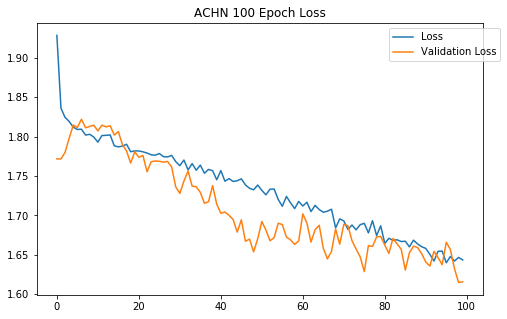

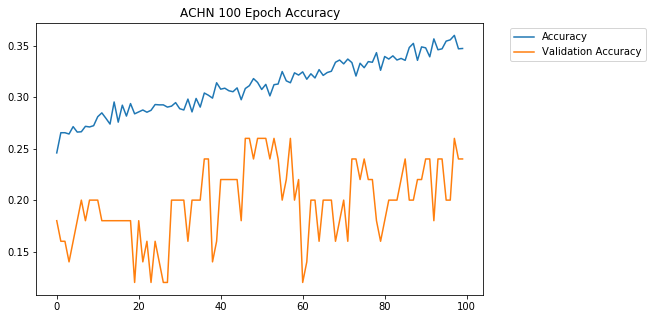

Train on 4795 samples, validate on 50 samples
Epoch 1/100
4795/4795 [==============================] - 1s 219us/step - loss: 1.8413 - acc: 0.2640 - val_loss: 1.6373 - val_acc: 0.2000
Epoch 2/100
4795/4795 [==============================] - 1s 203us/step - loss: 1.7995 - acc: 0.2697 - val_loss: 1.6153 - val_acc: 0.2200
Epoch 3/100
4795/4795 [==============================] - 1s 203us/step - loss: 1.7866 - acc: 0.2776 - val_loss: 1.6232 - val_acc: 0.2400
Epoch 4/100
4795/4795 [==============================] - 1s 201us/step - loss: 1.7770 - acc: 0.2807 - val_loss: 1.6315 - val_acc: 0.2800
Epoch 5/100
4795/4795 [==============================] - 1s 206us/step - loss: 1.7782 - acc: 0.2805 - val_loss: 1.5943 - val_acc: 0.2800
Epoch 6/100
4795/4795 [==============================] - 1s 205us/step - loss: 1.7697 - acc: 0.2838 - val_loss: 1.5860 - val_acc: 0.2800
Epoch 7/100
4795/4795 [==============================] - 1s 208us/step - loss: 1.7727 - acc: 0.2753 - val_loss: 1.6028 - val_acc: 0.

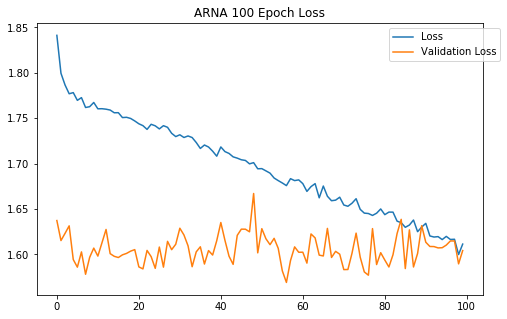

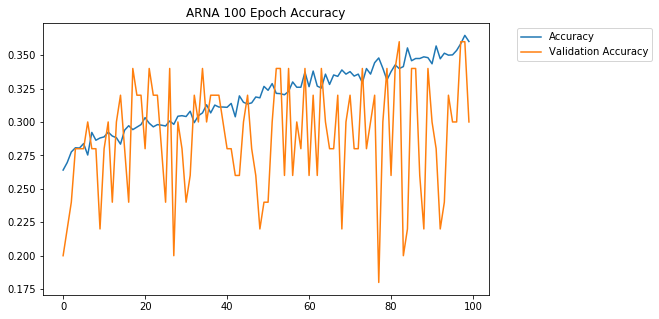

Train on 1135 samples, validate on 50 samples
Epoch 1/100
1135/1135 [==============================] - 0s 215us/step - loss: 1.9639 - acc: 0.2467 - val_loss: 1.7928 - val_acc: 0.2600
Epoch 2/100
1135/1135 [==============================] - 0s 224us/step - loss: 1.8890 - acc: 0.2396 - val_loss: 1.7661 - val_acc: 0.2800
Epoch 3/100
1135/1135 [==============================] - 0s 218us/step - loss: 1.8433 - acc: 0.2722 - val_loss: 1.7484 - val_acc: 0.2800
Epoch 4/100
1135/1135 [==============================] - 0s 230us/step - loss: 1.8243 - acc: 0.2899 - val_loss: 1.7323 - val_acc: 0.3200
Epoch 5/100
1135/1135 [==============================] - 0s 219us/step - loss: 1.8134 - acc: 0.3022 - val_loss: 1.7260 - val_acc: 0.3200
Epoch 6/100
1135/1135 [==============================] - 0s 219us/step - loss: 1.8081 - acc: 0.2828 - val_loss: 1.7198 - val_acc: 0.3400
Epoch 7/100
1135/1135 [==============================] - 0s 265us/step - loss: 1.8057 - acc: 0.2881 - val_loss: 1.7156 - val_acc: 0.

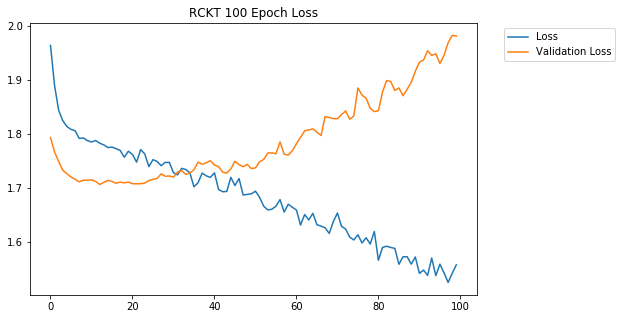

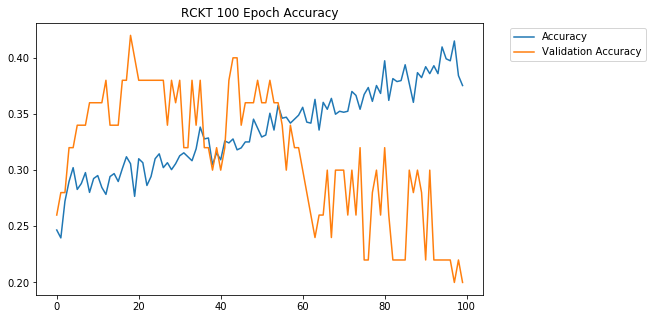

Train on 288 samples, validate on 50 samples
Epoch 1/100
288/288 [==============================] - 0s 229us/step - loss: 2.1688 - acc: 0.1701 - val_loss: 1.9711 - val_acc: 0.3200
Epoch 2/100
288/288 [==============================] - 0s 244us/step - loss: 2.1249 - acc: 0.1910 - val_loss: 1.9294 - val_acc: 0.3400
Epoch 3/100
288/288 [==============================] - 0s 271us/step - loss: 2.0704 - acc: 0.1806 - val_loss: 1.8974 - val_acc: 0.3400
Epoch 4/100
288/288 [==============================] - 0s 225us/step - loss: 1.9532 - acc: 0.2118 - val_loss: 1.8806 - val_acc: 0.3000
Epoch 5/100
288/288 [==============================] - 0s 229us/step - loss: 1.9916 - acc: 0.1493 - val_loss: 1.8680 - val_acc: 0.3200
Epoch 6/100
288/288 [==============================] - 0s 225us/step - loss: 2.0113 - acc: 0.1944 - val_loss: 1.8616 - val_acc: 0.3200
Epoch 7/100
288/288 [==============================] - 0s 246us/step - loss: 1.9574 - acc: 0.2083 - val_loss: 1.8583 - val_acc: 0.3400
Epoch 8/10

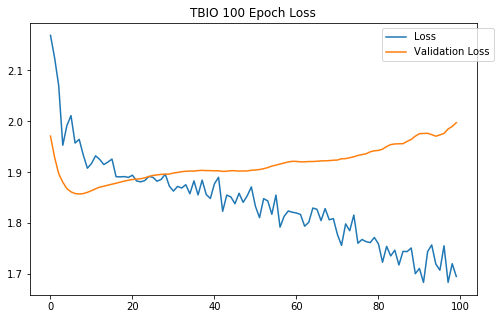

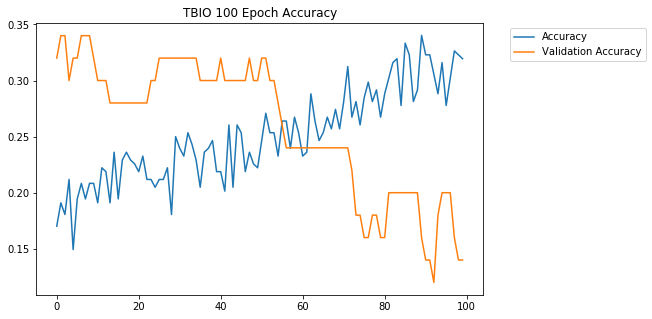

Train on 949 samples, validate on 50 samples
Epoch 1/100
949/949 [==============================] - 0s 223us/step - loss: 2.0181 - acc: 0.1907 - val_loss: 1.7728 - val_acc: 0.2600
Epoch 2/100
949/949 [==============================] - 0s 214us/step - loss: 1.9325 - acc: 0.2403 - val_loss: 1.7276 - val_acc: 0.3000
Epoch 3/100
949/949 [==============================] - 0s 219us/step - loss: 1.8943 - acc: 0.2413 - val_loss: 1.7275 - val_acc: 0.3000
Epoch 4/100
949/949 [==============================] - 0s 231us/step - loss: 1.8796 - acc: 0.2350 - val_loss: 1.7292 - val_acc: 0.3000
Epoch 5/100
949/949 [==============================] - 0s 251us/step - loss: 1.8615 - acc: 0.2381 - val_loss: 1.7300 - val_acc: 0.3000
Epoch 6/100
949/949 [==============================] - 0s 236us/step - loss: 1.8621 - acc: 0.2550 - val_loss: 1.7301 - val_acc: 0.3000
Epoch 7/100
949/949 [==============================] - 0s 266us/step - loss: 1.8639 - acc: 0.2540 - val_loss: 1.7312 - val_acc: 0.3000
Epoch 8/10

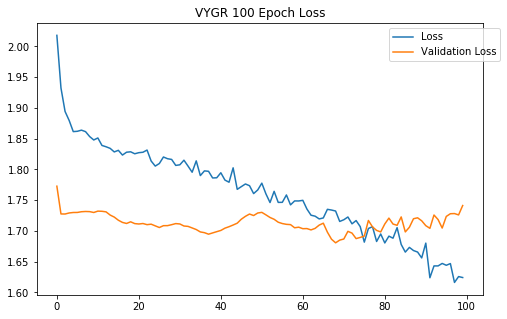

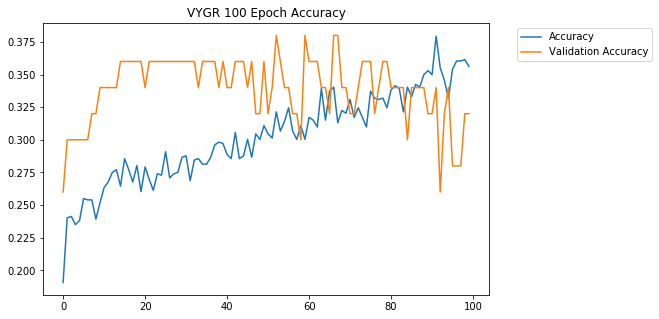

Train on 4873 samples, validate on 50 samples
Epoch 1/100
4873/4873 [==============================] - 1s 214us/step - loss: 1.8995 - acc: 0.2614 - val_loss: 1.8168 - val_acc: 0.3600
Epoch 2/100
4873/4873 [==============================] - 1s 220us/step - loss: 1.8411 - acc: 0.2633 - val_loss: 1.8136 - val_acc: 0.3400
Epoch 3/100
4873/4873 [==============================] - 1s 201us/step - loss: 1.8307 - acc: 0.2674 - val_loss: 1.8124 - val_acc: 0.3200
Epoch 4/100
4873/4873 [==============================] - 1s 203us/step - loss: 1.8270 - acc: 0.2713 - val_loss: 1.8097 - val_acc: 0.3400
Epoch 5/100
4873/4873 [==============================] - 1s 199us/step - loss: 1.8252 - acc: 0.2672 - val_loss: 1.8105 - val_acc: 0.3400
Epoch 6/100
4873/4873 [==============================] - 1s 204us/step - loss: 1.8178 - acc: 0.2791 - val_loss: 1.8093 - val_acc: 0.3200
Epoch 7/100
4873/4873 [==============================] - 1s 226us/step - loss: 1.8161 - acc: 0.2742 - val_loss: 1.8060 - val_acc: 0.

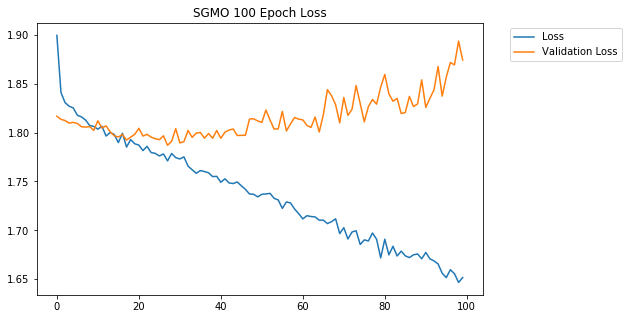

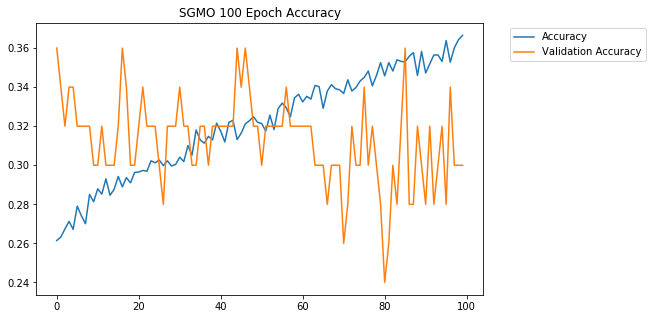

Train on 427 samples, validate on 50 samples
Epoch 1/100
427/427 [==============================] - 0s 453us/step - loss: 2.0007 - acc: 0.1967 - val_loss: 1.8764 - val_acc: 0.1800
Epoch 2/100
427/427 [==============================] - 0s 265us/step - loss: 1.8764 - acc: 0.2389 - val_loss: 1.8656 - val_acc: 0.2000
Epoch 3/100
427/427 [==============================] - 0s 252us/step - loss: 1.8784 - acc: 0.2576 - val_loss: 1.8567 - val_acc: 0.2000
Epoch 4/100
427/427 [==============================] - 0s 266us/step - loss: 1.8476 - acc: 0.2646 - val_loss: 1.8533 - val_acc: 0.2000
Epoch 5/100
427/427 [==============================] - 0s 319us/step - loss: 1.8084 - acc: 0.2670 - val_loss: 1.8487 - val_acc: 0.2000
Epoch 6/100
427/427 [==============================] - 0s 269us/step - loss: 1.8262 - acc: 0.2787 - val_loss: 1.8468 - val_acc: 0.2000
Epoch 7/100
427/427 [==============================] - 0s 261us/step - loss: 1.8274 - acc: 0.2412 - val_loss: 1.8465 - val_acc: 0.1800
Epoch 8/10

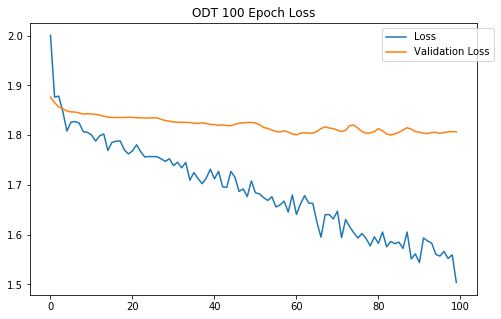

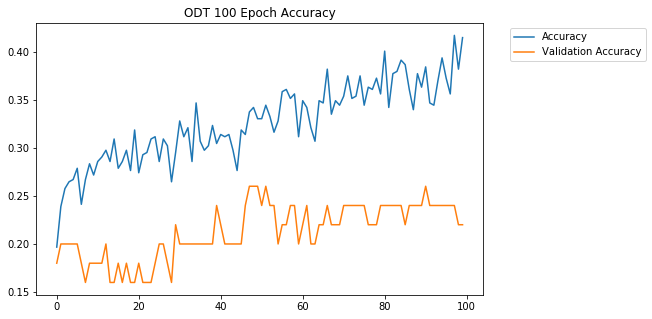

Train on 646 samples, validate on 50 samples
Epoch 1/100
646/646 [==============================] - 0s 418us/step - loss: 2.1599 - acc: 0.2260 - val_loss: 2.1062 - val_acc: 0.2000
Epoch 2/100
646/646 [==============================] - 0s 273us/step - loss: 1.9550 - acc: 0.2554 - val_loss: 2.0280 - val_acc: 0.2000
Epoch 3/100
646/646 [==============================] - 0s 264us/step - loss: 1.8953 - acc: 0.2848 - val_loss: 1.9739 - val_acc: 0.2000
Epoch 4/100
646/646 [==============================] - 0s 263us/step - loss: 1.8467 - acc: 0.2693 - val_loss: 1.9465 - val_acc: 0.2000
Epoch 5/100
646/646 [==============================] - 0s 249us/step - loss: 1.8230 - acc: 0.2941 - val_loss: 1.9352 - val_acc: 0.2000
Epoch 6/100
646/646 [==============================] - 0s 233us/step - loss: 1.8193 - acc: 0.2724 - val_loss: 1.9323 - val_acc: 0.2000
Epoch 7/100
646/646 [==============================] - 0s 236us/step - loss: 1.8157 - acc: 0.2817 - val_loss: 1.9310 - val_acc: 0.2000
Epoch 8/10

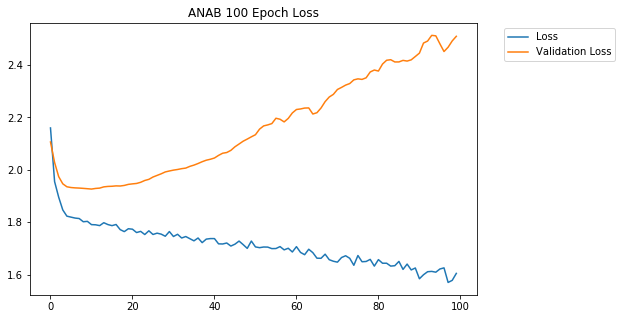

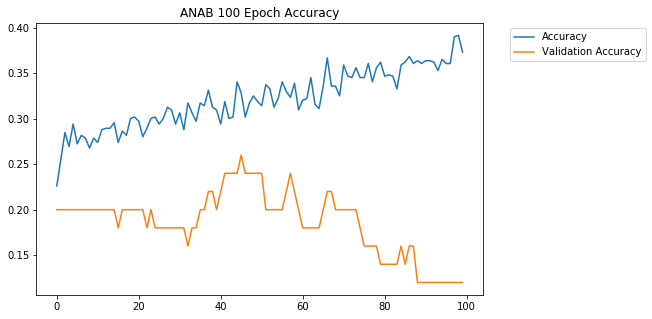

Train on 1219 samples, validate on 50 samples
Epoch 1/100
1219/1219 [==============================] - 0s 220us/step - loss: 2.0229 - acc: 0.2395 - val_loss: 1.8053 - val_acc: 0.2800
Epoch 2/100
1219/1219 [==============================] - 0s 212us/step - loss: 1.9249 - acc: 0.2379 - val_loss: 1.7883 - val_acc: 0.2600
Epoch 3/100
1219/1219 [==============================] - 0s 217us/step - loss: 1.8810 - acc: 0.2477 - val_loss: 1.7883 - val_acc: 0.3000
Epoch 4/100
1219/1219 [==============================] - 0s 224us/step - loss: 1.8806 - acc: 0.2568 - val_loss: 1.7890 - val_acc: 0.2800
Epoch 5/100
1219/1219 [==============================] - 0s 211us/step - loss: 1.8566 - acc: 0.2600 - val_loss: 1.7929 - val_acc: 0.2800
Epoch 6/100
1219/1219 [==============================] - 0s 211us/step - loss: 1.8410 - acc: 0.2543 - val_loss: 1.7956 - val_acc: 0.2800
Epoch 7/100
1219/1219 [==============================] - 0s 223us/step - loss: 1.8393 - acc: 0.2773 - val_loss: 1.8002 - val_acc: 0.

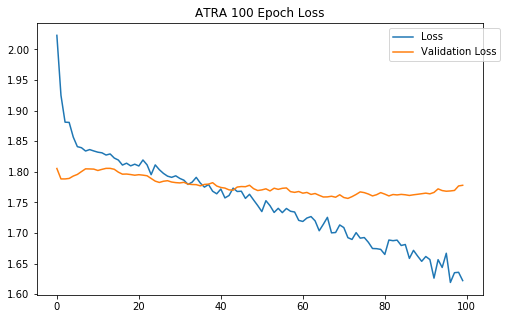

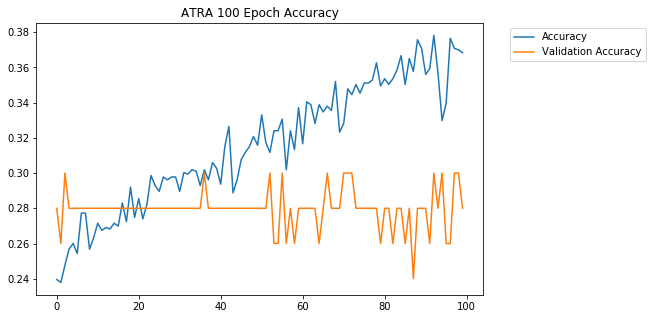

Train on 274 samples, validate on 50 samples
Epoch 1/100
274/274 [==============================] - 0s 565us/step - loss: 2.1530 - acc: 0.2445 - val_loss: 1.8573 - val_acc: 0.2200
Epoch 2/100
274/274 [==============================] - 0s 253us/step - loss: 2.1048 - acc: 0.2226 - val_loss: 1.8522 - val_acc: 0.2400
Epoch 3/100
274/274 [==============================] - 0s 241us/step - loss: 2.0235 - acc: 0.2555 - val_loss: 1.8495 - val_acc: 0.2400
Epoch 4/100
274/274 [==============================] - 0s 247us/step - loss: 2.0323 - acc: 0.2299 - val_loss: 1.8491 - val_acc: 0.2600
Epoch 5/100
274/274 [==============================] - 0s 251us/step - loss: 1.9475 - acc: 0.2518 - val_loss: 1.8537 - val_acc: 0.2600
Epoch 6/100
274/274 [==============================] - 0s 241us/step - loss: 1.8924 - acc: 0.2555 - val_loss: 1.8584 - val_acc: 0.2600
Epoch 7/100
274/274 [==============================] - 0s 237us/step - loss: 1.8687 - acc: 0.2810 - val_loss: 1.8619 - val_acc: 0.2400
Epoch 8/10

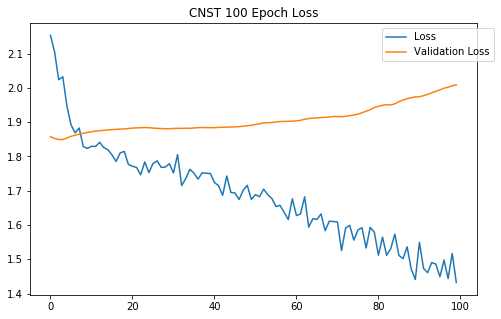

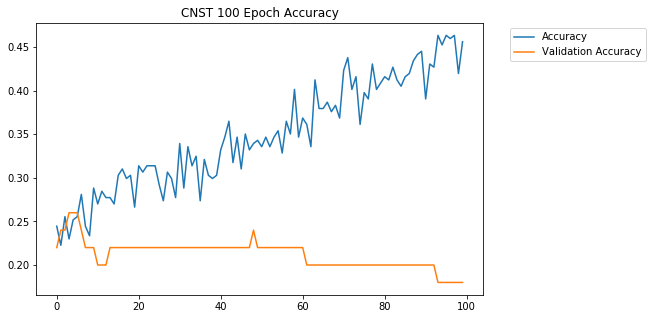

Train on 4939 samples, validate on 50 samples
Epoch 1/100
4939/4939 [==============================] - 1s 213us/step - loss: 1.9178 - acc: 0.2330 - val_loss: 1.7200 - val_acc: 0.2600
Epoch 2/100
4939/4939 [==============================] - 1s 216us/step - loss: 1.8324 - acc: 0.2488 - val_loss: 1.6929 - val_acc: 0.3000
Epoch 3/100
4939/4939 [==============================] - 1s 212us/step - loss: 1.8282 - acc: 0.2567 - val_loss: 1.6945 - val_acc: 0.2400
Epoch 4/100
4939/4939 [==============================] - 1s 208us/step - loss: 1.8184 - acc: 0.2638 - val_loss: 1.6973 - val_acc: 0.3000
Epoch 5/100
4939/4939 [==============================] - 1s 208us/step - loss: 1.8151 - acc: 0.2470 - val_loss: 1.6930 - val_acc: 0.3000
Epoch 6/100
4939/4939 [==============================] - 1s 205us/step - loss: 1.8087 - acc: 0.2648 - val_loss: 1.6781 - val_acc: 0.3800
Epoch 7/100
4939/4939 [==============================] - 1s 208us/step - loss: 1.8027 - acc: 0.2555 - val_loss: 1.6720 - val_acc: 0.

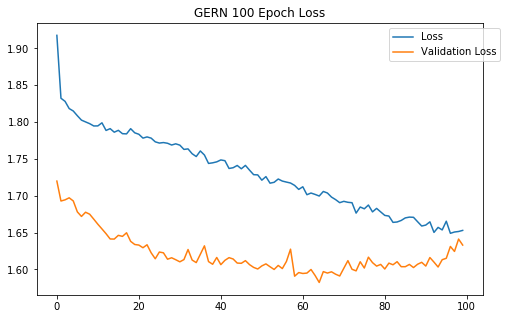

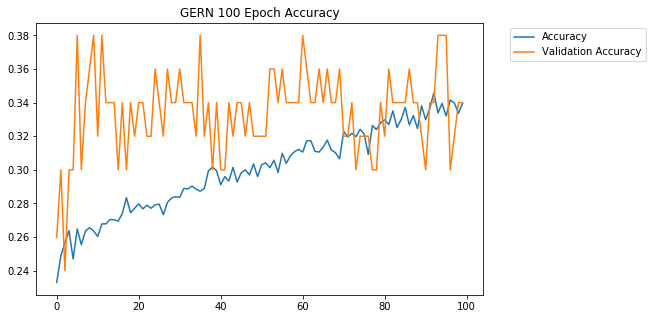

Train on 1085 samples, validate on 50 samples
Epoch 1/100
1085/1085 [==============================] - 0s 264us/step - loss: 1.9432 - acc: 0.2276 - val_loss: 1.9173 - val_acc: 0.1400
Epoch 2/100
1085/1085 [==============================] - 0s 226us/step - loss: 1.8874 - acc: 0.2396 - val_loss: 1.8739 - val_acc: 0.1800
Epoch 3/100
1085/1085 [==============================] - 0s 207us/step - loss: 1.8472 - acc: 0.2599 - val_loss: 1.8724 - val_acc: 0.1800
Epoch 4/100
1085/1085 [==============================] - 0s 198us/step - loss: 1.8235 - acc: 0.2673 - val_loss: 1.8573 - val_acc: 0.2200
Epoch 5/100
1085/1085 [==============================] - 0s 212us/step - loss: 1.8255 - acc: 0.2507 - val_loss: 1.8449 - val_acc: 0.2600
Epoch 6/100
1085/1085 [==============================] - 0s 220us/step - loss: 1.8283 - acc: 0.2571 - val_loss: 1.8411 - val_acc: 0.2400
Epoch 7/100
1085/1085 [==============================] - 0s 211us/step - loss: 1.8198 - acc: 0.2553 - val_loss: 1.8430 - val_acc: 0.

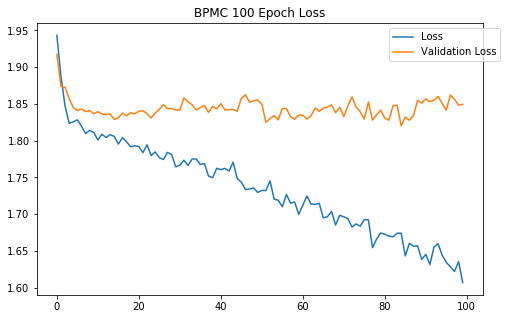

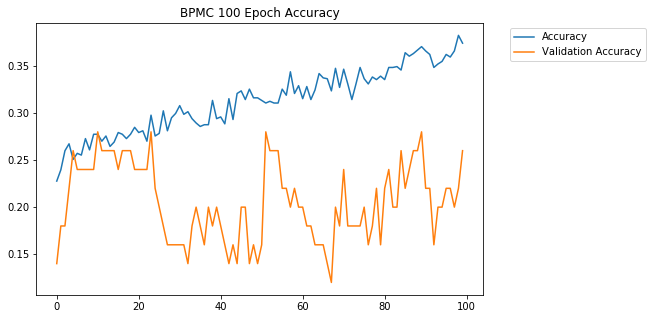

Train on 215 samples, validate on 50 samples
Epoch 1/100
215/215 [==============================] - 0s 309us/step - loss: 1.8878 - acc: 0.2837 - val_loss: 1.9187 - val_acc: 0.2400
Epoch 2/100
215/215 [==============================] - 0s 307us/step - loss: 1.9180 - acc: 0.2326 - val_loss: 1.8949 - val_acc: 0.2400
Epoch 3/100
215/215 [==============================] - 0s 322us/step - loss: 1.8808 - acc: 0.2512 - val_loss: 1.8591 - val_acc: 0.2400
Epoch 4/100
215/215 [==============================] - 0s 346us/step - loss: 1.8302 - acc: 0.2465 - val_loss: 1.8295 - val_acc: 0.2600
Epoch 5/100
215/215 [==============================] - 0s 309us/step - loss: 1.8054 - acc: 0.3070 - val_loss: 1.8124 - val_acc: 0.2600
Epoch 6/100
215/215 [==============================] - 0s 309us/step - loss: 1.8032 - acc: 0.2977 - val_loss: 1.8047 - val_acc: 0.2800
Epoch 7/100
215/215 [==============================] - 0s 295us/step - loss: 1.7710 - acc: 0.2837 - val_loss: 1.8057 - val_acc: 0.2400
Epoch 8/10

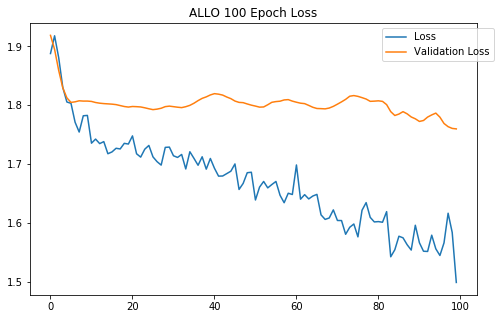

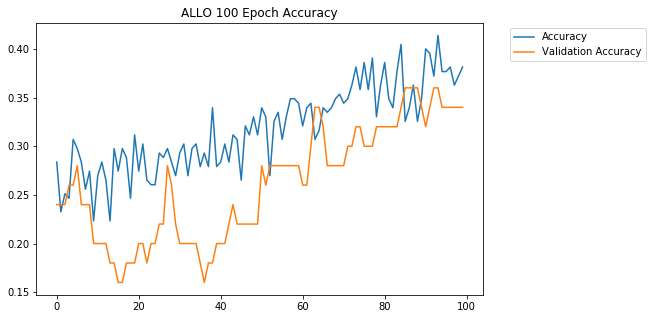

Train on 38 samples, validate on 50 samples
Epoch 1/100
38/38 [==============================] - 0s 888us/step - loss: 2.4587 - acc: 0.1842 - val_loss: 2.0746 - val_acc: 0.3400
Epoch 2/100
38/38 [==============================] - 0s 832us/step - loss: 2.2867 - acc: 0.2105 - val_loss: 2.0593 - val_acc: 0.3400
Epoch 3/100
38/38 [==============================] - 0s 754us/step - loss: 2.4804 - acc: 0.1316 - val_loss: 2.0422 - val_acc: 0.3400
Epoch 4/100
38/38 [==============================] - 0s 727us/step - loss: 2.3002 - acc: 0.2105 - val_loss: 2.0238 - val_acc: 0.3400
Epoch 5/100
38/38 [==============================] - 0s 697us/step - loss: 2.1894 - acc: 0.2632 - val_loss: 2.0045 - val_acc: 0.3400
Epoch 6/100
38/38 [==============================] - 0s 779us/step - loss: 2.2610 - acc: 0.2632 - val_loss: 1.9858 - val_acc: 0.3400
Epoch 7/100
38/38 [==============================] - 0s 790us/step - loss: 2.1305 - acc: 0.2368 - val_loss: 1.9680 - val_acc: 0.3200
Epoch 8/100
38/38 [======

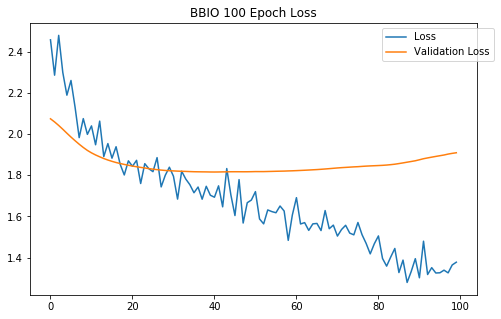

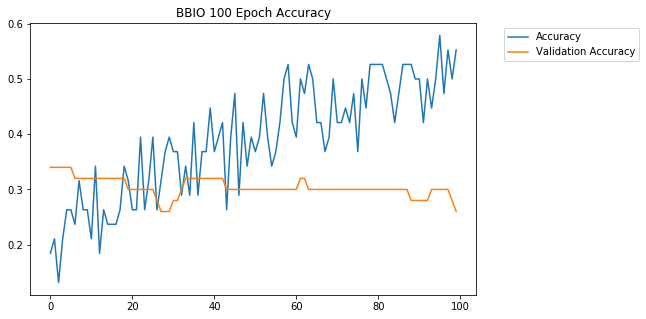

Train on 1198 samples, validate on 50 samples
Epoch 1/100
1198/1198 [==============================] - 0s 227us/step - loss: 1.9795 - acc: 0.2730 - val_loss: 1.9435 - val_acc: 0.1400
Epoch 2/100
1198/1198 [==============================] - 0s 251us/step - loss: 1.8577 - acc: 0.2780 - val_loss: 1.8143 - val_acc: 0.2000
Epoch 3/100
1198/1198 [==============================] - 0s 251us/step - loss: 1.8078 - acc: 0.2796 - val_loss: 1.7599 - val_acc: 0.2200
Epoch 4/100
1198/1198 [==============================] - 0s 211us/step - loss: 1.7884 - acc: 0.2896 - val_loss: 1.7345 - val_acc: 0.2800
Epoch 5/100
1198/1198 [==============================] - 0s 209us/step - loss: 1.7698 - acc: 0.2838 - val_loss: 1.7182 - val_acc: 0.3000
Epoch 6/100
1198/1198 [==============================] - 0s 214us/step - loss: 1.7568 - acc: 0.2997 - val_loss: 1.7062 - val_acc: 0.3400
Epoch 7/100
1198/1198 [==============================] - 0s 206us/step - loss: 1.7570 - acc: 0.2896 - val_loss: 1.6987 - val_acc: 0.

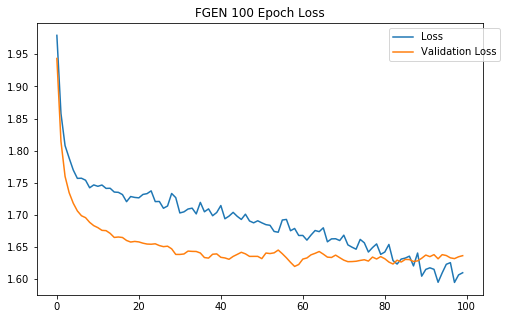

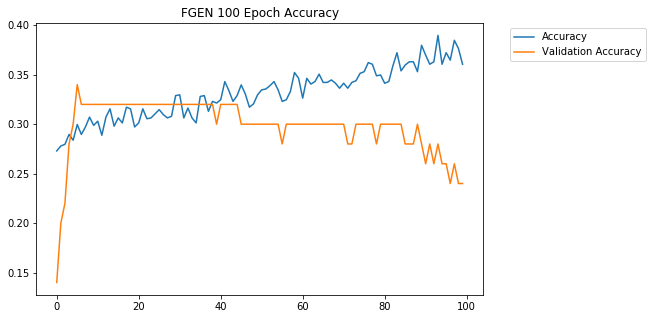

Train on 4939 samples, validate on 50 samples
Epoch 1/100
4939/4939 [==============================] - 1s 204us/step - loss: 1.8692 - acc: 0.2699 - val_loss: 1.8379 - val_acc: 0.2200
Epoch 2/100
4939/4939 [==============================] - 1s 201us/step - loss: 1.7987 - acc: 0.2760 - val_loss: 1.8408 - val_acc: 0.2200
Epoch 3/100
4939/4939 [==============================] - 1s 213us/step - loss: 1.7875 - acc: 0.2855 - val_loss: 1.8144 - val_acc: 0.2200
Epoch 4/100
4939/4939 [==============================] - 1s 204us/step - loss: 1.7820 - acc: 0.2857 - val_loss: 1.8472 - val_acc: 0.2000
Epoch 5/100
4939/4939 [==============================] - 1s 198us/step - loss: 1.7797 - acc: 0.2883 - val_loss: 1.8610 - val_acc: 0.2000
Epoch 6/100
4939/4939 [==============================] - 1s 205us/step - loss: 1.7737 - acc: 0.2871 - val_loss: 1.8572 - val_acc: 0.2200
Epoch 7/100
4939/4939 [==============================] - 1s 202us/step - loss: 1.7724 - acc: 0.2867 - val_loss: 1.8346 - val_acc: 0.

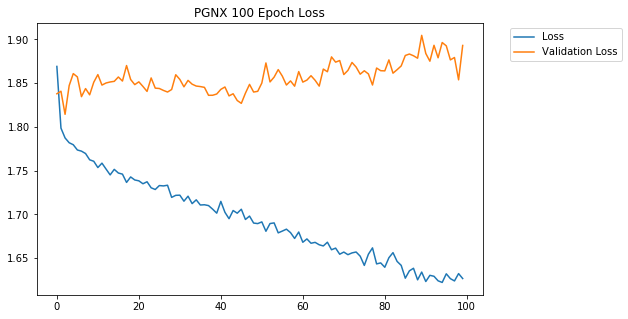

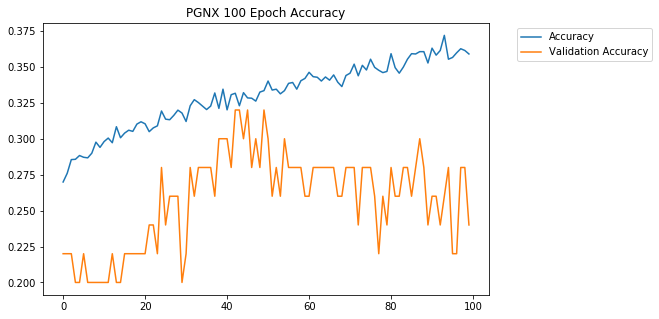

Train on 302 samples, validate on 50 samples
Epoch 1/100
302/302 [==============================] - 0s 290us/step - loss: 2.0293 - acc: 0.1954 - val_loss: 1.7198 - val_acc: 0.2400
Epoch 2/100
302/302 [==============================] - 0s 263us/step - loss: 1.9591 - acc: 0.2185 - val_loss: 1.7225 - val_acc: 0.2400
Epoch 3/100
302/302 [==============================] - 0s 320us/step - loss: 1.9127 - acc: 0.2583 - val_loss: 1.7321 - val_acc: 0.2200
Epoch 4/100
302/302 [==============================] - 0s 288us/step - loss: 1.8767 - acc: 0.2550 - val_loss: 1.7361 - val_acc: 0.2200
Epoch 5/100
302/302 [==============================] - 0s 282us/step - loss: 1.8583 - acc: 0.2318 - val_loss: 1.7420 - val_acc: 0.2200
Epoch 6/100
302/302 [==============================] - 0s 321us/step - loss: 1.8603 - acc: 0.2550 - val_loss: 1.7476 - val_acc: 0.2200
Epoch 7/100
302/302 [==============================] - 0s 293us/step - loss: 1.8000 - acc: 0.2550 - val_loss: 1.7576 - val_acc: 0.2200
Epoch 8/10

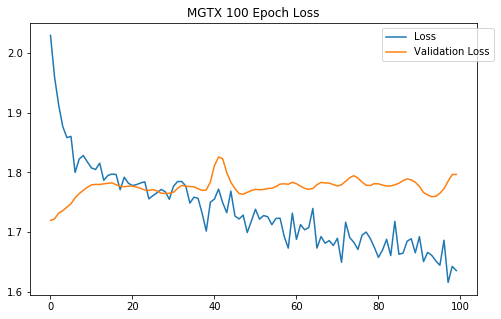

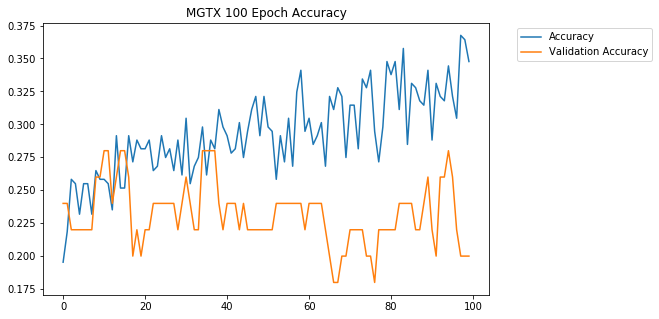

Train on 72 samples, validate on 50 samples
Epoch 1/100
72/72 [==============================] - 0s 442us/step - loss: 1.9219 - acc: 0.2917 - val_loss: 1.9165 - val_acc: 0.3000
Epoch 2/100
72/72 [==============================] - 0s 429us/step - loss: 1.9800 - acc: 0.2778 - val_loss: 1.9163 - val_acc: 0.3000
Epoch 3/100
72/72 [==============================] - 0s 434us/step - loss: 1.9230 - acc: 0.2639 - val_loss: 1.9157 - val_acc: 0.3000
Epoch 4/100
72/72 [==============================] - 0s 372us/step - loss: 1.8650 - acc: 0.3194 - val_loss: 1.9150 - val_acc: 0.3200
Epoch 5/100
72/72 [==============================] - 0s 369us/step - loss: 1.8840 - acc: 0.3194 - val_loss: 1.9141 - val_acc: 0.3200
Epoch 6/100
72/72 [==============================] - 0s 434us/step - loss: 1.9633 - acc: 0.2639 - val_loss: 1.9130 - val_acc: 0.3200
Epoch 7/100
72/72 [==============================] - 0s 442us/step - loss: 1.8815 - acc: 0.3056 - val_loss: 1.9120 - val_acc: 0.3200
Epoch 8/100
72/72 [======

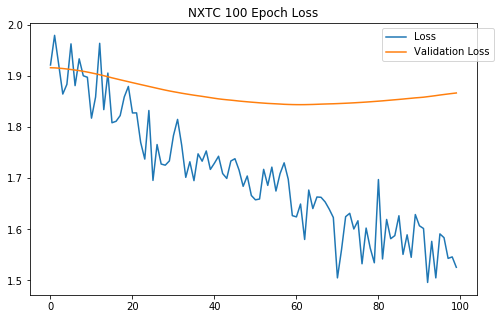

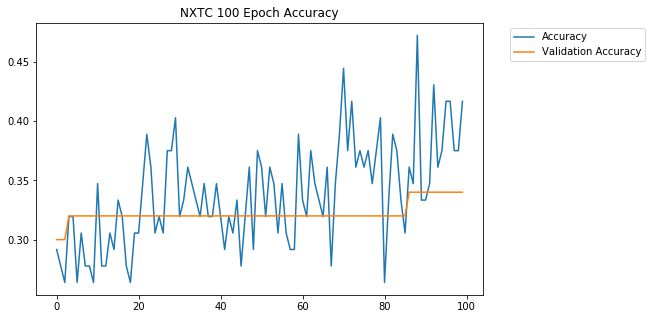

Train on 4939 samples, validate on 50 samples
Epoch 1/100
4939/4939 [==============================] - 1s 203us/step - loss: 1.8842 - acc: 0.2549 - val_loss: 1.6613 - val_acc: 0.3600
Epoch 2/100
4939/4939 [==============================] - 1s 198us/step - loss: 1.8316 - acc: 0.2673 - val_loss: 1.6701 - val_acc: 0.3400
Epoch 3/100
4939/4939 [==============================] - 1s 205us/step - loss: 1.8160 - acc: 0.2705 - val_loss: 1.6783 - val_acc: 0.3400
Epoch 4/100
4939/4939 [==============================] - 1s 206us/step - loss: 1.8149 - acc: 0.2727 - val_loss: 1.6923 - val_acc: 0.3200
Epoch 5/100
4939/4939 [==============================] - 1s 218us/step - loss: 1.8119 - acc: 0.2695 - val_loss: 1.6892 - val_acc: 0.3400
Epoch 6/100
4939/4939 [==============================] - 1s 203us/step - loss: 1.8022 - acc: 0.2774 - val_loss: 1.6870 - val_acc: 0.3400
Epoch 7/100
4939/4939 [==============================] - 1s 202us/step - loss: 1.7966 - acc: 0.2762 - val_loss: 1.6903 - val_acc: 0.

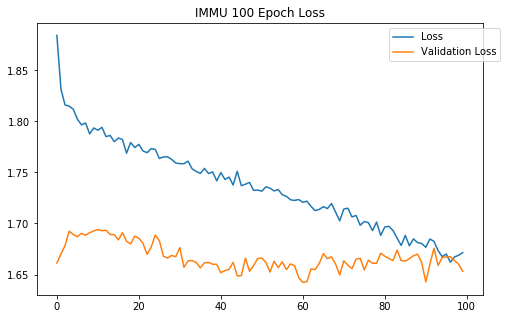

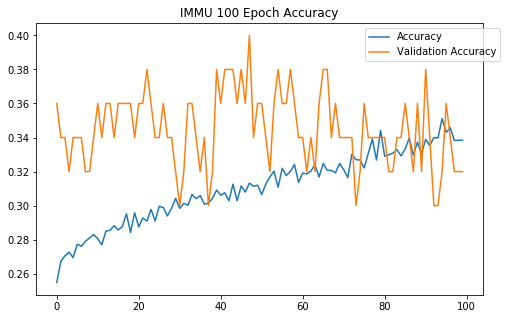

Train on 3521 samples, validate on 50 samples
Epoch 1/100
3521/3521 [==============================] - 1s 241us/step - loss: 1.8578 - acc: 0.2681 - val_loss: 1.7652 - val_acc: 0.2400
Epoch 2/100
3521/3521 [==============================] - 1s 207us/step - loss: 1.8180 - acc: 0.2735 - val_loss: 1.7795 - val_acc: 0.3200
Epoch 3/100
3521/3521 [==============================] - 1s 208us/step - loss: 1.8024 - acc: 0.2815 - val_loss: 1.7676 - val_acc: 0.3000
Epoch 4/100
3521/3521 [==============================] - 1s 213us/step - loss: 1.7952 - acc: 0.2815 - val_loss: 1.7773 - val_acc: 0.2800
Epoch 5/100
3521/3521 [==============================] - 1s 207us/step - loss: 1.7897 - acc: 0.2851 - val_loss: 1.7723 - val_acc: 0.2600
Epoch 6/100
3521/3521 [==============================] - 1s 205us/step - loss: 1.7902 - acc: 0.2795 - val_loss: 1.7697 - val_acc: 0.2800
Epoch 7/100
3521/3521 [==============================] - 1s 210us/step - loss: 1.7861 - acc: 0.2815 - val_loss: 1.7630 - val_acc: 0.

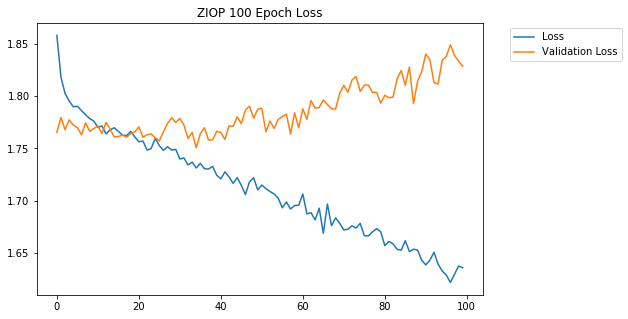

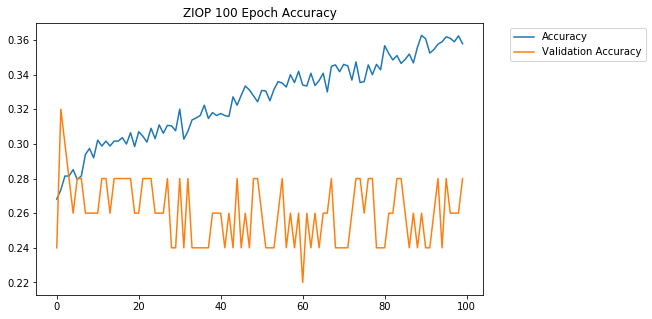

Train on 713 samples, validate on 50 samples
Epoch 1/100
713/713 [==============================] - 0s 259us/step - loss: 1.8718 - acc: 0.2749 - val_loss: 1.8425 - val_acc: 0.2000
Epoch 2/100
713/713 [==============================] - 0s 233us/step - loss: 1.8386 - acc: 0.2973 - val_loss: 1.8069 - val_acc: 0.2200
Epoch 3/100
713/713 [==============================] - 0s 242us/step - loss: 1.8272 - acc: 0.2917 - val_loss: 1.8006 - val_acc: 0.1800
Epoch 4/100
713/713 [==============================] - 0s 235us/step - loss: 1.8167 - acc: 0.3086 - val_loss: 1.8011 - val_acc: 0.2000
Epoch 5/100
713/713 [==============================] - 0s 235us/step - loss: 1.8097 - acc: 0.3086 - val_loss: 1.8067 - val_acc: 0.2200
Epoch 6/100
713/713 [==============================] - 0s 228us/step - loss: 1.8136 - acc: 0.3058 - val_loss: 1.8071 - val_acc: 0.2200
Epoch 7/100
713/713 [==============================] - 0s 247us/step - loss: 1.8000 - acc: 0.3043 - val_loss: 1.8097 - val_acc: 0.2200
Epoch 8/10

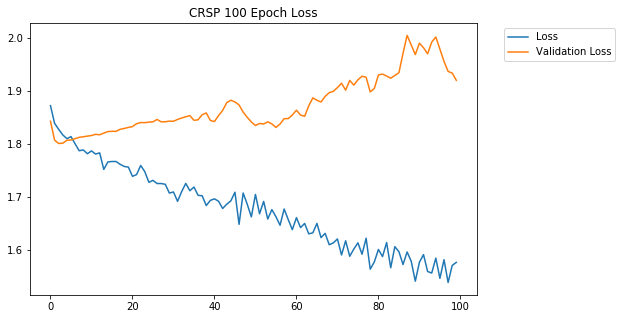

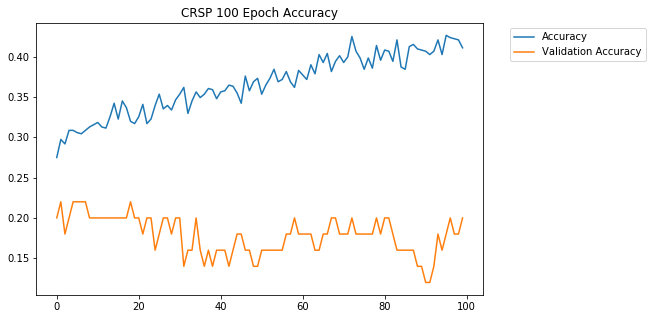

Train on 2240 samples, validate on 50 samples
Epoch 1/100
2240/2240 [==============================] - 1s 238us/step - loss: 1.8416 - acc: 0.3004 - val_loss: 1.8060 - val_acc: 0.3000
Epoch 2/100
2240/2240 [==============================] - 0s 212us/step - loss: 1.7341 - acc: 0.3531 - val_loss: 1.7756 - val_acc: 0.3200
Epoch 3/100
2240/2240 [==============================] - 0s 203us/step - loss: 1.6974 - acc: 0.3638 - val_loss: 1.7551 - val_acc: 0.3000
Epoch 4/100
2240/2240 [==============================] - 0s 212us/step - loss: 1.6843 - acc: 0.3638 - val_loss: 1.7451 - val_acc: 0.2800
Epoch 5/100
2240/2240 [==============================] - 0s 197us/step - loss: 1.6762 - acc: 0.3723 - val_loss: 1.7525 - val_acc: 0.3000
Epoch 6/100
2240/2240 [==============================] - 0s 216us/step - loss: 1.6738 - acc: 0.3732 - val_loss: 1.7524 - val_acc: 0.3400
Epoch 7/100
2240/2240 [==============================] - 0s 207us/step - loss: 1.6557 - acc: 0.3737 - val_loss: 1.7635 - val_acc: 0.

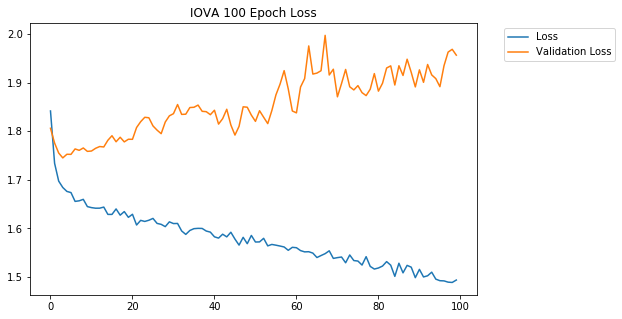

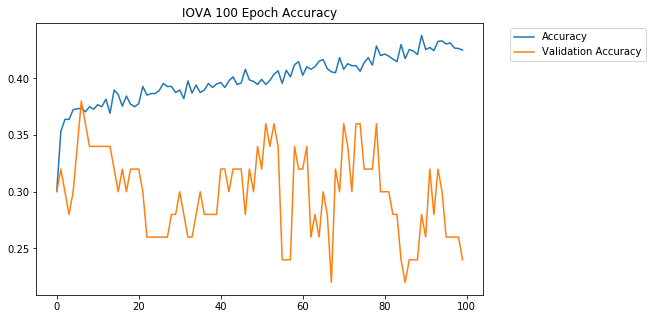

Train on 1087 samples, validate on 50 samples
Epoch 1/100
1087/1087 [==============================] - 0s 216us/step - loss: 2.0960 - acc: 0.2254 - val_loss: 1.7442 - val_acc: 0.3600
Epoch 2/100
1087/1087 [==============================] - 0s 218us/step - loss: 1.9354 - acc: 0.2318 - val_loss: 1.7601 - val_acc: 0.3400
Epoch 3/100
1087/1087 [==============================] - 0s 212us/step - loss: 1.9188 - acc: 0.2318 - val_loss: 1.7693 - val_acc: 0.3600
Epoch 4/100
1087/1087 [==============================] - 0s 226us/step - loss: 1.8699 - acc: 0.2410 - val_loss: 1.7788 - val_acc: 0.3600
Epoch 5/100
1087/1087 [==============================] - 0s 207us/step - loss: 1.8547 - acc: 0.2484 - val_loss: 1.7868 - val_acc: 0.3400
Epoch 6/100
1087/1087 [==============================] - 0s 198us/step - loss: 1.8524 - acc: 0.2530 - val_loss: 1.7906 - val_acc: 0.3400
Epoch 7/100
1087/1087 [==============================] - 0s 214us/step - loss: 1.8497 - acc: 0.2539 - val_loss: 1.7937 - val_acc: 0.

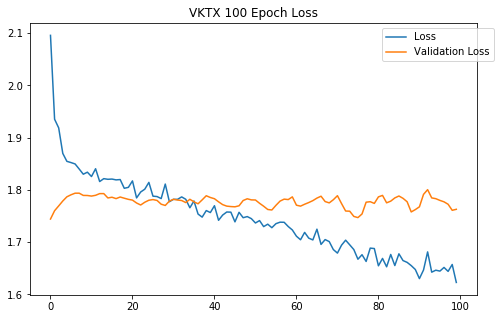

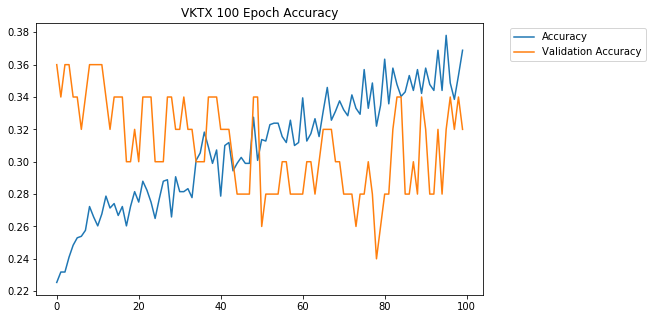

Train on 294 samples, validate on 50 samples
Epoch 1/100
294/294 [==============================] - 0s 552us/step - loss: 1.9537 - acc: 0.2381 - val_loss: 2.0614 - val_acc: 0.1600
Epoch 2/100
294/294 [==============================] - 0s 228us/step - loss: 2.0059 - acc: 0.2313 - val_loss: 1.9898 - val_acc: 0.1400
Epoch 3/100
294/294 [==============================] - 0s 240us/step - loss: 1.9498 - acc: 0.2143 - val_loss: 1.9280 - val_acc: 0.1200
Epoch 4/100
294/294 [==============================] - 0s 223us/step - loss: 1.9054 - acc: 0.2075 - val_loss: 1.8766 - val_acc: 0.1200
Epoch 5/100
294/294 [==============================] - 0s 238us/step - loss: 1.8553 - acc: 0.2721 - val_loss: 1.8395 - val_acc: 0.1800
Epoch 6/100
294/294 [==============================] - 0s 275us/step - loss: 1.8552 - acc: 0.2755 - val_loss: 1.8156 - val_acc: 0.2200
Epoch 7/100
294/294 [==============================] - 0s 221us/step - loss: 1.8609 - acc: 0.2585 - val_loss: 1.7995 - val_acc: 0.2200
Epoch 8/10

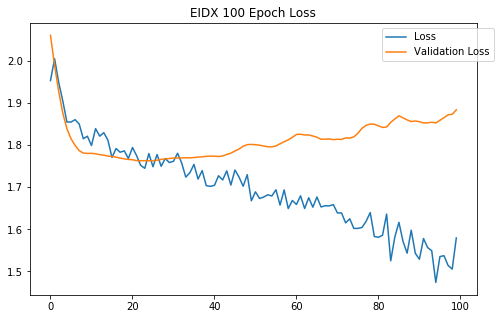

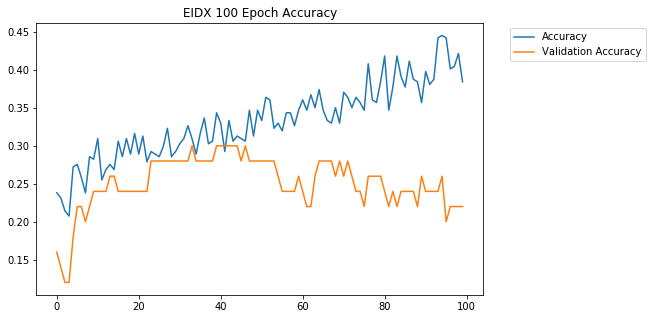

Train on 707 samples, validate on 50 samples
Epoch 1/100
707/707 [==============================] - 0s 339us/step - loss: 2.0317 - acc: 0.1825 - val_loss: 2.0998 - val_acc: 0.1600
Epoch 2/100
707/707 [==============================] - 0s 258us/step - loss: 1.9110 - acc: 0.2122 - val_loss: 2.0272 - val_acc: 0.1400
Epoch 3/100
707/707 [==============================] - 0s 268us/step - loss: 1.8814 - acc: 0.2532 - val_loss: 1.9901 - val_acc: 0.1600
Epoch 4/100
707/707 [==============================] - 0s 247us/step - loss: 1.8656 - acc: 0.2574 - val_loss: 1.9720 - val_acc: 0.1000
Epoch 5/100
707/707 [==============================] - 0s 245us/step - loss: 1.8514 - acc: 0.2518 - val_loss: 1.9593 - val_acc: 0.2000
Epoch 6/100
707/707 [==============================] - 0s 260us/step - loss: 1.8342 - acc: 0.2461 - val_loss: 1.9532 - val_acc: 0.1800
Epoch 7/100
707/707 [==============================] - 0s 256us/step - loss: 1.8177 - acc: 0.2659 - val_loss: 1.9552 - val_acc: 0.1800
Epoch 8/10

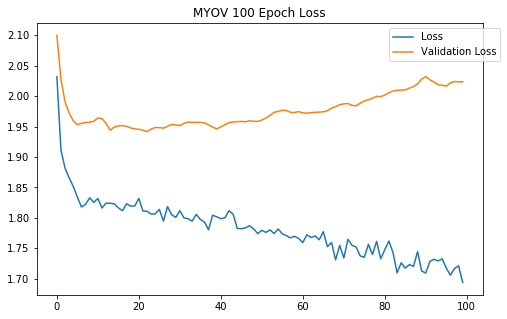

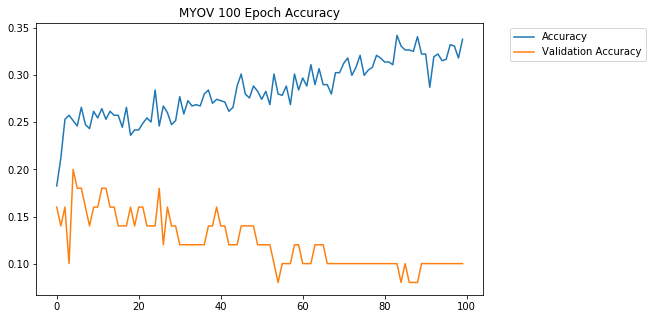

Train on 2239 samples, validate on 50 samples
Epoch 1/100
2239/2239 [==============================] - 0s 219us/step - loss: 1.9224 - acc: 0.2425 - val_loss: 1.8654 - val_acc: 0.3200
Epoch 2/100
2239/2239 [==============================] - 0s 211us/step - loss: 1.8580 - acc: 0.2336 - val_loss: 1.8569 - val_acc: 0.2400
Epoch 3/100
2239/2239 [==============================] - 0s 215us/step - loss: 1.8482 - acc: 0.2421 - val_loss: 1.8500 - val_acc: 0.2200
Epoch 4/100
2239/2239 [==============================] - 0s 221us/step - loss: 1.8432 - acc: 0.2541 - val_loss: 1.8404 - val_acc: 0.1800
Epoch 5/100
2239/2239 [==============================] - 1s 235us/step - loss: 1.8408 - acc: 0.2456 - val_loss: 1.8354 - val_acc: 0.2400
Epoch 6/100
2239/2239 [==============================] - 1s 230us/step - loss: 1.8402 - acc: 0.2537 - val_loss: 1.8332 - val_acc: 0.2600
Epoch 7/100
2239/2239 [==============================] - 0s 214us/step - loss: 1.8270 - acc: 0.2412 - val_loss: 1.8246 - val_acc: 0.

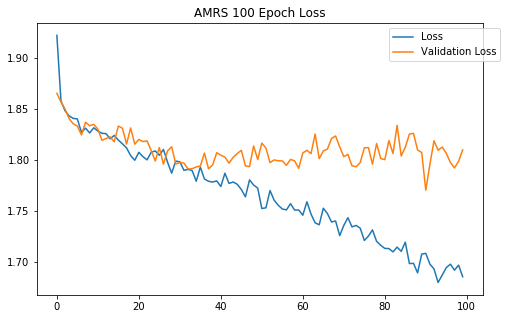

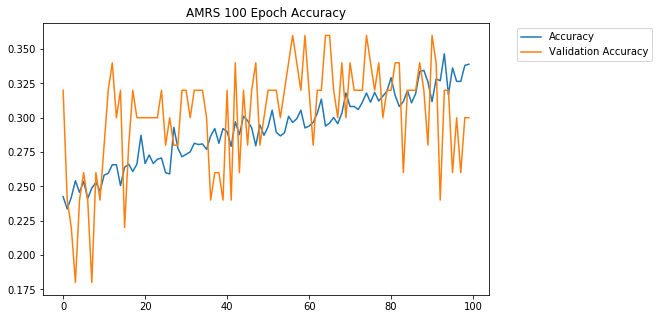

Train on 482 samples, validate on 50 samples
Epoch 1/100
482/482 [==============================] - 0s 245us/step - loss: 1.9679 - acc: 0.2593 - val_loss: 1.9510 - val_acc: 0.2800
Epoch 2/100
482/482 [==============================] - 0s 219us/step - loss: 1.9202 - acc: 0.2573 - val_loss: 1.9396 - val_acc: 0.3000
Epoch 3/100
482/482 [==============================] - 0s 218us/step - loss: 1.8398 - acc: 0.2988 - val_loss: 1.9267 - val_acc: 0.2800
Epoch 4/100
482/482 [==============================] - 0s 234us/step - loss: 1.8231 - acc: 0.2925 - val_loss: 1.9138 - val_acc: 0.2800
Epoch 5/100
482/482 [==============================] - 0s 225us/step - loss: 1.8107 - acc: 0.2863 - val_loss: 1.9017 - val_acc: 0.2800
Epoch 6/100
482/482 [==============================] - 0s 220us/step - loss: 1.8070 - acc: 0.2925 - val_loss: 1.8897 - val_acc: 0.2800
Epoch 7/100
482/482 [==============================] - 0s 233us/step - loss: 1.7878 - acc: 0.2697 - val_loss: 1.8775 - val_acc: 0.2800
Epoch 8/10

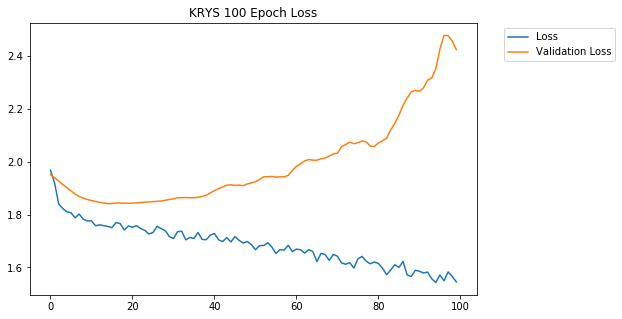

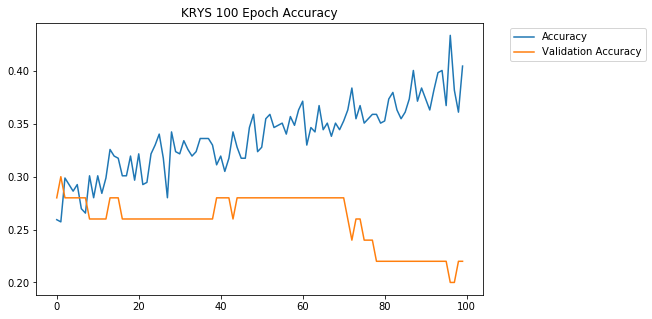

Train on 967 samples, validate on 50 samples
Epoch 1/100
967/967 [==============================] - 0s 214us/step - loss: 2.0236 - acc: 0.2389 - val_loss: 1.6293 - val_acc: 0.3000
Epoch 2/100
967/967 [==============================] - 0s 204us/step - loss: 1.9163 - acc: 0.2492 - val_loss: 1.6445 - val_acc: 0.3000
Epoch 3/100
967/967 [==============================] - 0s 210us/step - loss: 1.8651 - acc: 0.2378 - val_loss: 1.6430 - val_acc: 0.3000
Epoch 4/100
967/967 [==============================] - 0s 213us/step - loss: 1.8441 - acc: 0.2492 - val_loss: 1.6444 - val_acc: 0.3000
Epoch 5/100
967/967 [==============================] - 0s 222us/step - loss: 1.8277 - acc: 0.2606 - val_loss: 1.6495 - val_acc: 0.3000
Epoch 6/100
967/967 [==============================] - 0s 205us/step - loss: 1.8233 - acc: 0.2668 - val_loss: 1.6514 - val_acc: 0.3400
Epoch 7/100
967/967 [==============================] - 0s 217us/step - loss: 1.8178 - acc: 0.2523 - val_loss: 1.6485 - val_acc: 0.3400
Epoch 8/10

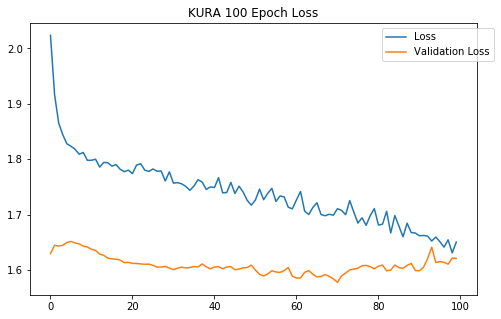

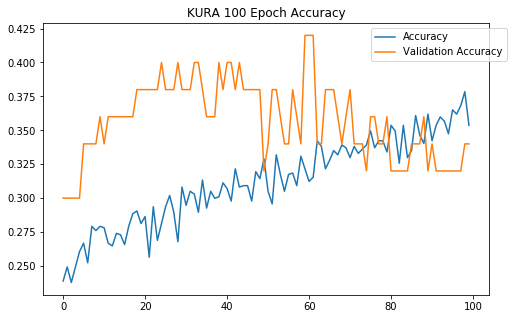

Train on 3157 samples, validate on 50 samples
Epoch 1/100
3157/3157 [==============================] - 1s 225us/step - loss: 1.9067 - acc: 0.2499 - val_loss: 1.7605 - val_acc: 0.1800
Epoch 2/100
3157/3157 [==============================] - 1s 199us/step - loss: 1.8448 - acc: 0.2594 - val_loss: 1.7486 - val_acc: 0.2400
Epoch 3/100
3157/3157 [==============================] - 1s 202us/step - loss: 1.8220 - acc: 0.2749 - val_loss: 1.7568 - val_acc: 0.2400
Epoch 4/100
3157/3157 [==============================] - 1s 199us/step - loss: 1.8139 - acc: 0.2689 - val_loss: 1.7498 - val_acc: 0.2400
Epoch 5/100
3157/3157 [==============================] - 1s 210us/step - loss: 1.8153 - acc: 0.2768 - val_loss: 1.7466 - val_acc: 0.2200
Epoch 6/100
3157/3157 [==============================] - 1s 206us/step - loss: 1.8062 - acc: 0.2829 - val_loss: 1.7508 - val_acc: 0.2200
Epoch 7/100
3157/3157 [==============================] - 1s 203us/step - loss: 1.8092 - acc: 0.2715 - val_loss: 1.7584 - val_acc: 0.

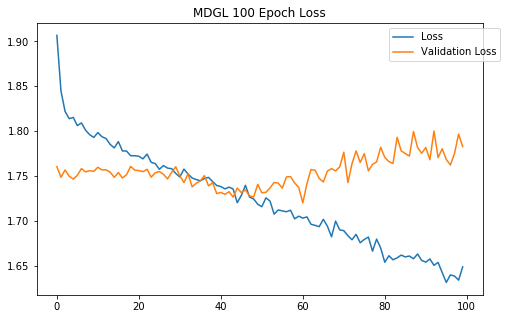

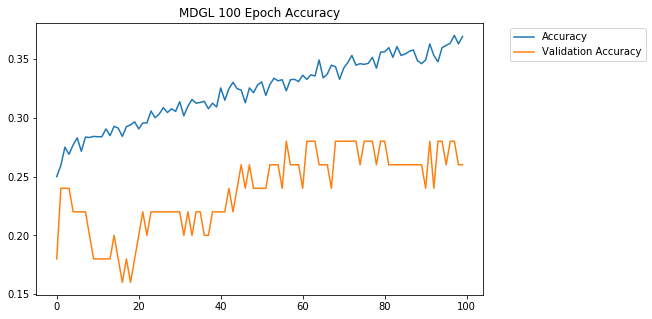

Train on 2959 samples, validate on 50 samples
Epoch 1/100
2959/2959 [==============================] - 1s 229us/step - loss: 1.2564 - acc: 0.5860 - val_loss: 2.6925 - val_acc: 0.2200
Epoch 2/100
2959/2959 [==============================] - 1s 208us/step - loss: 1.0466 - acc: 0.6185 - val_loss: 2.2023 - val_acc: 0.2000
Epoch 3/100
2959/2959 [==============================] - 1s 212us/step - loss: 0.9952 - acc: 0.6313 - val_loss: 2.1167 - val_acc: 0.2000
Epoch 4/100
2959/2959 [==============================] - 1s 204us/step - loss: 0.9846 - acc: 0.6296 - val_loss: 1.9613 - val_acc: 0.2000
Epoch 5/100
2959/2959 [==============================] - 1s 199us/step - loss: 0.9728 - acc: 0.6269 - val_loss: 1.9635 - val_acc: 0.2200
Epoch 6/100
2959/2959 [==============================] - 1s 201us/step - loss: 0.9644 - acc: 0.6316 - val_loss: 1.9355 - val_acc: 0.2200
Epoch 7/100
2959/2959 [==============================] - 1s 207us/step - loss: 0.9658 - acc: 0.6303 - val_loss: 1.9417 - val_acc: 0.

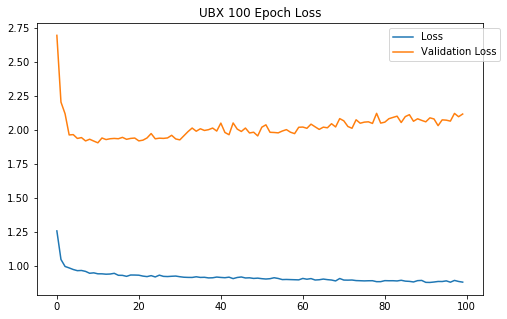

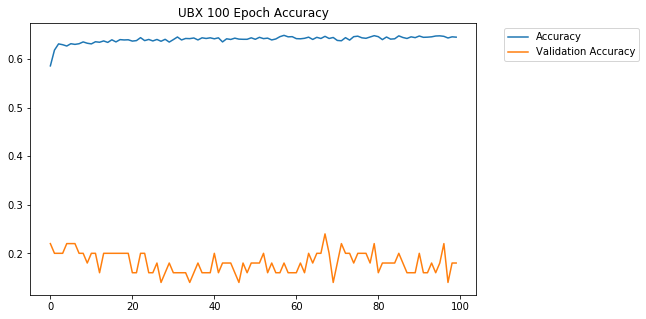

Train on 288 samples, validate on 50 samples
Epoch 1/100
288/288 [==============================] - 0s 278us/step - loss: 2.6597 - acc: 0.2431 - val_loss: 2.6115 - val_acc: 0.2200
Epoch 2/100
288/288 [==============================] - 0s 259us/step - loss: 2.1370 - acc: 0.2743 - val_loss: 1.8893 - val_acc: 0.3400
Epoch 3/100
288/288 [==============================] - 0s 264us/step - loss: 1.8725 - acc: 0.2708 - val_loss: 1.9157 - val_acc: 0.3400
Epoch 4/100
288/288 [==============================] - 0s 229us/step - loss: 1.8713 - acc: 0.2743 - val_loss: 1.8831 - val_acc: 0.3600
Epoch 5/100
288/288 [==============================] - 0s 239us/step - loss: 1.8489 - acc: 0.2708 - val_loss: 1.8530 - val_acc: 0.3600
Epoch 6/100
288/288 [==============================] - 0s 235us/step - loss: 1.8366 - acc: 0.2639 - val_loss: 1.8191 - val_acc: 0.3600
Epoch 7/100
288/288 [==============================] - 0s 225us/step - loss: 1.8655 - acc: 0.2708 - val_loss: 1.7921 - val_acc: 0.3600
Epoch 8/10

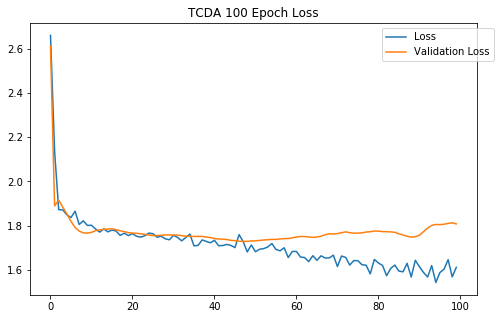

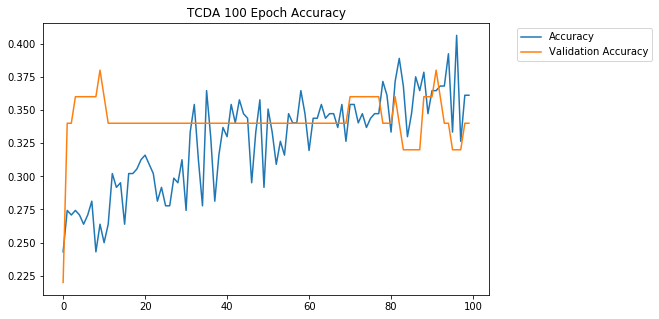

Train on 1395 samples, validate on 50 samples
Epoch 1/100
1395/1395 [==============================] - 0s 205us/step - loss: 1.9645 - acc: 0.2509 - val_loss: 2.1340 - val_acc: 0.1800
Epoch 2/100
1395/1395 [==============================] - 0s 202us/step - loss: 1.8389 - acc: 0.2781 - val_loss: 2.0364 - val_acc: 0.2000
Epoch 3/100
1395/1395 [==============================] - 0s 206us/step - loss: 1.8192 - acc: 0.2731 - val_loss: 1.9913 - val_acc: 0.1600
Epoch 4/100
1395/1395 [==============================] - 0s 234us/step - loss: 1.7998 - acc: 0.3032 - val_loss: 1.9751 - val_acc: 0.1600
Epoch 5/100
1395/1395 [==============================] - 0s 246us/step - loss: 1.8020 - acc: 0.2875 - val_loss: 1.9593 - val_acc: 0.2000
Epoch 6/100
1395/1395 [==============================] - 0s 216us/step - loss: 1.7989 - acc: 0.2746 - val_loss: 1.9462 - val_acc: 0.2000
Epoch 7/100
1395/1395 [==============================] - 0s 216us/step - loss: 1.7942 - acc: 0.2796 - val_loss: 1.9467 - val_acc: 0.

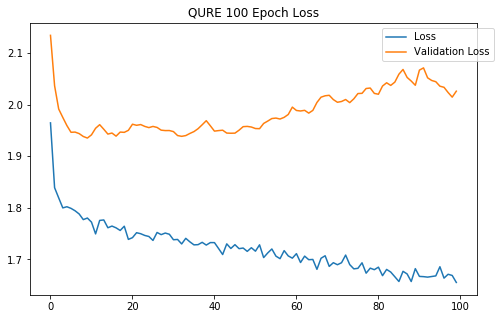

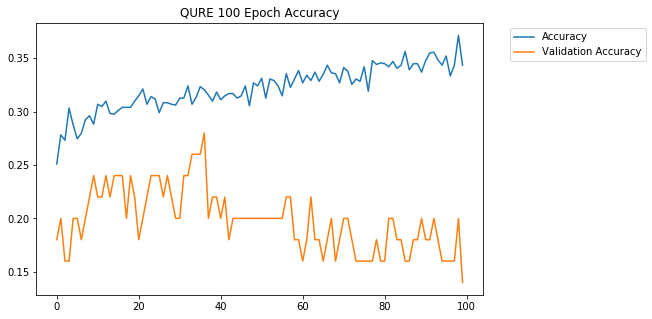

Train on 1537 samples, validate on 50 samples
Epoch 1/100
1537/1537 [==============================] - 0s 211us/step - loss: 1.8732 - acc: 0.2570 - val_loss: 1.9528 - val_acc: 0.2600
Epoch 2/100
1537/1537 [==============================] - 0s 206us/step - loss: 1.8362 - acc: 0.2609 - val_loss: 1.9180 - val_acc: 0.2600
Epoch 3/100
1537/1537 [==============================] - 0s 209us/step - loss: 1.8085 - acc: 0.2648 - val_loss: 1.9099 - val_acc: 0.2600
Epoch 4/100
1537/1537 [==============================] - 0s 206us/step - loss: 1.8013 - acc: 0.2733 - val_loss: 1.9109 - val_acc: 0.2600
Epoch 5/100
1537/1537 [==============================] - 0s 208us/step - loss: 1.7987 - acc: 0.2694 - val_loss: 1.9162 - val_acc: 0.2600
Epoch 6/100
1537/1537 [==============================] - 0s 225us/step - loss: 1.8055 - acc: 0.2720 - val_loss: 1.9109 - val_acc: 0.2600
Epoch 7/100
1537/1537 [==============================] - 0s 216us/step - loss: 1.7981 - acc: 0.2804 - val_loss: 1.9108 - val_acc: 0.

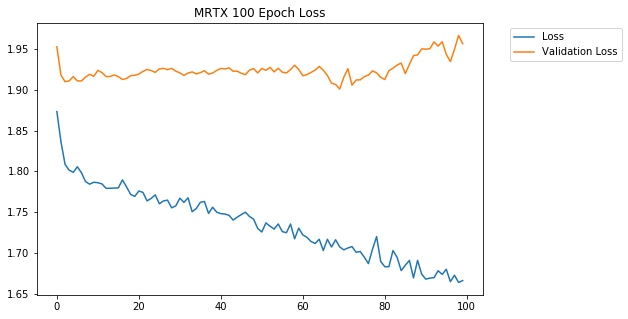

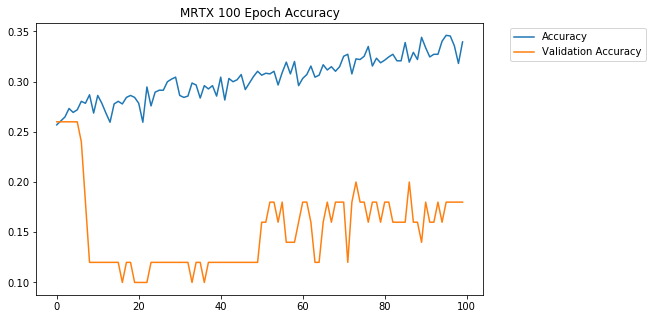

Train on 2182 samples, validate on 50 samples
Epoch 1/100
2182/2182 [==============================] - 0s 210us/step - loss: 1.9205 - acc: 0.2461 - val_loss: 1.8920 - val_acc: 0.1800
Epoch 2/100
2182/2182 [==============================] - 0s 207us/step - loss: 1.8562 - acc: 0.2589 - val_loss: 1.8944 - val_acc: 0.1800
Epoch 3/100
2182/2182 [==============================] - 0s 207us/step - loss: 1.8518 - acc: 0.2612 - val_loss: 1.8883 - val_acc: 0.1800
Epoch 4/100
2182/2182 [==============================] - 0s 220us/step - loss: 1.8351 - acc: 0.2727 - val_loss: 1.8932 - val_acc: 0.1800
Epoch 5/100
2182/2182 [==============================] - 0s 204us/step - loss: 1.8351 - acc: 0.2718 - val_loss: 1.8897 - val_acc: 0.1800
Epoch 6/100
2182/2182 [==============================] - 0s 212us/step - loss: 1.8302 - acc: 0.2782 - val_loss: 1.8937 - val_acc: 0.1800
Epoch 7/100
2182/2182 [==============================] - 0s 200us/step - loss: 1.8278 - acc: 0.2768 - val_loss: 1.8909 - val_acc: 0.

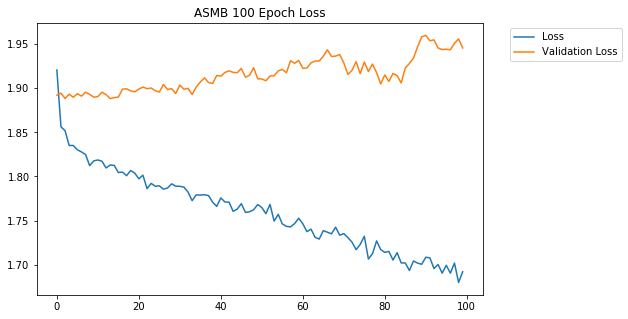

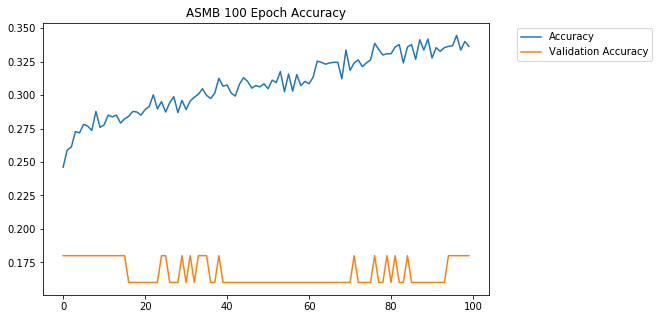

Train on 1412 samples, validate on 50 samples
Epoch 1/100
1412/1412 [==============================] - 0s 222us/step - loss: 1.8958 - acc: 0.2564 - val_loss: 1.9360 - val_acc: 0.1600
Epoch 2/100
1412/1412 [==============================] - 0s 218us/step - loss: 1.8357 - acc: 0.2649 - val_loss: 1.9125 - val_acc: 0.1800
Epoch 3/100
1412/1412 [==============================] - 0s 216us/step - loss: 1.8323 - acc: 0.2465 - val_loss: 1.9019 - val_acc: 0.1600
Epoch 4/100
1412/1412 [==============================] - 0s 226us/step - loss: 1.8153 - acc: 0.2698 - val_loss: 1.8884 - val_acc: 0.1600
Epoch 5/100
1412/1412 [==============================] - 0s 207us/step - loss: 1.8193 - acc: 0.2635 - val_loss: 1.8922 - val_acc: 0.1800
Epoch 6/100
1412/1412 [==============================] - 0s 236us/step - loss: 1.8045 - acc: 0.2627 - val_loss: 1.8967 - val_acc: 0.1800
Epoch 7/100
1412/1412 [==============================] - 0s 216us/step - loss: 1.8087 - acc: 0.2762 - val_loss: 1.8994 - val_acc: 0.

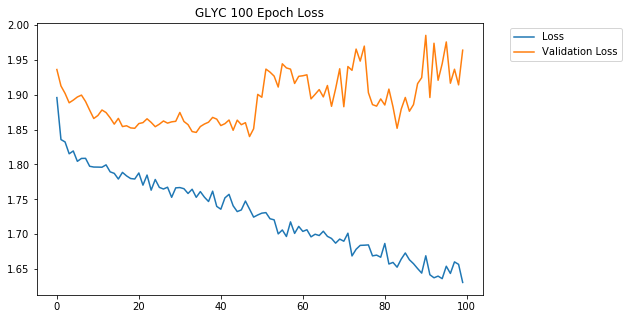

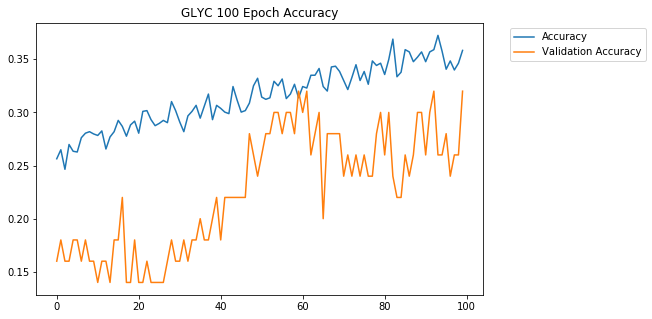

Train on 471 samples, validate on 50 samples
Epoch 1/100
471/471 [==============================] - 0s 232us/step - loss: 1.9608 - acc: 0.2335 - val_loss: 1.8290 - val_acc: 0.3200
Epoch 2/100
471/471 [==============================] - 0s 223us/step - loss: 1.9158 - acc: 0.2569 - val_loss: 1.7996 - val_acc: 0.3200
Epoch 3/100
471/471 [==============================] - 0s 245us/step - loss: 1.9260 - acc: 0.2314 - val_loss: 1.7812 - val_acc: 0.3200
Epoch 4/100
471/471 [==============================] - 0s 238us/step - loss: 1.8953 - acc: 0.2251 - val_loss: 1.7675 - val_acc: 0.3400
Epoch 5/100
471/471 [==============================] - 0s 234us/step - loss: 1.8521 - acc: 0.2548 - val_loss: 1.7596 - val_acc: 0.3600
Epoch 6/100
471/471 [==============================] - 0s 220us/step - loss: 1.8376 - acc: 0.2527 - val_loss: 1.7586 - val_acc: 0.3600
Epoch 7/100
471/471 [==============================] - 0s 225us/step - loss: 1.8522 - acc: 0.2611 - val_loss: 1.7578 - val_acc: 0.3200
Epoch 8/10

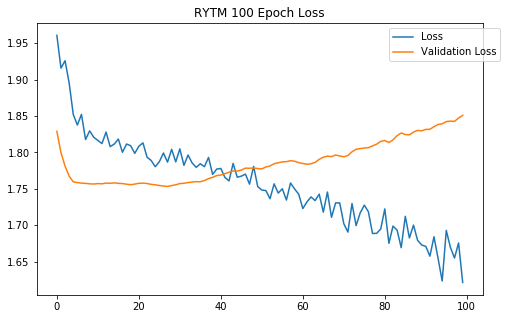

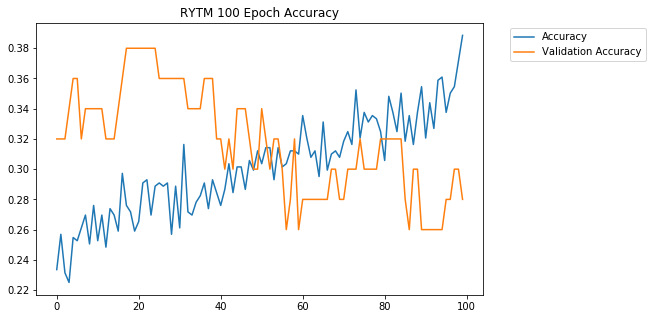

Train on 352 samples, validate on 50 samples
Epoch 1/100
352/352 [==============================] - 0s 468us/step - loss: 1.9858 - acc: 0.2188 - val_loss: 1.7933 - val_acc: 0.2800
Epoch 2/100
352/352 [==============================] - 0s 244us/step - loss: 2.0257 - acc: 0.2017 - val_loss: 1.7758 - val_acc: 0.2800
Epoch 3/100
352/352 [==============================] - 0s 238us/step - loss: 1.9009 - acc: 0.2244 - val_loss: 1.7580 - val_acc: 0.2600
Epoch 4/100
352/352 [==============================] - 0s 242us/step - loss: 1.8994 - acc: 0.2244 - val_loss: 1.7456 - val_acc: 0.2800
Epoch 5/100
352/352 [==============================] - 0s 254us/step - loss: 1.8509 - acc: 0.2813 - val_loss: 1.7395 - val_acc: 0.2800
Epoch 6/100
352/352 [==============================] - 0s 279us/step - loss: 1.8179 - acc: 0.2699 - val_loss: 1.7364 - val_acc: 0.3000
Epoch 7/100
352/352 [==============================] - 0s 253us/step - loss: 1.8286 - acc: 0.2898 - val_loss: 1.7357 - val_acc: 0.2800
Epoch 8/10

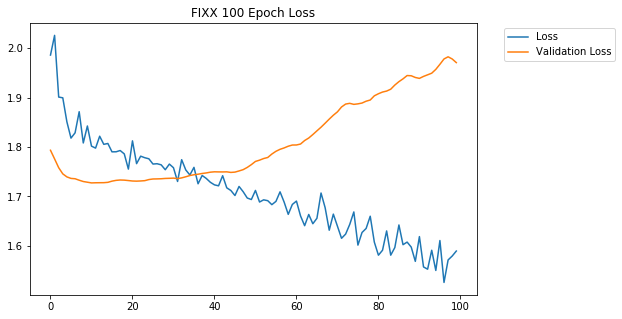

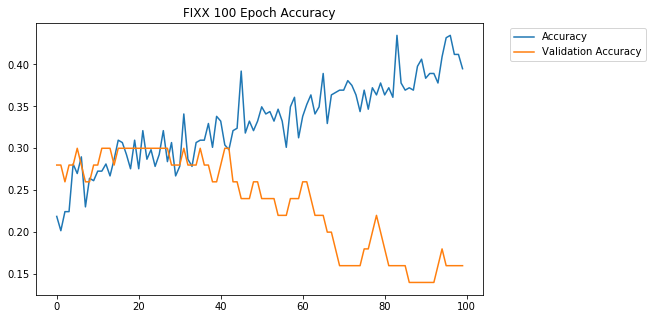

Train on 1399 samples, validate on 50 samples
Epoch 1/100
1399/1399 [==============================] - 0s 284us/step - loss: 2.0154 - acc: 0.2345 - val_loss: 1.8590 - val_acc: 0.2000
Epoch 2/100
1399/1399 [==============================] - 0s 208us/step - loss: 1.9289 - acc: 0.2202 - val_loss: 1.8716 - val_acc: 0.1400
Epoch 3/100
1399/1399 [==============================] - 0s 199us/step - loss: 1.8668 - acc: 0.2573 - val_loss: 1.8730 - val_acc: 0.1400
Epoch 4/100
1399/1399 [==============================] - 0s 204us/step - loss: 1.8401 - acc: 0.2630 - val_loss: 1.8747 - val_acc: 0.1600
Epoch 5/100
1399/1399 [==============================] - 0s 206us/step - loss: 1.8427 - acc: 0.2616 - val_loss: 1.8735 - val_acc: 0.1600
Epoch 6/100
1399/1399 [==============================] - 0s 207us/step - loss: 1.8204 - acc: 0.2738 - val_loss: 1.8769 - val_acc: 0.1400
Epoch 7/100
1399/1399 [==============================] - 0s 206us/step - loss: 1.8438 - acc: 0.2552 - val_loss: 1.8714 - val_acc: 0.

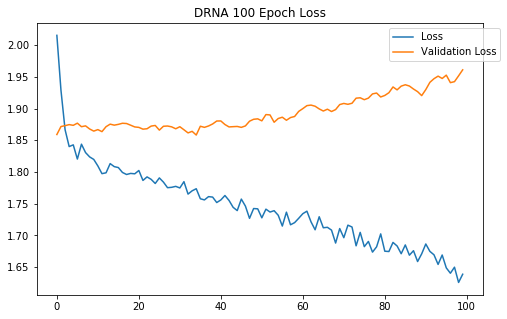

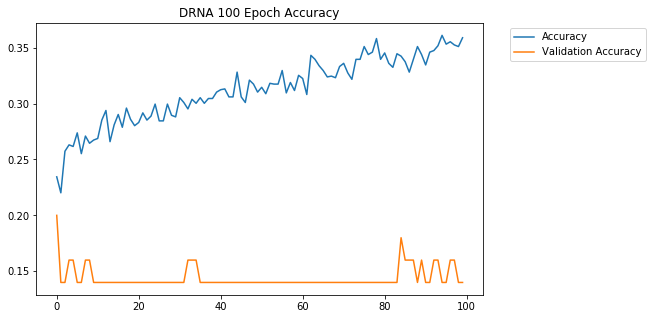

Train on 4939 samples, validate on 50 samples
Epoch 1/100
4939/4939 [==============================] - 1s 205us/step - loss: 1.8009 - acc: 0.3377 - val_loss: 1.7905 - val_acc: 0.2200
Epoch 2/100
4939/4939 [==============================] - 1s 200us/step - loss: 1.6752 - acc: 0.4005 - val_loss: 1.7928 - val_acc: 0.2400
Epoch 3/100
4939/4939 [==============================] - 1s 206us/step - loss: 1.6407 - acc: 0.4051 - val_loss: 1.7842 - val_acc: 0.2600
Epoch 4/100
4939/4939 [==============================] - 1s 196us/step - loss: 1.6088 - acc: 0.4110 - val_loss: 1.7597 - val_acc: 0.2800
Epoch 5/100
4939/4939 [==============================] - 1s 204us/step - loss: 1.5975 - acc: 0.4041 - val_loss: 1.7486 - val_acc: 0.3000
Epoch 6/100
4939/4939 [==============================] - 1s 210us/step - loss: 1.5940 - acc: 0.4102 - val_loss: 1.7522 - val_acc: 0.2800
Epoch 7/100
4939/4939 [==============================] - 1s 204us/step - loss: 1.5847 - acc: 0.4068 - val_loss: 1.7621 - val_acc: 0.

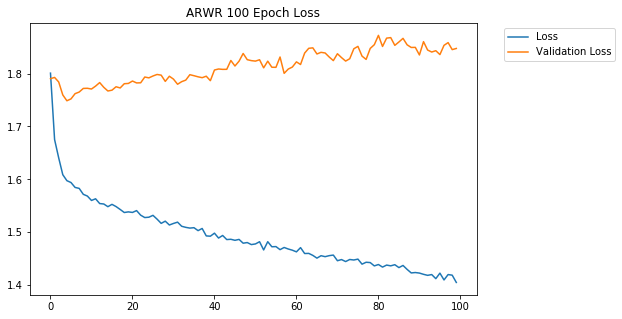

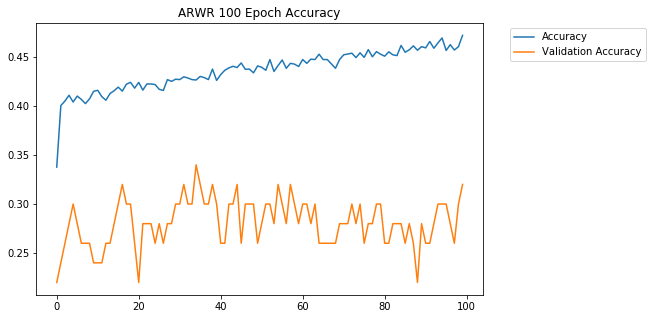

Train on 274 samples, validate on 50 samples
Epoch 1/100
274/274 [==============================] - 0s 249us/step - loss: 2.1194 - acc: 0.2518 - val_loss: 1.8377 - val_acc: 0.3000
Epoch 2/100
274/274 [==============================] - 0s 256us/step - loss: 2.0529 - acc: 0.2263 - val_loss: 1.7338 - val_acc: 0.3000
Epoch 3/100
274/274 [==============================] - 0s 257us/step - loss: 1.9955 - acc: 0.2701 - val_loss: 1.7128 - val_acc: 0.3200
Epoch 4/100
274/274 [==============================] - 0s 237us/step - loss: 1.9394 - acc: 0.2555 - val_loss: 1.6958 - val_acc: 0.3200
Epoch 5/100
274/274 [==============================] - 0s 246us/step - loss: 1.9358 - acc: 0.2518 - val_loss: 1.6875 - val_acc: 0.3400
Epoch 6/100
274/274 [==============================] - 0s 244us/step - loss: 1.8822 - acc: 0.2847 - val_loss: 1.6840 - val_acc: 0.3400
Epoch 7/100
274/274 [==============================] - 0s 275us/step - loss: 1.8646 - acc: 0.2956 - val_loss: 1.6840 - val_acc: 0.3600
Epoch 8/10

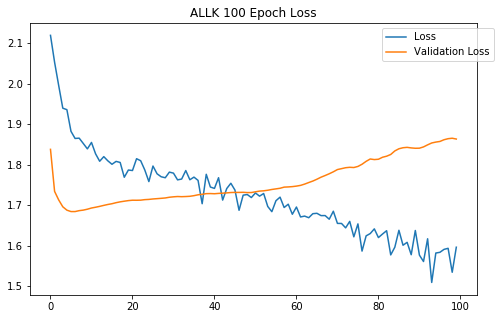

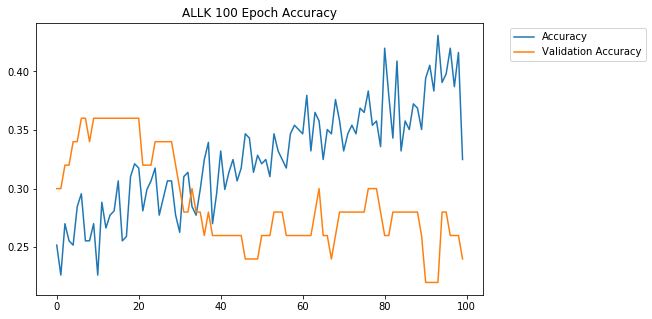

Train on 134 samples, validate on 50 samples
Epoch 1/100
134/134 [==============================] - 0s 371us/step - loss: 2.0594 - acc: 0.2164 - val_loss: 2.0759 - val_acc: 0.1400
Epoch 2/100
134/134 [==============================] - 0s 409us/step - loss: 1.9600 - acc: 0.2836 - val_loss: 2.0290 - val_acc: 0.1200
Epoch 3/100
134/134 [==============================] - 0s 413us/step - loss: 1.9867 - acc: 0.2836 - val_loss: 1.9738 - val_acc: 0.1400
Epoch 4/100
134/134 [==============================] - 0s 355us/step - loss: 1.9519 - acc: 0.2761 - val_loss: 1.9278 - val_acc: 0.1400
Epoch 5/100
134/134 [==============================] - 0s 342us/step - loss: 1.8728 - acc: 0.2836 - val_loss: 1.8959 - val_acc: 0.1600
Epoch 6/100
134/134 [==============================] - 0s 362us/step - loss: 1.8679 - acc: 0.2313 - val_loss: 1.8741 - val_acc: 0.1400
Epoch 7/100
134/134 [==============================] - 0s 356us/step - loss: 1.8575 - acc: 0.2463 - val_loss: 1.8580 - val_acc: 0.1800
Epoch 8/10

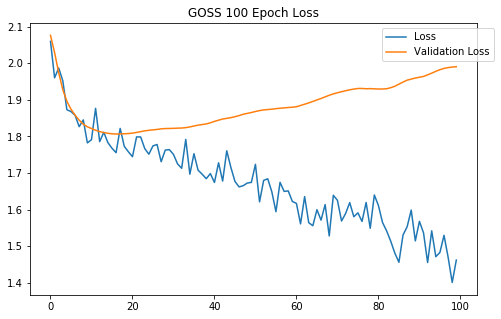

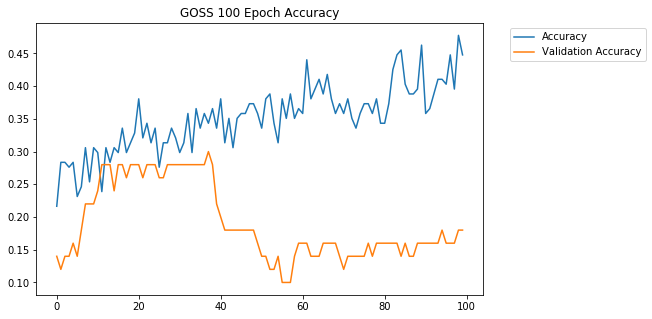

Train on 949 samples, validate on 50 samples
Epoch 1/100
949/949 [==============================] - 0s 219us/step - loss: 2.0163 - acc: 0.2255 - val_loss: 1.9540 - val_acc: 0.2200
Epoch 2/100
949/949 [==============================] - 0s 207us/step - loss: 1.9093 - acc: 0.2308 - val_loss: 1.8889 - val_acc: 0.2400
Epoch 3/100
949/949 [==============================] - 0s 218us/step - loss: 1.8553 - acc: 0.2508 - val_loss: 1.8638 - val_acc: 0.1800
Epoch 4/100
949/949 [==============================] - 0s 223us/step - loss: 1.8313 - acc: 0.2571 - val_loss: 1.8553 - val_acc: 0.1800
Epoch 5/100
949/949 [==============================] - 0s 230us/step - loss: 1.8105 - acc: 0.2740 - val_loss: 1.8563 - val_acc: 0.1800
Epoch 6/100
949/949 [==============================] - 0s 279us/step - loss: 1.8156 - acc: 0.2708 - val_loss: 1.8555 - val_acc: 0.2000
Epoch 7/100
949/949 [==============================] - 0s 265us/step - loss: 1.8191 - acc: 0.2645 - val_loss: 1.8558 - val_acc: 0.2000
Epoch 8/10

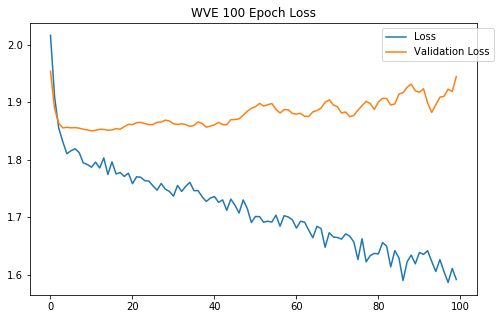

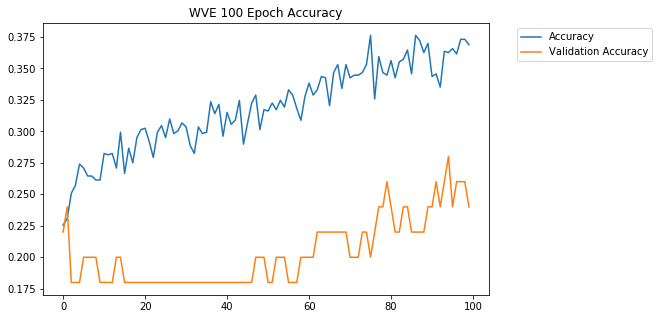

Train on 1415 samples, validate on 50 samples
Epoch 1/100
1415/1415 [==============================] - 0s 215us/step - loss: 1.9505 - acc: 0.2452 - val_loss: 1.9712 - val_acc: 0.1400
Epoch 2/100
1415/1415 [==============================] - 0s 208us/step - loss: 1.8797 - acc: 0.2622 - val_loss: 1.8982 - val_acc: 0.1200
Epoch 3/100
1415/1415 [==============================] - 0s 220us/step - loss: 1.8171 - acc: 0.2693 - val_loss: 1.8870 - val_acc: 0.1000
Epoch 4/100
1415/1415 [==============================] - 0s 225us/step - loss: 1.8215 - acc: 0.2700 - val_loss: 1.8738 - val_acc: 0.1000
Epoch 5/100
1415/1415 [==============================] - 0s 210us/step - loss: 1.8059 - acc: 0.2700 - val_loss: 1.8637 - val_acc: 0.1000
Epoch 6/100
1415/1415 [==============================] - 0s 221us/step - loss: 1.8076 - acc: 0.2806 - val_loss: 1.8603 - val_acc: 0.1000
Epoch 7/100
1415/1415 [==============================] - 0s 218us/step - loss: 1.7999 - acc: 0.2700 - val_loss: 1.8581 - val_acc: 0.

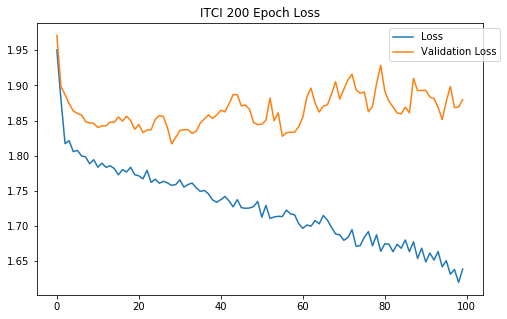

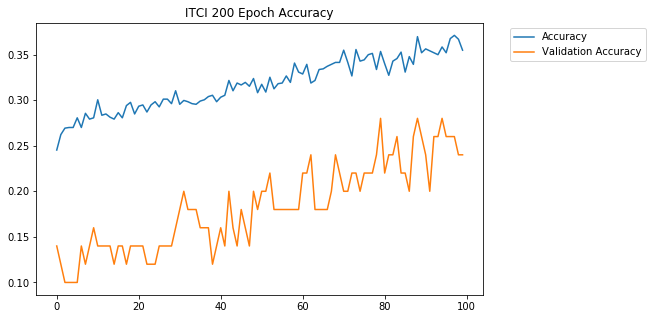

Train on 943 samples, validate on 50 samples
Epoch 1/100
943/943 [==============================] - 0s 221us/step - loss: 1.9098 - acc: 0.2513 - val_loss: 1.9287 - val_acc: 0.1400
Epoch 2/100
943/943 [==============================] - 0s 218us/step - loss: 1.8792 - acc: 0.2322 - val_loss: 1.8877 - val_acc: 0.1600
Epoch 3/100
943/943 [==============================] - 0s 230us/step - loss: 1.8442 - acc: 0.2492 - val_loss: 1.8633 - val_acc: 0.2000
Epoch 4/100
943/943 [==============================] - 0s 237us/step - loss: 1.8394 - acc: 0.2534 - val_loss: 1.8569 - val_acc: 0.2000
Epoch 5/100
943/943 [==============================] - 0s 231us/step - loss: 1.8304 - acc: 0.2481 - val_loss: 1.8506 - val_acc: 0.2200
Epoch 6/100
943/943 [==============================] - 0s 224us/step - loss: 1.8104 - acc: 0.2747 - val_loss: 1.8525 - val_acc: 0.2000
Epoch 7/100
943/943 [==============================] - 0s 233us/step - loss: 1.8117 - acc: 0.2598 - val_loss: 1.8506 - val_acc: 0.2000
Epoch 8/10

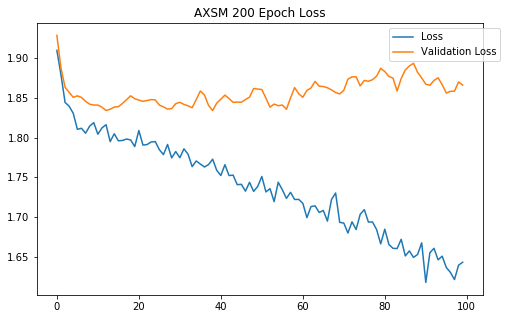

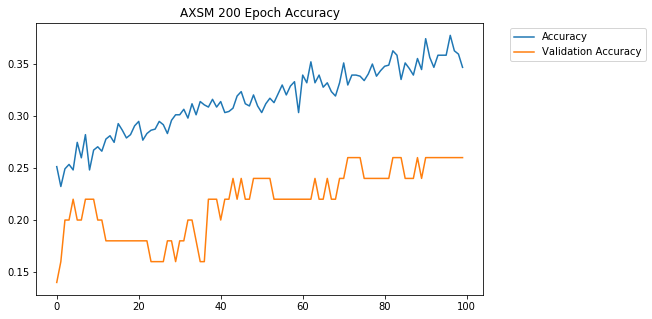

Train on 4939 samples, validate on 50 samples
Epoch 1/100
4939/4939 [==============================] - 1s 227us/step - loss: 1.8224 - acc: 0.2604 - val_loss: 1.8479 - val_acc: 0.3800
Epoch 2/100
4939/4939 [==============================] - 1s 217us/step - loss: 1.7765 - acc: 0.2679 - val_loss: 1.8789 - val_acc: 0.3600
Epoch 3/100
4939/4939 [==============================] - 1s 215us/step - loss: 1.7621 - acc: 0.2780 - val_loss: 1.8873 - val_acc: 0.3600
Epoch 4/100
4939/4939 [==============================] - 1s 218us/step - loss: 1.7640 - acc: 0.2685 - val_loss: 1.8751 - val_acc: 0.4400
Epoch 5/100
4939/4939 [==============================] - 1s 217us/step - loss: 1.7534 - acc: 0.2796 - val_loss: 1.8937 - val_acc: 0.3000
Epoch 6/100
4939/4939 [==============================] - 1s 208us/step - loss: 1.7473 - acc: 0.2802 - val_loss: 1.9134 - val_acc: 0.3200
Epoch 7/100
4939/4939 [==============================] - 1s 217us/step - loss: 1.7469 - acc: 0.2792 - val_loss: 1.9203 - val_acc: 0.

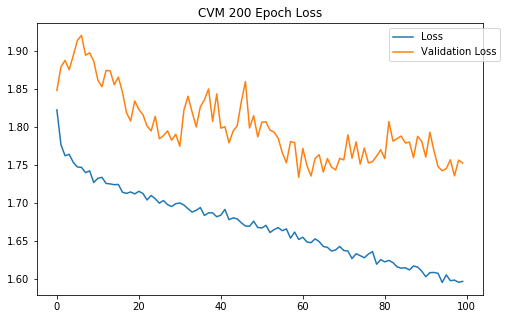

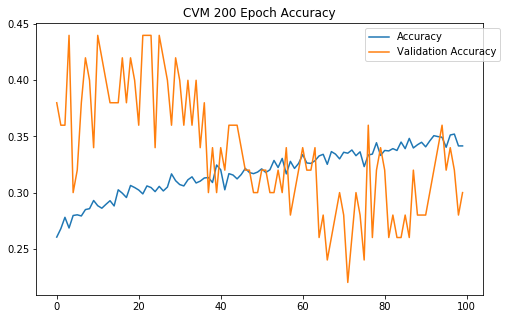

Train on 37 samples, validate on 50 samples
Epoch 1/100
37/37 [==============================] - 0s 768us/step - loss: 1.8538 - acc: 0.1892 - val_loss: 2.0236 - val_acc: 0.3200
Epoch 2/100
37/37 [==============================] - 0s 795us/step - loss: 1.9311 - acc: 0.2162 - val_loss: 2.0228 - val_acc: 0.3200
Epoch 3/100
37/37 [==============================] - 0s 693us/step - loss: 1.9665 - acc: 0.2162 - val_loss: 2.0215 - val_acc: 0.3200
Epoch 4/100
37/37 [==============================] - 0s 690us/step - loss: 2.1026 - acc: 0.1622 - val_loss: 2.0205 - val_acc: 0.3200
Epoch 5/100
37/37 [==============================] - 0s 720us/step - loss: 1.8958 - acc: 0.2162 - val_loss: 2.0197 - val_acc: 0.3200
Epoch 6/100
37/37 [==============================] - 0s 694us/step - loss: 1.9245 - acc: 0.1351 - val_loss: 2.0191 - val_acc: 0.3200
Epoch 7/100
37/37 [==============================] - 0s 696us/step - loss: 1.8353 - acc: 0.1892 - val_loss: 2.0167 - val_acc: 0.3200
Epoch 8/100
37/37 [======

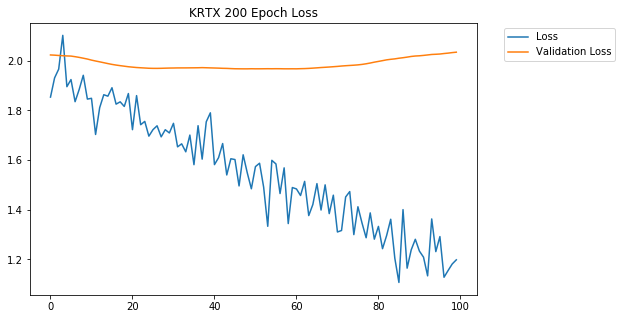

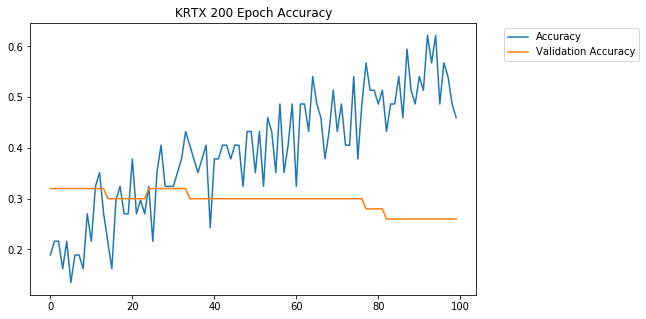

Train on 447 samples, validate on 50 samples
Epoch 1/100
447/447 [==============================] - 0s 284us/step - loss: 2.1859 - acc: 0.1902 - val_loss: 2.0380 - val_acc: 0.2600
Epoch 2/100
447/447 [==============================] - 0s 264us/step - loss: 2.0054 - acc: 0.2573 - val_loss: 1.9639 - val_acc: 0.2400
Epoch 3/100
447/447 [==============================] - 0s 245us/step - loss: 1.9491 - acc: 0.2506 - val_loss: 1.9090 - val_acc: 0.2600
Epoch 4/100
447/447 [==============================] - 0s 237us/step - loss: 1.8850 - acc: 0.2662 - val_loss: 1.8658 - val_acc: 0.2800
Epoch 5/100
447/447 [==============================] - 0s 241us/step - loss: 1.8427 - acc: 0.2707 - val_loss: 1.8475 - val_acc: 0.2800
Epoch 6/100
447/447 [==============================] - 0s 246us/step - loss: 1.8206 - acc: 0.2752 - val_loss: 1.8356 - val_acc: 0.2800
Epoch 7/100
447/447 [==============================] - 0s 241us/step - loss: 1.8261 - acc: 0.2752 - val_loss: 1.8284 - val_acc: 0.2800
Epoch 8/10

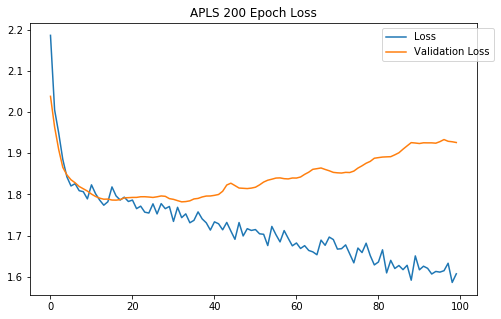

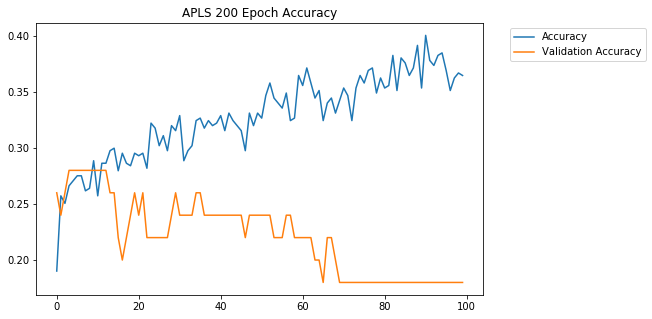

Train on 271 samples, validate on 50 samples
Epoch 1/100
271/271 [==============================] - 0s 293us/step - loss: 2.1050 - acc: 0.2325 - val_loss: 1.9073 - val_acc: 0.1800
Epoch 2/100
271/271 [==============================] - 0s 264us/step - loss: 2.0859 - acc: 0.2435 - val_loss: 1.8970 - val_acc: 0.2000
Epoch 3/100
271/271 [==============================] - 0s 239us/step - loss: 2.0029 - acc: 0.2140 - val_loss: 1.8958 - val_acc: 0.2400
Epoch 4/100
271/271 [==============================] - 0s 248us/step - loss: 1.9737 - acc: 0.2546 - val_loss: 1.8981 - val_acc: 0.2400
Epoch 5/100
271/271 [==============================] - 0s 237us/step - loss: 1.9093 - acc: 0.2509 - val_loss: 1.8967 - val_acc: 0.2800
Epoch 6/100
271/271 [==============================] - 0s 253us/step - loss: 1.8818 - acc: 0.2546 - val_loss: 1.8948 - val_acc: 0.2800
Epoch 7/100
271/271 [==============================] - 0s 269us/step - loss: 1.9052 - acc: 0.2546 - val_loss: 1.8944 - val_acc: 0.2600
Epoch 8/10

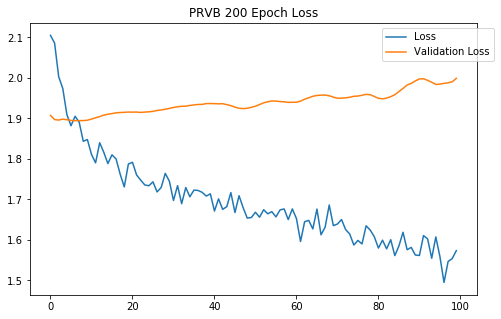

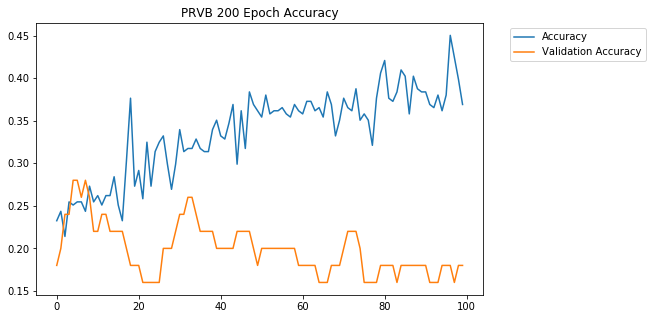

Train on 72 samples, validate on 50 samples
Epoch 1/100
72/72 [==============================] - 0s 492us/step - loss: 2.2258 - acc: 0.1806 - val_loss: 1.7977 - val_acc: 0.3200
Epoch 2/100
72/72 [==============================] - 0s 402us/step - loss: 2.1927 - acc: 0.1806 - val_loss: 1.7926 - val_acc: 0.3200
Epoch 3/100
72/72 [==============================] - 0s 364us/step - loss: 2.0604 - acc: 0.2222 - val_loss: 1.7856 - val_acc: 0.3200
Epoch 4/100
72/72 [==============================] - 0s 366us/step - loss: 2.1595 - acc: 0.2222 - val_loss: 1.7771 - val_acc: 0.3200
Epoch 5/100
72/72 [==============================] - 0s 373us/step - loss: 2.0878 - acc: 0.1806 - val_loss: 1.7682 - val_acc: 0.3200
Epoch 6/100
72/72 [==============================] - 0s 379us/step - loss: 2.1257 - acc: 0.2500 - val_loss: 1.7606 - val_acc: 0.3200
Epoch 7/100
72/72 [==============================] - 0s 392us/step - loss: 2.0901 - acc: 0.1806 - val_loss: 1.7523 - val_acc: 0.3200
Epoch 8/100
72/72 [======

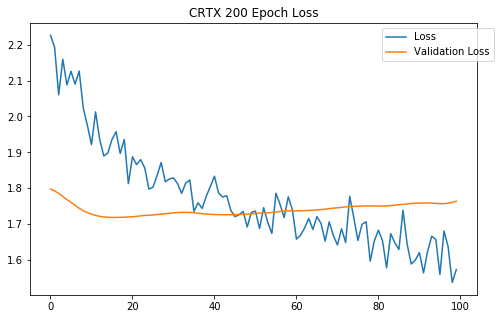

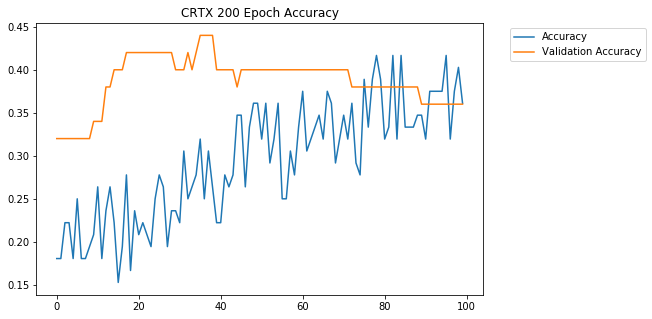

Train on 1567 samples, validate on 50 samples
Epoch 1/100
1567/1567 [==============================] - 0s 222us/step - loss: 1.9542 - acc: 0.2495 - val_loss: 1.7241 - val_acc: 0.3600
Epoch 2/100
1567/1567 [==============================] - 0s 219us/step - loss: 1.8915 - acc: 0.2559 - val_loss: 1.7231 - val_acc: 0.3400
Epoch 3/100
1567/1567 [==============================] - 0s 207us/step - loss: 1.8533 - acc: 0.2604 - val_loss: 1.7289 - val_acc: 0.3400
Epoch 4/100
1567/1567 [==============================] - 0s 206us/step - loss: 1.8557 - acc: 0.2578 - val_loss: 1.7279 - val_acc: 0.3600
Epoch 5/100
1567/1567 [==============================] - 0s 218us/step - loss: 1.8500 - acc: 0.2706 - val_loss: 1.7340 - val_acc: 0.3400
Epoch 6/100
1567/1567 [==============================] - 0s 206us/step - loss: 1.8413 - acc: 0.2699 - val_loss: 1.7341 - val_acc: 0.3600
Epoch 7/100
1567/1567 [==============================] - 0s 208us/step - loss: 1.8395 - acc: 0.2610 - val_loss: 1.7314 - val_acc: 0.

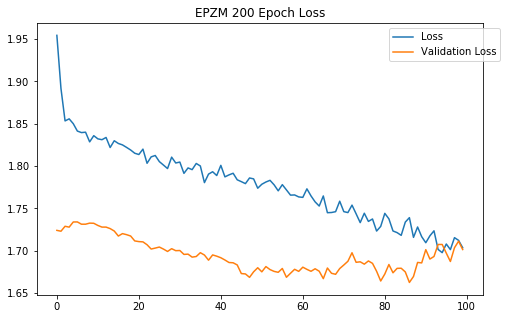

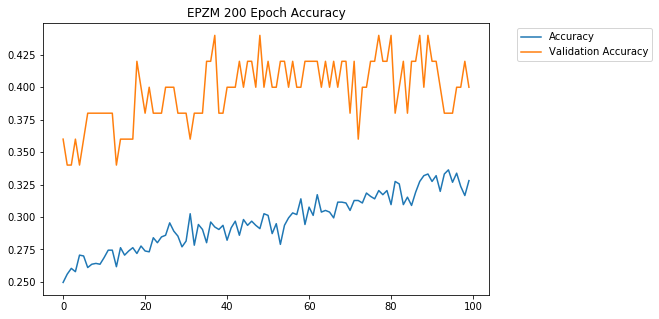

Train on 1212 samples, validate on 50 samples
Epoch 1/100
1212/1212 [==============================] - 0s 226us/step - loss: 1.9218 - acc: 0.2550 - val_loss: 1.7376 - val_acc: 0.2600
Epoch 2/100
1212/1212 [==============================] - 0s 218us/step - loss: 1.8867 - acc: 0.2541 - val_loss: 1.7647 - val_acc: 0.3000
Epoch 3/100
1212/1212 [==============================] - 0s 218us/step - loss: 1.8419 - acc: 0.2459 - val_loss: 1.7403 - val_acc: 0.3400
Epoch 4/100
1212/1212 [==============================] - 0s 217us/step - loss: 1.8301 - acc: 0.2640 - val_loss: 1.7390 - val_acc: 0.3400
Epoch 5/100
1212/1212 [==============================] - 0s 284us/step - loss: 1.8401 - acc: 0.2566 - val_loss: 1.7477 - val_acc: 0.3400
Epoch 6/100
1212/1212 [==============================] - 0s 259us/step - loss: 1.8196 - acc: 0.2772 - val_loss: 1.7444 - val_acc: 0.3200
Epoch 7/100
1212/1212 [==============================] - 0s 242us/step - loss: 1.8214 - acc: 0.2673 - val_loss: 1.7367 - val_acc: 0.

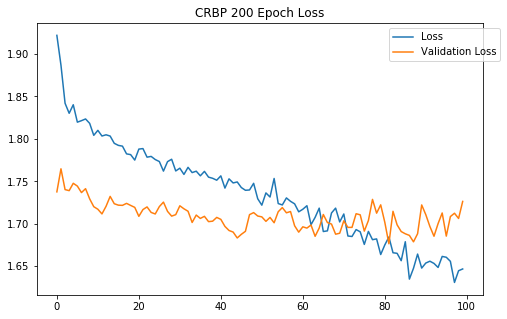

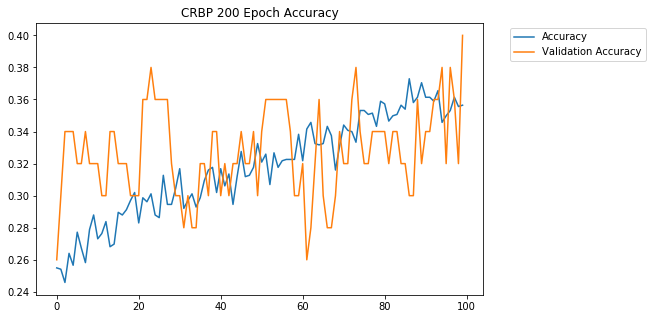

Train on 1895 samples, validate on 50 samples
Epoch 1/100
1895/1895 [==============================] - 0s 252us/step - loss: 1.8964 - acc: 0.2454 - val_loss: 1.7783 - val_acc: 0.3000
Epoch 2/100
1895/1895 [==============================] - 0s 209us/step - loss: 1.8316 - acc: 0.2734 - val_loss: 1.7556 - val_acc: 0.3200
Epoch 3/100
1895/1895 [==============================] - 0s 211us/step - loss: 1.8232 - acc: 0.2649 - val_loss: 1.7391 - val_acc: 0.3400
Epoch 4/100
1895/1895 [==============================] - 0s 216us/step - loss: 1.8016 - acc: 0.2702 - val_loss: 1.7387 - val_acc: 0.3200
Epoch 5/100
1895/1895 [==============================] - 0s 199us/step - loss: 1.8100 - acc: 0.2744 - val_loss: 1.7384 - val_acc: 0.3000
Epoch 6/100
1895/1895 [==============================] - 0s 212us/step - loss: 1.7985 - acc: 0.2797 - val_loss: 1.7450 - val_acc: 0.2800
Epoch 7/100
1895/1895 [==============================] - 0s 204us/step - loss: 1.7914 - acc: 0.2897 - val_loss: 1.7401 - val_acc: 0.

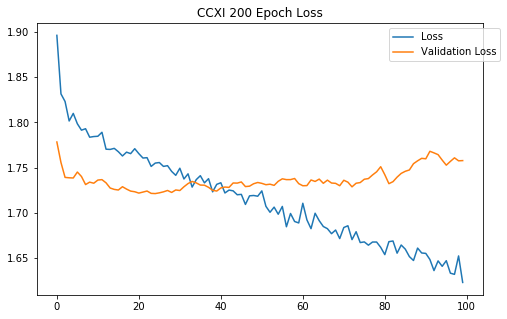

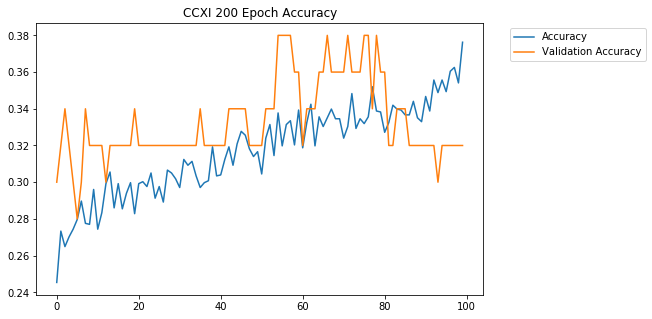

Train on 2342 samples, validate on 50 samples
Epoch 1/100
2342/2342 [==============================] - 0s 209us/step - loss: 1.8050 - acc: 0.3173 - val_loss: 1.6797 - val_acc: 0.3000
Epoch 2/100
2342/2342 [==============================] - 1s 215us/step - loss: 1.7315 - acc: 0.3424 - val_loss: 1.6908 - val_acc: 0.3400
Epoch 3/100
2342/2342 [==============================] - 0s 201us/step - loss: 1.7033 - acc: 0.3488 - val_loss: 1.6635 - val_acc: 0.3400
Epoch 4/100
 100/2342 [>.............................] - ETA: 0s - loss: 1.5888 - acc: 0.3800

In [0]:
for i in range(1, 4):
    for stock in stocks:
        X = [i['Target'] for i in data[stock]]
        X = np.array(X)
        y = [i['Low_1'] for i in data[stock]]
        y = np.array(y).reshape(len(y),7)

        X_train, X_test, y_train, y_test = X[:-50], X[-50:], y[:-50], y[-50:]
        model.fit(X_train, y_train, batch_size=100, epochs=100, validation_data=(X_test, y_test), verbose=1 )
        dict_ = model.history.history
        plt.figure(figsize=(8,5))
        plt.title(f"{stock} {i*100} Epoch Loss")
        plt.plot(dict_['loss'], label = 'Loss')
        plt.plot(dict_['val_loss'], label= 'Validation Loss')
        plt.legend(bbox_to_anchor=(1.05, 1))
        plt.show()
        plt.figure(figsize=(8,5))
        plt.title(f"{stock} {i*100} Epoch Accuracy")
        plt.plot(dict_['acc'], label = 'Accuracy')
        plt.plot(dict_['val_acc'], label= 'Validation Accuracy')
        plt.legend(bbox_to_anchor=(1.05, 1))
        plt.show()


        model.save_weights(f'model_conv1d_{i*1000}.h5')

In [11]:
dict_.keys()

dict_keys(['val_loss', 'val_acc', 'loss', 'acc'])